# **Marketing Campaign Analysis**

## **Problem Definition**

### **The Context:**

 - Why is this problem important to solve?

    - Marketing analysis is very important in today world. Understanding and analyzing customer behavior is pivital to modern retailers. When a company has a lot of data on their customers it is important to use that to identify how to better market to these customers. This can lead to better customer churn and improve customer satisfaction with the company, which inturn will increase profits and grow the company. A comprehensive marketing analysis can lead to understanding of the customer preferences, which will lead to understanding marketing stategies that will resonate with these different customers. This can grow how much existing customers spend on our products but can also help identify ways to keep customers who are not spending as much. It is also important to understand which marketing campaigns are effective, which will allow more effective allocation of marketing resources in the future.
    - Understanding the demographics of the customers is also important to try and customize marketing strategies for them so that it can feel more personalized to those customers. Such as housholds with children or older adults, all of these are important to factor in. This can lead to better customer satisfaction as they feel they are personally being provided for.   
    - It is also important to understand which products are being sold the most so that those products can be stocked accordingly. Also which products are not doing well and might need stategies around to make them more profitable.   

### **The objective:**

 - What is the intended goal?
    
    - The intended goal is to understand the characteristics of the customers and to see if there are groups in the customers. This can lead to understanding the different groups of customers for marketing campaigns based on the characteristics of the customer. This can ultimately lead to the goal of improving revenue, improving customer satisfaction, improving marketing campaigns.

### **The key questions:**

- What are the key questions that need to be answered?
    - Are there preprocessing steps required?
    - Are there any features that can be added?
    - What are the distributions of the features?
    - How do different features correlate to each other?
    - Should we cluster using all features?
    - Can PCA or t-SNE help improve clustering?
    - Can the data be clustered into distinct groups based on purchasing behavior or segmentation attributes?
    - Do the clusters have unique characteristics?
    - How many clusters should there be?
    - Which clustering algorithms perform the best?
    - Can we use these clusters to better understand customer's purchasing power, methods, engagment?
    - Can these clusters be used to understand which customers accepted existing campaigns?
    - Can we use these clusters to better understand the demographics of our customers?
    - Can we use these clusters for marketing campaigns?
    - Is the model good enough for deployment?

### **The problem formulation**:

- What is it that we are trying to solve using data science?
    - We are trying to use statistical and visual methods to explore the data, to better understand it. This can be exploring the structure of the data such as the data types, to fixing errors in the data. Correlation of variables is another important issue to solve. Feature engineering from existing data is also another important issue that can lead to better modeling. It can be hard to cluster data so using technique such as PCA and t-SNE can be an imporant step in solving clustering in data. Using various clustering algorithms can utilize the power of these algorithms to solving the problem of clustering customers. Once clustered data science again can visualize and describe these clusters in detail to extract insights into these clusters. These clusters can then be used in the future to help business decisions and marketing campaings. All of this can be solved using data science. 

------------------------------
## **Data Dictionary**
------------------------------

The dataset contains the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** You can assume that the data is collected in the year 2016.

## **Import the necessary libraries and load the data**

In [1]:
# Import Pandas
import pandas as pd

# Import seaborn
import seaborn as sns

# Import numpy
import numpy as np

# Import matplotlib 
import matplotlib.pyplot as plt

# Import Datatime for some datatime calculations
from datetime import datetime

# Import PCA 
from sklearn.decomposition import PCA

# Import t-SNE
from sklearn.manifold import TSNE

# Import k-means for clustering
from sklearn.cluster import KMeans

# To scale the data using z-score 
from sklearn.preprocessing import StandardScaler

# Used for finding optimal clusters 
from sklearn.metrics import silhouette_score

# Import k-mediods for clustering
from sklearn_extra.cluster import KMedoids
# Import cdist
from scipy.spatial.distance import cdist  

# Importing hierarchical clustering libraries
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from sklearn.cluster import AgglomerativeClustering

# Import DBSCAN for clustering
from sklearn.cluster import DBSCAN

# Import GaussianMixture for clustering
from sklearn.mixture import GaussianMixture

# Set the display option to show all columns
pd.set_option('display.max_columns', None)

# Disable warnings 
import warnings
warnings.filterwarnings('ignore')

## **Data Overview**

- Reading the dataset
- Understanding the shape of the dataset
- Checking the data types
- Checking for missing values
- Checking for duplicated values
- Drop the column which has no null values

In [2]:
# Load the data into a pandas dataframe
df = pd.read_csv('marketing_campain.csv')

In [3]:
# view the first 5 elements in the data
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


In [4]:
# view the last 5 elements in the data
df.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0
2239,9405,1954,PhD,Married,52869.0,1,1,15-10-2012,40,84,3,61,2,1,21,3,3,1,4,7,0,0,0,0,0,0,1


In [5]:
# Display the shape of the data (rows, columns)
df.shape

(2240, 27)

In [6]:
# Display wide range of info on the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

**Observations:**
- There are **27 columns** with **2240 observations (rows)** in the dataset
- There are three datatypes in the data that being, **1 float64**, **23 int64**, and **3 objects**.

In [7]:
# Count null values in the data
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
dtype: int64

**Observations:**
- There are 24 missing values in the Income column
- No other column has missing values

In [8]:
# Count how many duplicate rows are in the data
df.duplicated().sum()

0

**Observations:**
- There are no duplicates in the data

In [9]:
# Count the number of unique values in each column
df.nunique()

ID                     2240
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1974
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Response                  2
dtype: int64

#### **Observations and Insights from the Data overview:**
- There are **27 columns** with **2240 observations (rows)** in the dataset
- There are three datatypes in the data that being, **1 float64**, **23 int64**, and **3 objects**.
    - We should investigate the objects in EDA. These columns are **Education**, **Marital_Status**, and **Dt_Customer**.
- The only column with null values is **Income with 24 missing values**. These can be imputed/removed later
- There are **no duplicate rows** in the data
- The **ID column can be removed** as its an index for the dataset, this column wont bring meaninfull insights to the data.

## **Exploratory Data Analysis (EDA)**


- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights
3. Are all categories different from each other or can we combine some categories? Is 2n Cycle different from Master?
4. There are 8 categories in Marital_Status with some categories having very low count of less than 5. Can we combine these categories with other categories?

In [10]:
# View basic statistics on each column in the data rounded to the hundredths place
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.16,3246.66,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.81,11.98,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.25,25173.08,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.44,0.54,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.51,0.54,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.11,28.96,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.94,336.60,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.30,39.77,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.95,225.72,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.53,54.63,0.0,3.00,12.0,50.00,259.0


**Observations:**
- Again ID column can be removed as its just an index for the dataset
- **Year_Birth has someone who was born in 1893**, which doesnt seem like its correct, should remove.
- **Income seems to have some outliers**, should look to see if those should be removed.
- Product purchases seem to have a lot of outliers in each column, such as MntMeatProducts
- Other numerical variables seem to not have obvious outliers


In [11]:
# count the unique values in the Education column
df['Education'].value_counts()

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

**Observations:**
- 2n Cycle is the equivalent of a Masters, so these can be combined into one.
- The final number of values in the Education column will be 4 (Basic, Graduation, Master, PhD)

In [12]:
# count the unique values in the Marital_Status column
df['Marital_Status'].value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

**Observations:**
- The majority of customers are either married or together.
- Columns Alone, Absurd, and YOLO should be combined into Single

In [13]:
# count the unique values in the Dt_Customer column
df['Dt_Customer'].value_counts()

31-08-2012    12
12-09-2012    11
14-02-2013    11
12-05-2014    11
20-08-2013    10
              ..
05-08-2012     1
18-11-2012     1
25-05-2013     1
14-04-2013     1
09-01-2014     1
Name: Dt_Customer, Length: 663, dtype: int64

**Observations:**
- Not clear how useful this particular column might be, perhaps feature engineering might be needed.

In [14]:
# Merg 2n Cycle and Master in Education column
df['Education'].replace('2n Cycle', 'Master', inplace=True)

In [15]:
# Merg Alone, Absurd, YOLO, and Single
df['Marital_Status'].replace(['Alone', 'Absurd', 'YOLO'], 'Single', inplace=True)

In [16]:
# count the unique values in the Education column
df['Education'].value_counts()

Graduation    1127
Master         573
PhD            486
Basic           54
Name: Education, dtype: int64

In [17]:
# count the unique values in the Marital_Status column
df['Marital_Status'].value_counts()

Married     864
Together    580
Single      487
Divorced    232
Widow        77
Name: Marital_Status, dtype: int64

In [18]:
# Remove the column ID from the dataset
df = df.drop(columns=['ID'], axis = 1)

### **Univariate Analysis on Numerical and Categorical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables. 

- Plot histogram and box plot for different numerical features and understand how the data looks like.
- Explore the categorical variables like Education, Kidhome, Teenhome, Complain.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. How does the distribution of Income variable vary across the dataset?
2. The histogram and the box plot are showing some extreme value on the right side of the distribution of the 'Income' feature. Can we consider them as outliers and remove or should we analyze these extreme values?
3. There are only a few rows with extreme values for the Income variable. Is that enough information to treat (or not to treat) them? At what percentile the upper whisker lies?


In [19]:
# Defining the hist_box(col) function which will plot a boxplot and distplot for a given column in the dataframe
def hist_box(col):
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={'height_ratios': (0.15, 0.85)}, figsize=(15, 10))
    sns.set(style='darkgrid')
    
    # Adding a graph in each part
    sns.boxplot(x=df[col], ax=ax_box, showmeans=True)
    sns.distplot(x=df[col], ax=ax_hist)
    
    # Adding descriptive statistic labels for visualizing the data
    mean_val = df[col].mean()
    median_val = df[col].median()
    std_val = df[col].std()
    q1_val = df[col].quantile(0.25)
    q2_val = df[col].quantile(0.5)
    q3_val = df[col].quantile(0.75)
    
    ax_hist.axvline(mean_val, color='green', linestyle='--', label=f'Mean: {mean_val:.2f}')
    ax_hist.axvline(median_val, color='orange', linestyle='-', label=f'Median: {median_val:.2f}')
    
    # Adding vertical lines for quartiles
    ax_hist.axvline(q1_val, color='blue', linestyle=':', label=f'Q1: {q1_val:.2f}')
    ax_hist.axvline(q2_val, color='purple', linestyle=':', label=f'Q2: {q2_val:.2f}')
    ax_hist.axvline(q3_val, color='red', linestyle=':', label=f'Q3: {q3_val:.2f}')
    # Display the legend
    ax_hist.legend()
    # Display the plot
    plt.show()

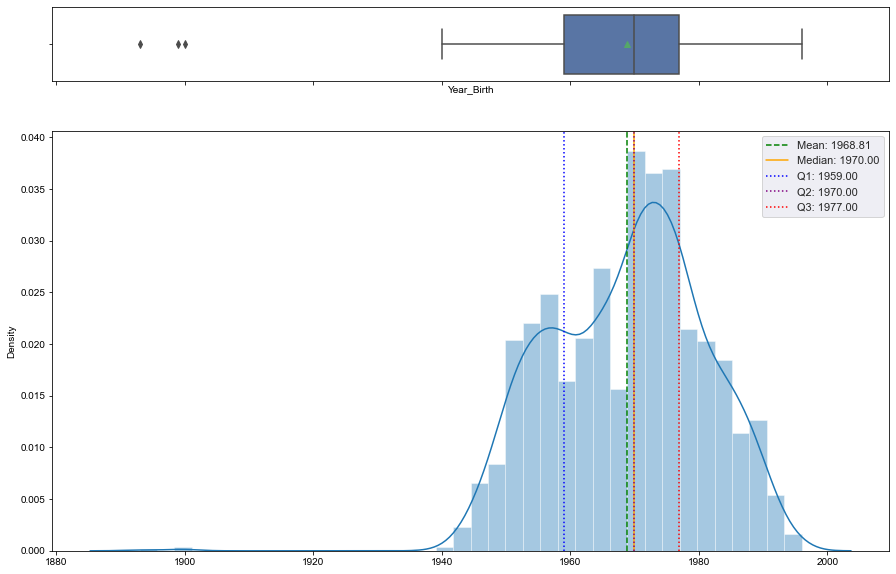

In [20]:
# Create a distibution and boxplot of Year_Birth column
hist_box('Year_Birth')

**Observations:**
- Year_Birth is heavily skewed to the left due to 3 major outliers, these values are > 1900 so they are probably errors which should be removed in preprocessing.

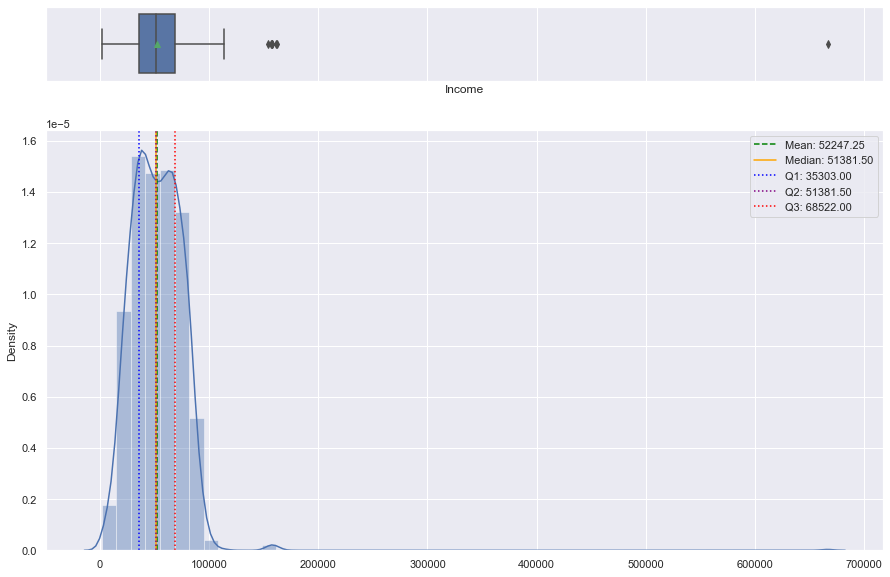

In [21]:
# Create a distibution and boxplot of Income column
hist_box('Income')

**Observations:**
- Income is heavily skewed to the right due to a few outliers, particularly 1 outliers that is greater than $600,000, this should be looked into if it should be removed. Although it looks like it should be removed.

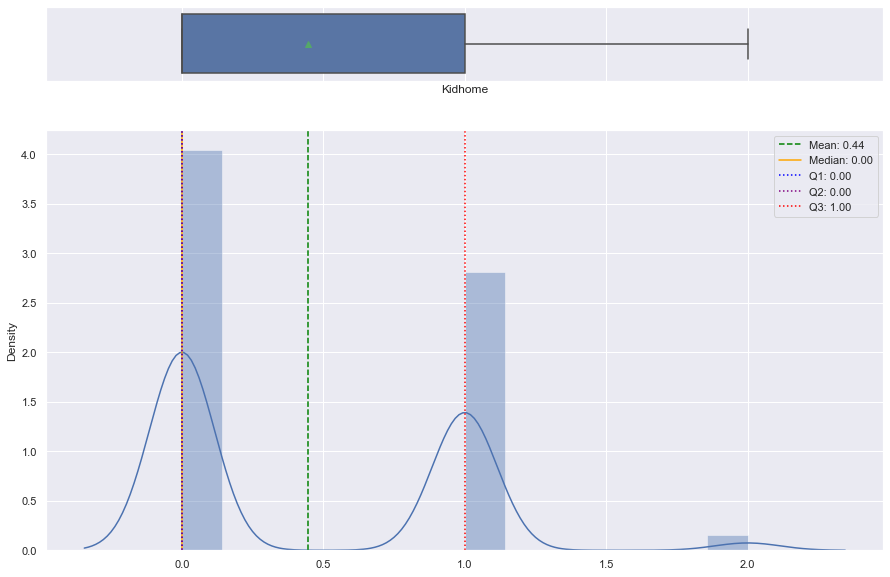

In [22]:
# Create a distibution and boxplot of Kidhome column
hist_box('Kidhome')

**Observations:**
- The majority of people do not have kids, followed closely by having 1 kid in the home, with a max of 2 being the smallest in the data.

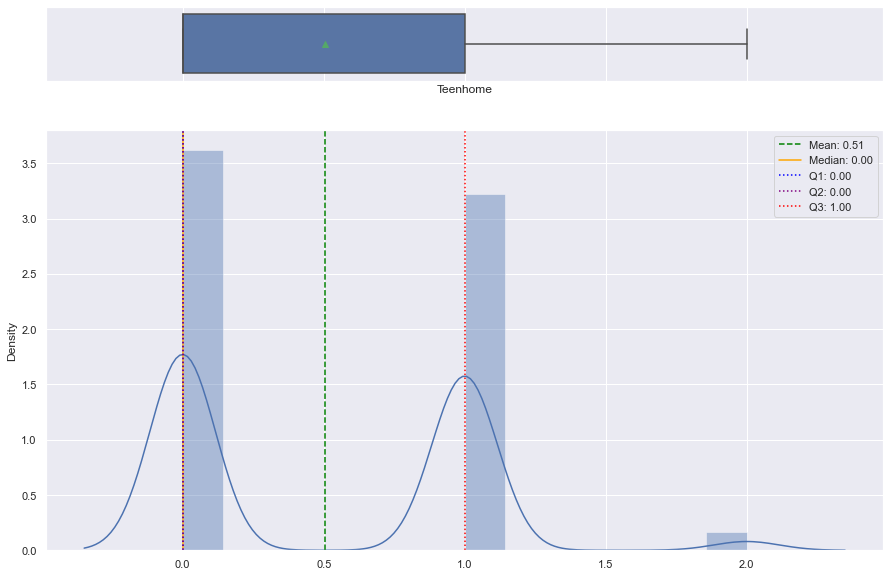

In [23]:
# Create a distibution and boxplot of Teenhome column
hist_box('Teenhome')

**Observations:**
- Teenhome is similar to kidhome in that most people dont have a teen, followed closely by having 1 teenn and a max of 2 with the smallest group in the data.

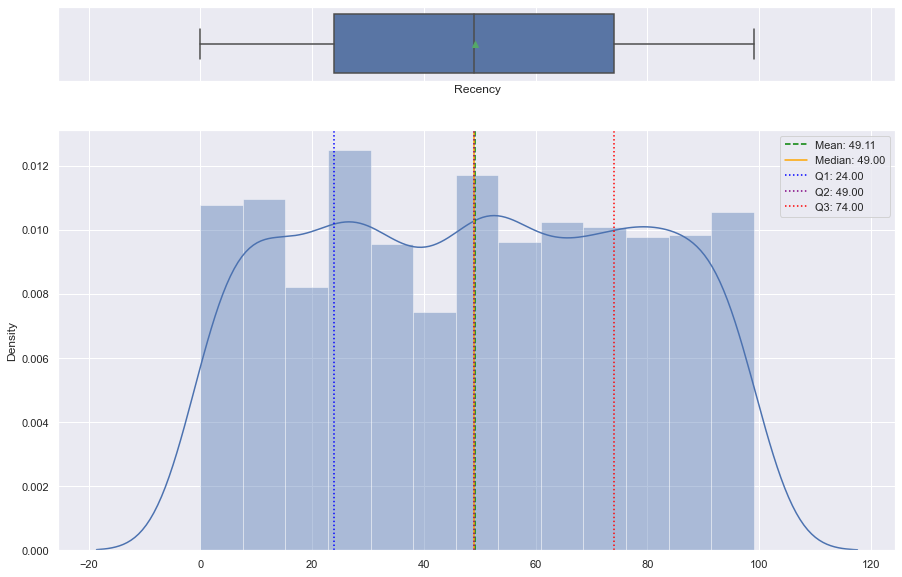

In [24]:
# Create a distibution and boxplot of Recency column
hist_box('Recency')

**Observations:**
- There are no outliers in the data, and the distribution looks normal

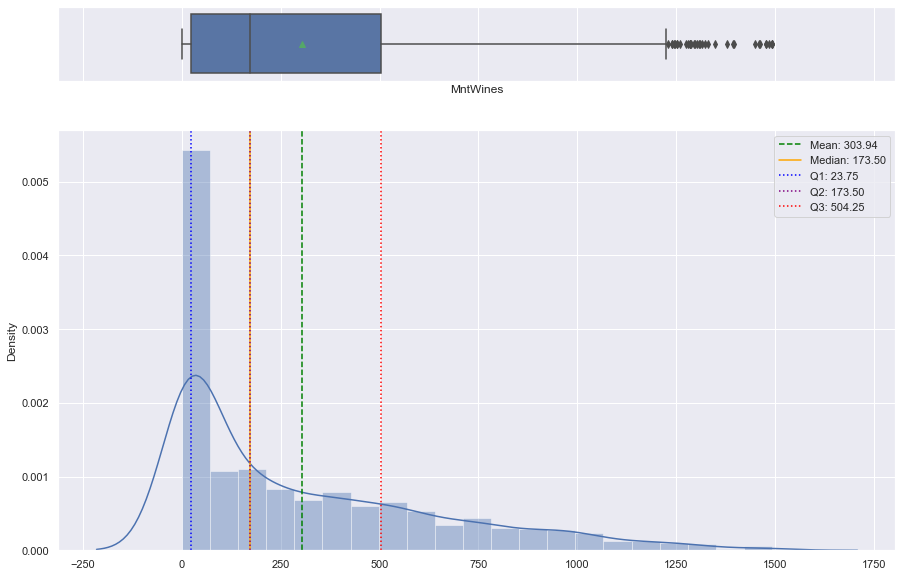

In [25]:
# Create a distibution and boxplot of MntWines column
hist_box('MntWines')

**Observations:**
- Wines is heavily right skewed by a decent amount of outliers, although they probably should not be removed, as they are close enough to the upper bounds.

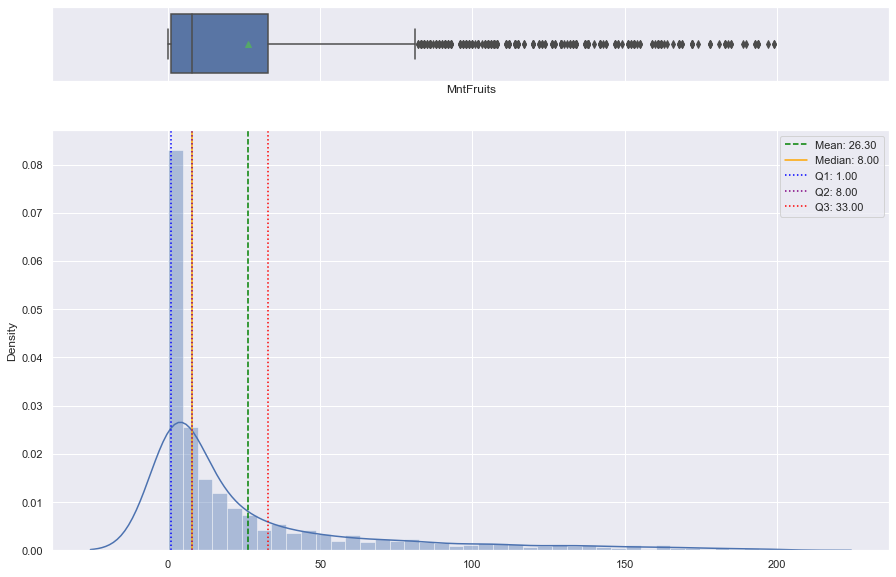

In [26]:
# Create a distibution and boxplot of MntFruits column
hist_box('MntFruits')

**Observations:**
- Fruits is heavily right skewed, the mean is raised by many amount of outliers

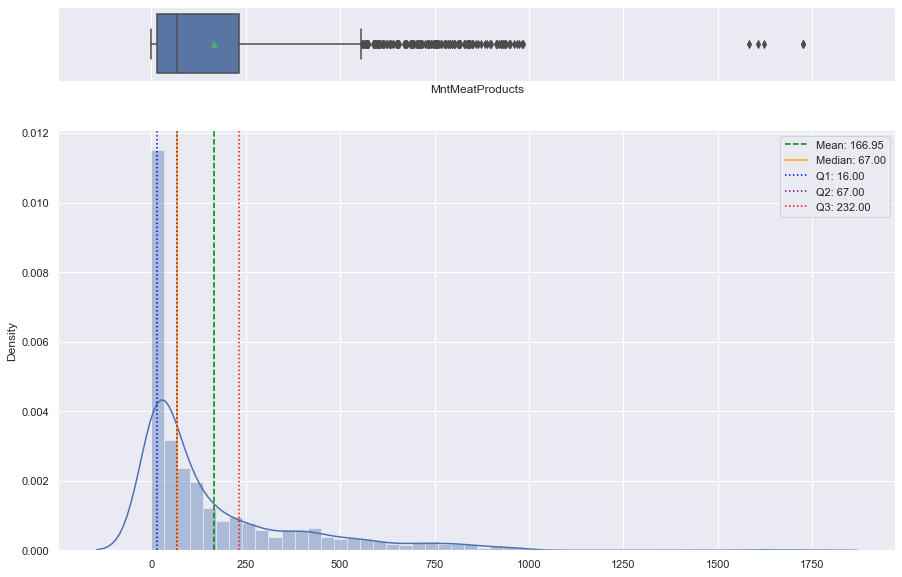

In [27]:
# Create a distibution and boxplot of MntMeatProducts column
hist_box('MntMeatProducts')

**Observations:**
- Meat products is also heavily right skewed, most of the outliers are close to the upper bounds, however 4 of them are very far away from the other outliers.

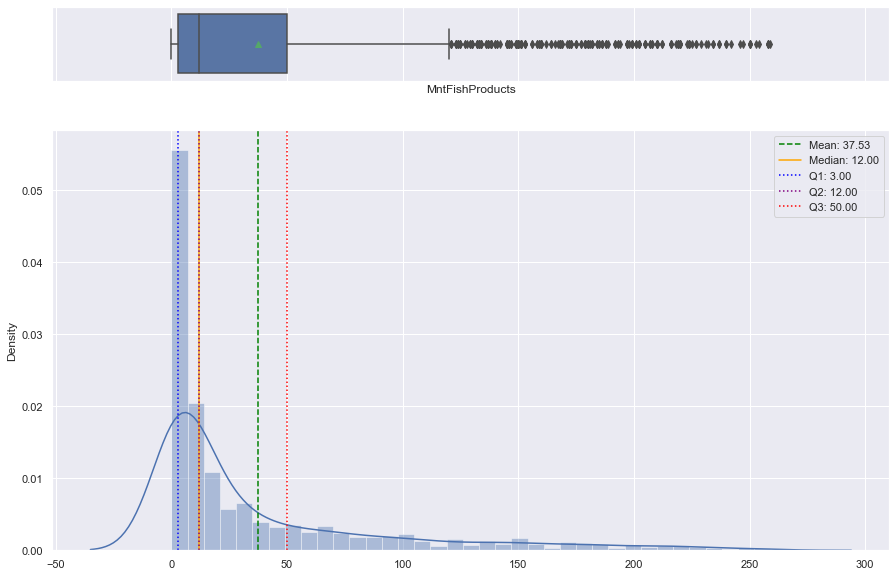

In [28]:
# Create a distibution and boxplot of MntFishProducts column
hist_box('MntFishProducts')

**Observations:**
- Fish products are also right skewed as their are many outliers, although most seem close to our upper bounds.

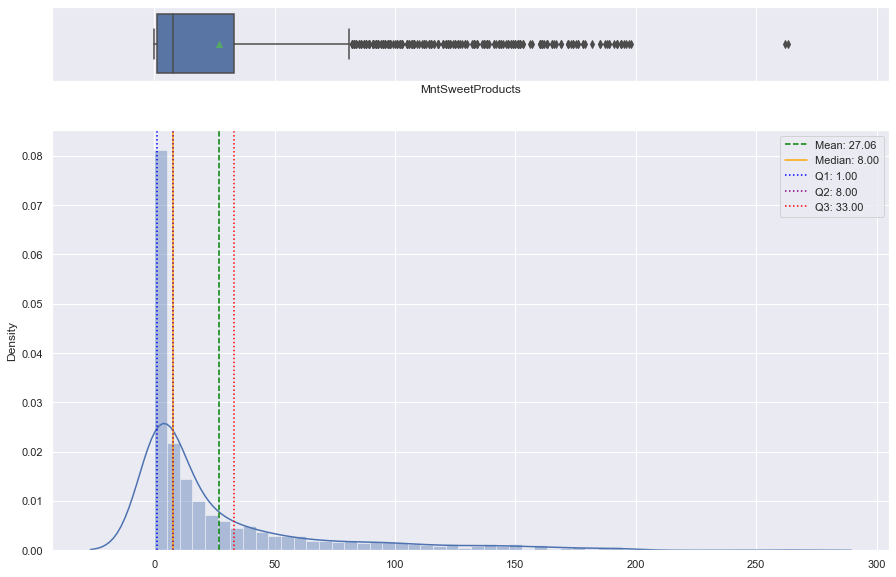

In [29]:
# Create a distibution and boxplot of MntSweetProducts column
hist_box('MntSweetProducts')

**Observations:**
- Sweet producs is also right skewed as their are many ourliers. Most of the outliers are close to the upp bounds and their are many, however, there are 2 outliers very far from the others.

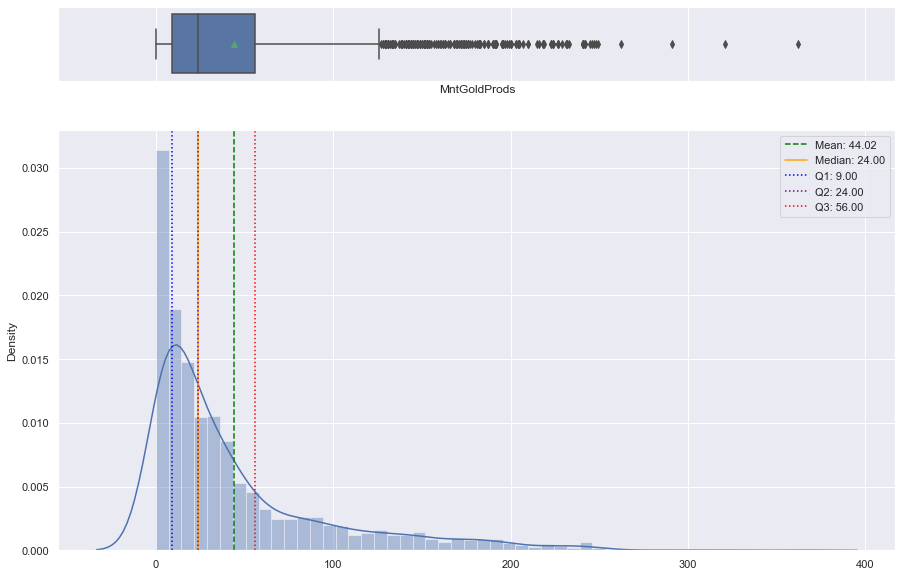

In [30]:
# Create a distibution and boxplot of MntGoldProds column
hist_box('MntGoldProds')

**Observations:**
- Gold products are right skewed, there are some outliers much farther out than others but it seems fairly normal.

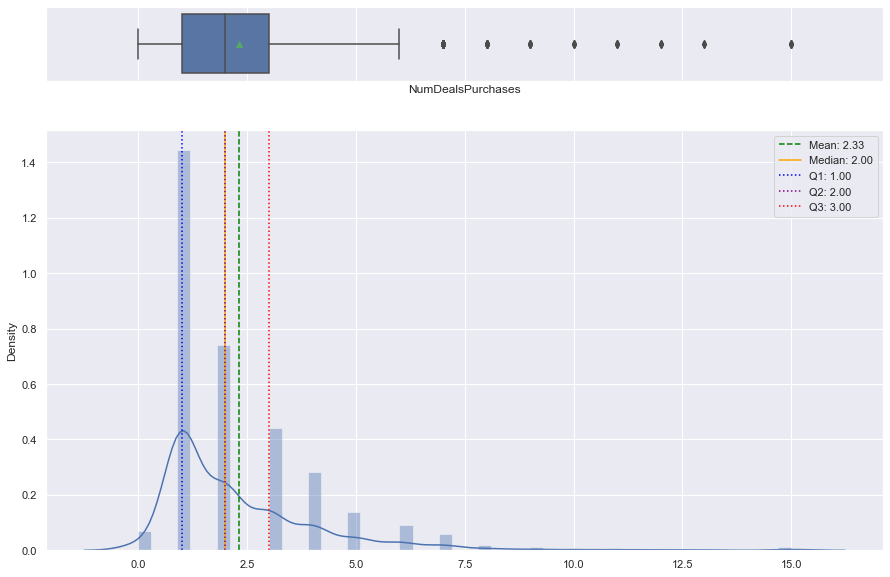

In [31]:
# Create a distibution and boxplot of NumDealsPurchases column
hist_box('NumDealsPurchases')

**Observations:**
- Num deals purchased is skewed to the right with a few outliers

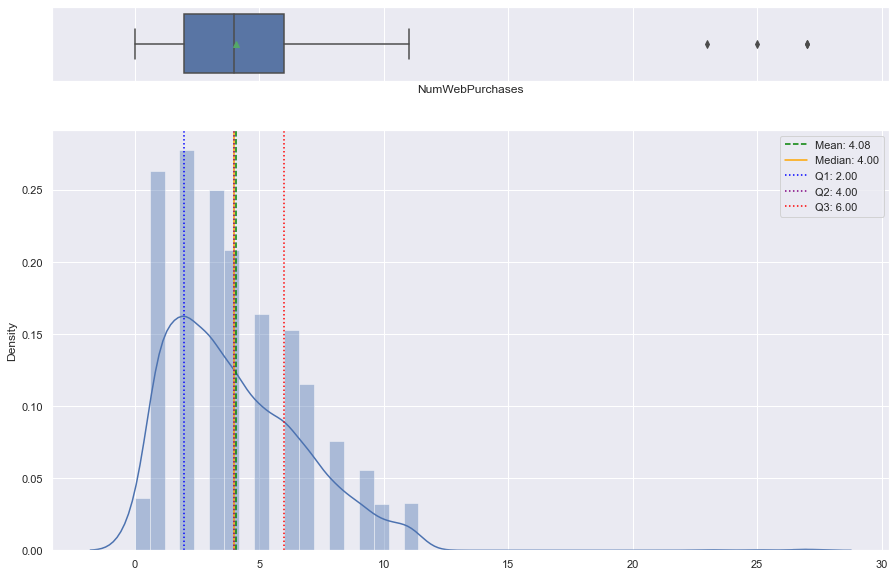

In [32]:
# Create a distibution and boxplot of NumWebPurchases column
hist_box('NumWebPurchases')

**Observations:**
- num web purchases is also right skewed, There are only 3 outliers

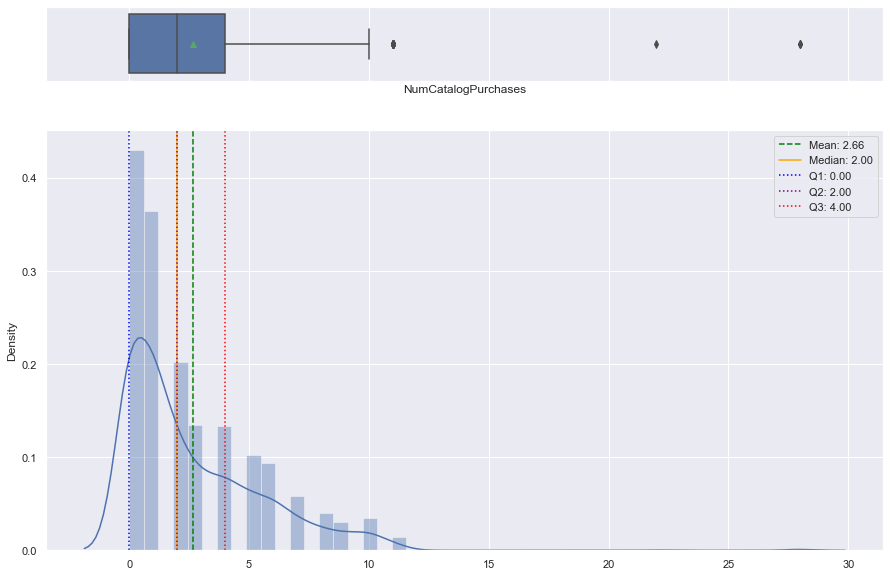

In [33]:
# Create a distibution and boxplot of NumCatalogPurchases column
hist_box('NumCatalogPurchases')

**Observations:**
- Catalog purchases is right skewed, with only 3 outiers

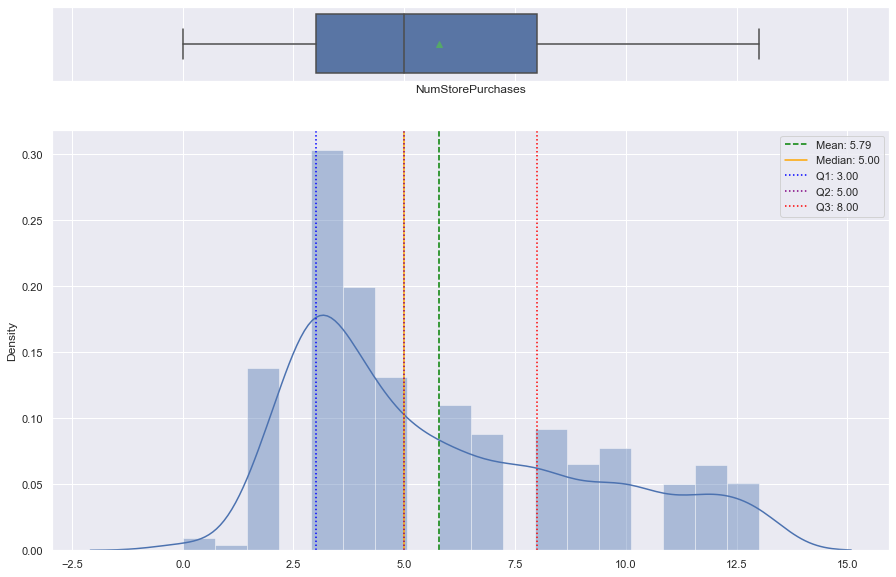

In [34]:
# Create a distibution and boxplot of NumStorePurchases column
hist_box('NumStorePurchases')

**Observations:**

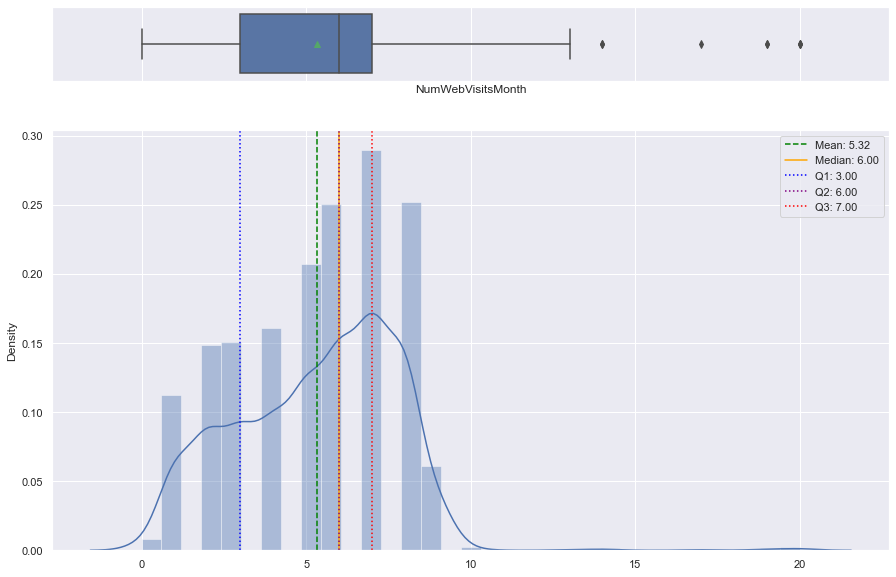

In [35]:
# Create a distibution and boxplot of NumWebVisitsMonth column
hist_box('NumWebVisitsMonth')

**Observations:**
- num web visists is right skewed, with only 4 outliers in the data

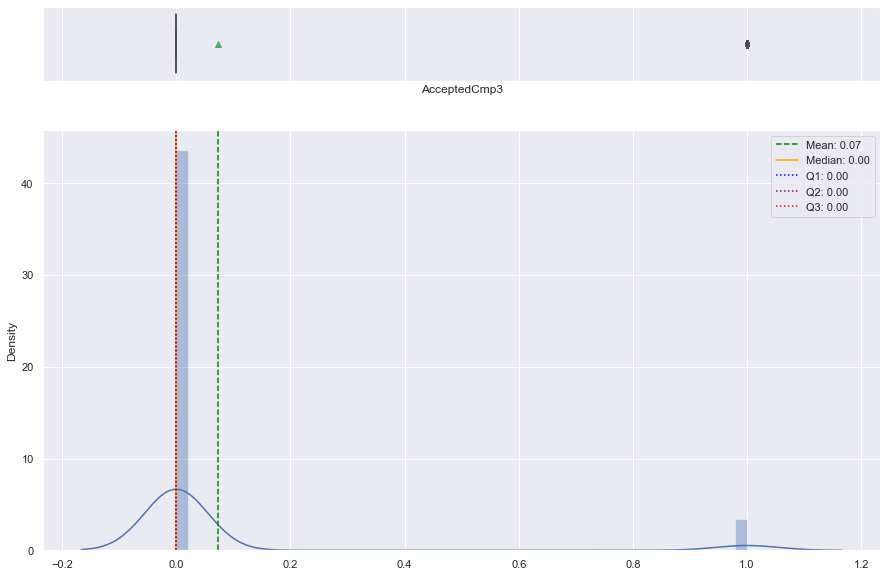

In [36]:
# Create a distibution and boxplot of AcceptedCmp3 column
hist_box('AcceptedCmp3')

**Observations:**
- The vast majority of people did not accept campaign 3

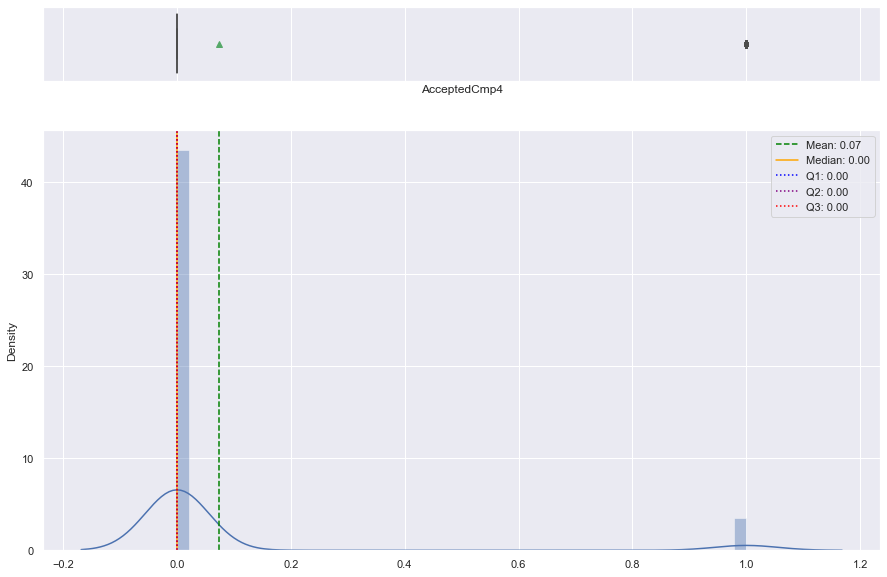

In [37]:
# Create a distibution and boxplot of AcceptedCmp4 column
hist_box('AcceptedCmp4')

**Observations:**
- The vast majority of people did not accept campaign 4

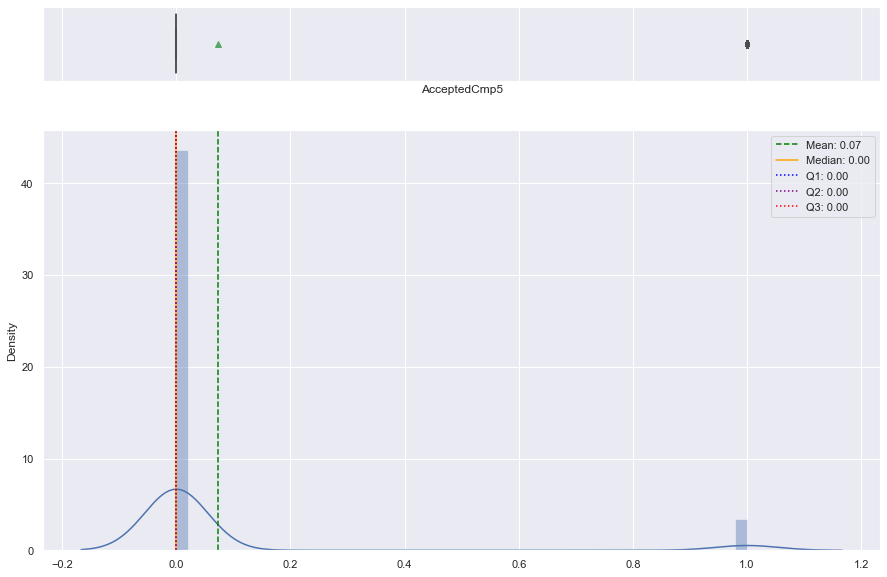

In [38]:
# Create a distibution and boxplot of AcceptedCmp5 column
hist_box('AcceptedCmp5')

**Observations:**
- The vast majority of people did not accept campaign 5

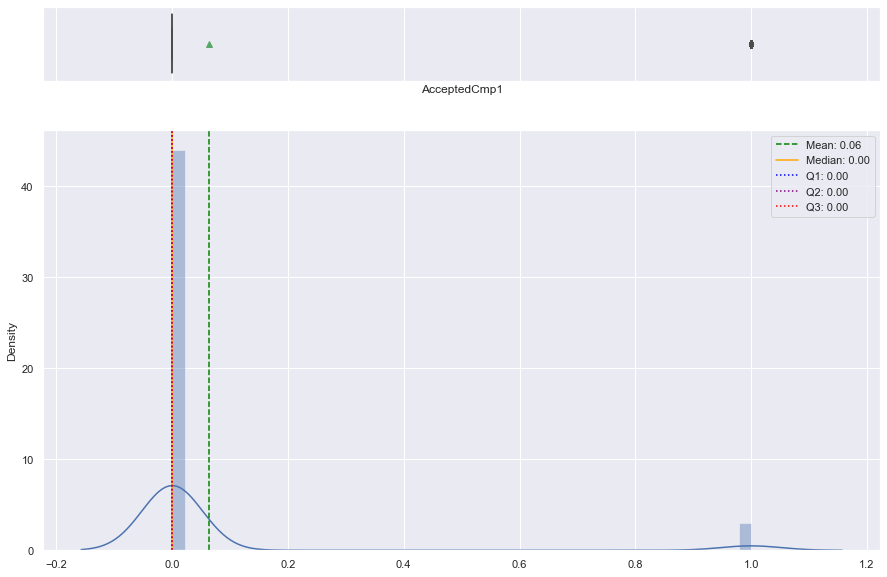

In [39]:
# Create a distibution and boxplot of AcceptedCmp1 column
hist_box('AcceptedCmp1')

**Observations:**
- The vast majority of people did not accept campaign 1

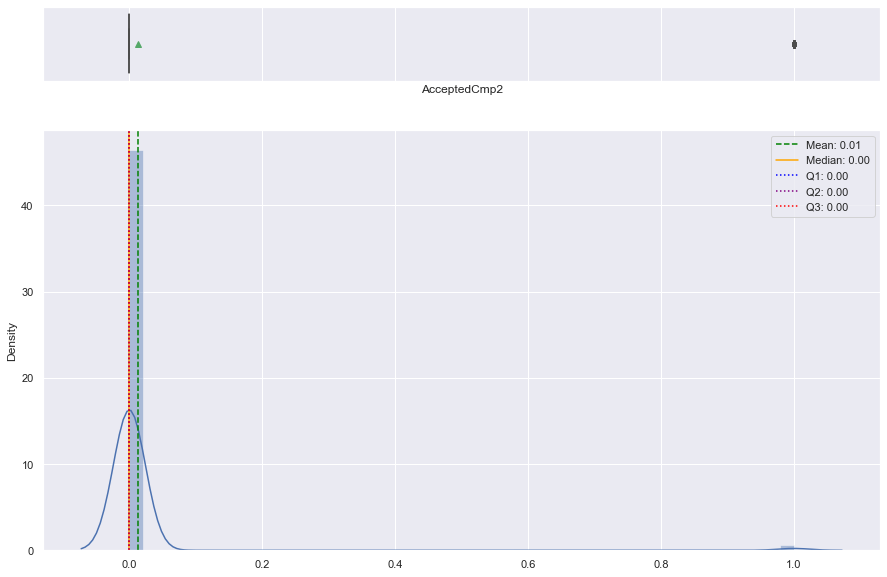

In [40]:
# Create a distibution and boxplot of AcceptedCmp2 column
hist_box('AcceptedCmp2')

**Observations:**
- The vast majority of people did not accept campaign 2

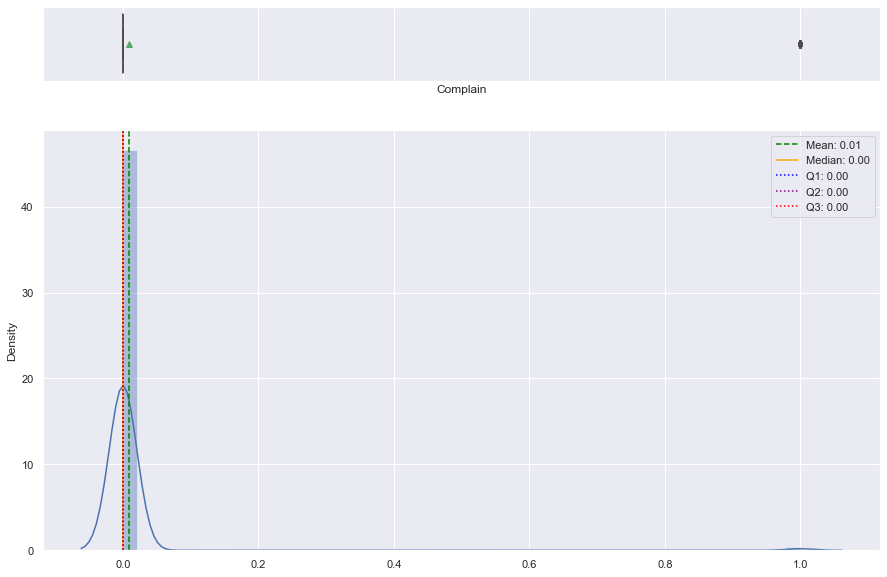

In [41]:
# Create a distibution and boxplot of Complain column
hist_box('Complain')

**Observations:**
- The vast majority of people do not complain

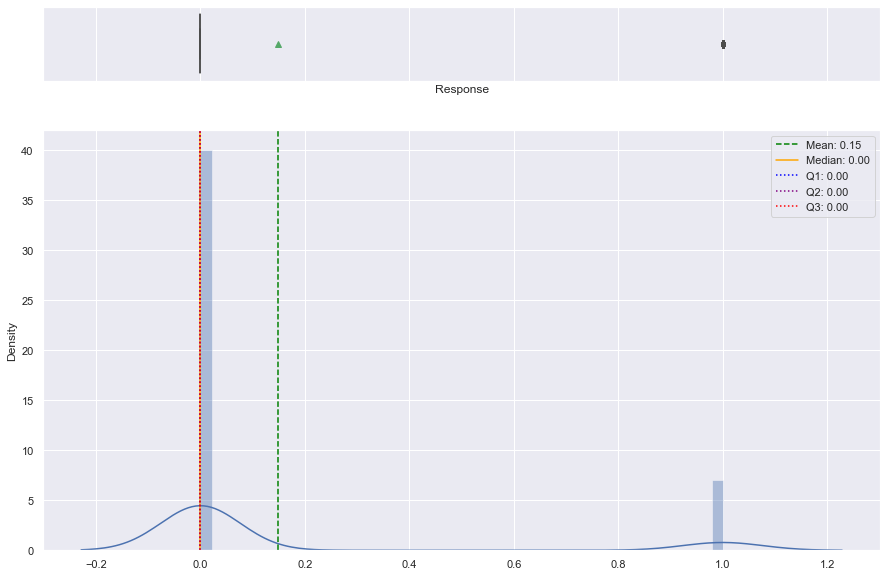

In [42]:
# Create a distibution and boxplot of Response column
hist_box('Response')

**Observations:**
- The vast majority of customers did not participate in the last campaign. 
- The last campaign was the most successful campaign with the most customers participating out of all other campaigns.

In [43]:
# Takes in a column name and plots it using the current df
def plot_categorical_column(col):
    # Count the occurrences of each unique value in the specified column
    value_counts = df[col].value_counts()

    # Create a bar chart
    plt.figure(figsize=(10, 6))
    plt.bar(value_counts.index, value_counts.values)
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)

    # Show the plot
    plt.tight_layout()
    plt.show()

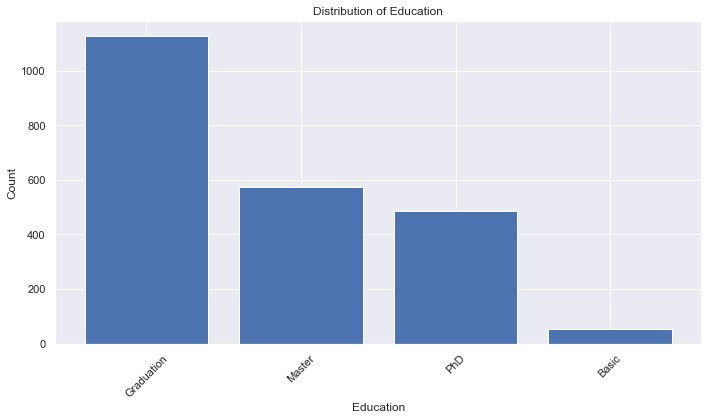

In [44]:
# Plot the Education column
plot_categorical_column('Education')

**Observations:**
- When 2n cycle and Master are combined the order of education will be Graduation, Master, PhD, Basic

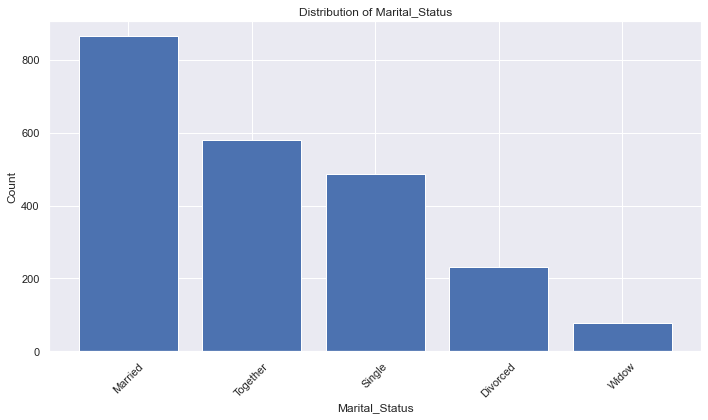

In [45]:
# Plot the Marital_Status column
plot_categorical_column('Marital_Status')

**Observations:**
- Most customers are Married, followed by Together, Single, Divorced, Widow

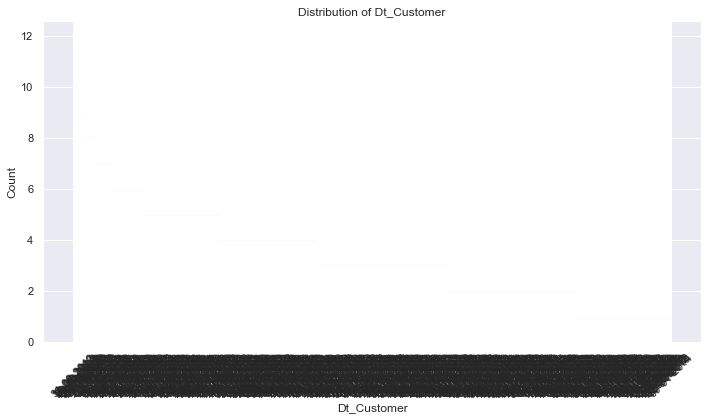

In [46]:
# Plot the Dt_Customer column
plot_categorical_column('Dt_Customer')

**Observations:**
- Dt_Customer column does not seem like it is useful on its own. might be good to look into feature engineering

**Univariable Analysis Key Observations:**
- Most values in Income are around the same values, however, 4 values are making it right skew, particularly 1 of the outleirs is very far from the others.
- There are very few outliers in the Income column and they are extreme. With the upper limit being ~$120,000 three of these outliers are ~$150,000. One of the outliers is ~$660,000 which definetly should be removed. Since, there are so few outliers in the Income column, all outliers will be removed.
- There are a few outliers in the Year_Birth that should be removed.
- All variables regarding the amount of product sold are right skewed, and have many outliers
- The vast majority of customer do not participate in campaigns

In [47]:
# Takes in a dataframe and a column name and returns the upper wisker value
def upper_whisker_position(df, col):
    
    # Calculate Q1 and Q3, ignoring NaN values since we have not delt with them
    q1 = np.nanpercentile(df[col], 25)
    q3 = np.nanpercentile(df[col], 75)
    # Calculate the IQR
    iqr = q3 - q1

    # Calculate the upper whisker position
    upper_whisker = q3 + 1.5 * iqr

    return upper_whisker

In [48]:
# Calculate the upper wisker of Income
upper_whisker_position(df, 'Income')

118350.5

In [49]:
# Take in a dataframe and a column name and returns a dataframe without outliers in that column
def remove_outliers_iqr(df, col):
    # Calculate Q1and Q3
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)

    # Calculate the IQR (Interquartile Range)
    iqr = q3 - q1

    # Calculate lower and upper bounds for the whiskers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Filter the data to remove outliers
    filtered_data = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

    return filtered_data

In [50]:
# Remove ourliers from Income column
df = remove_outliers_iqr(df, 'Income')

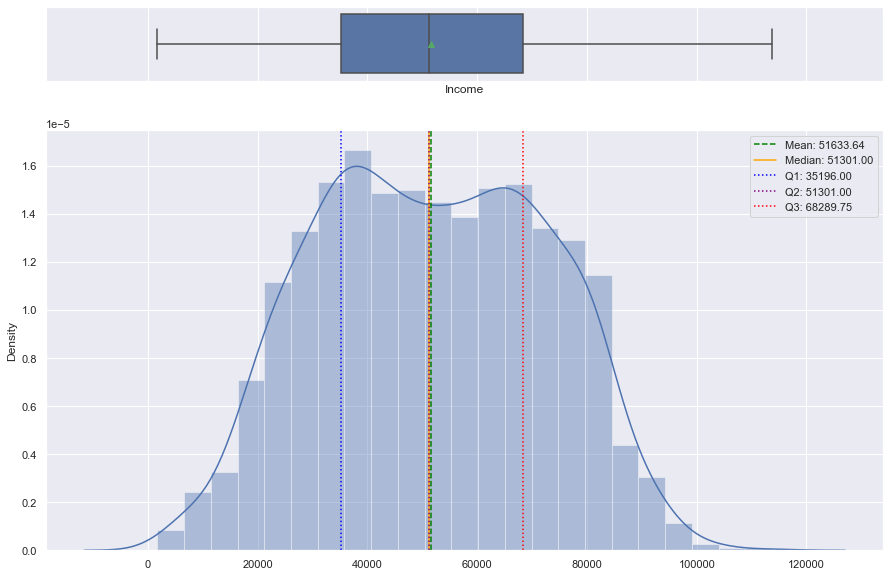

In [51]:
# Plot the new Income column
hist_box('Income')

**Observations:**
- After removing the outliers in the Income column, the income column is now very normally distributed

In [52]:
# Remove outliers from Year_Birth column
df = remove_outliers_iqr(df, 'Year_Birth')

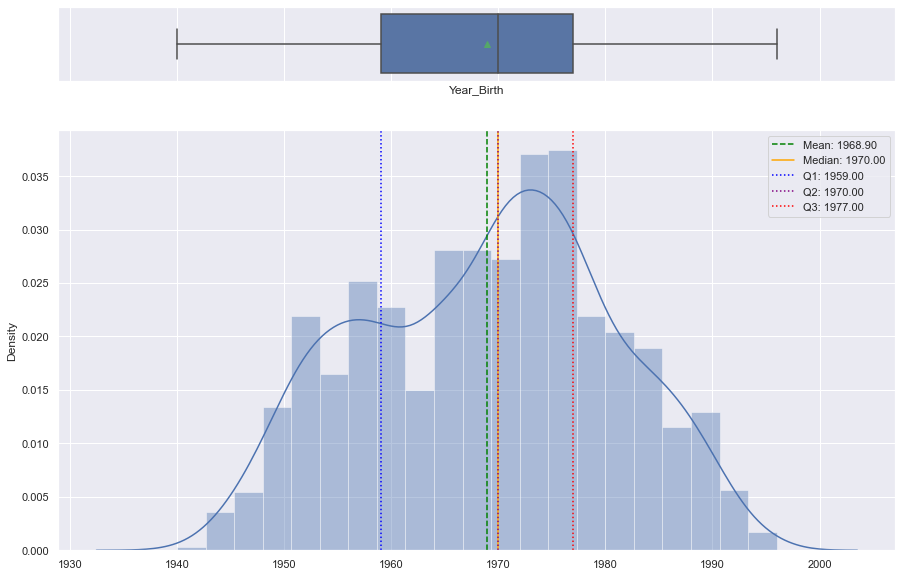

In [53]:
# Plot the new Year_Birth column
hist_box('Year_Birth')

**Observations:**
- The Year_Birth column is now much more normally distibuted than before.

In [54]:
# Get he new shape of the dataframe
df.shape

(2205, 26)

**Observations:**
- The orginal dataset had 2240 rows and now the dataset has 2205 after removing the most extreme outliers

### **Bivariate Analysis**

 - Analyze different categorical and numerical variables and check how different variables are related to each other.
 - Check the relationship of numerical variables with categorical variables.

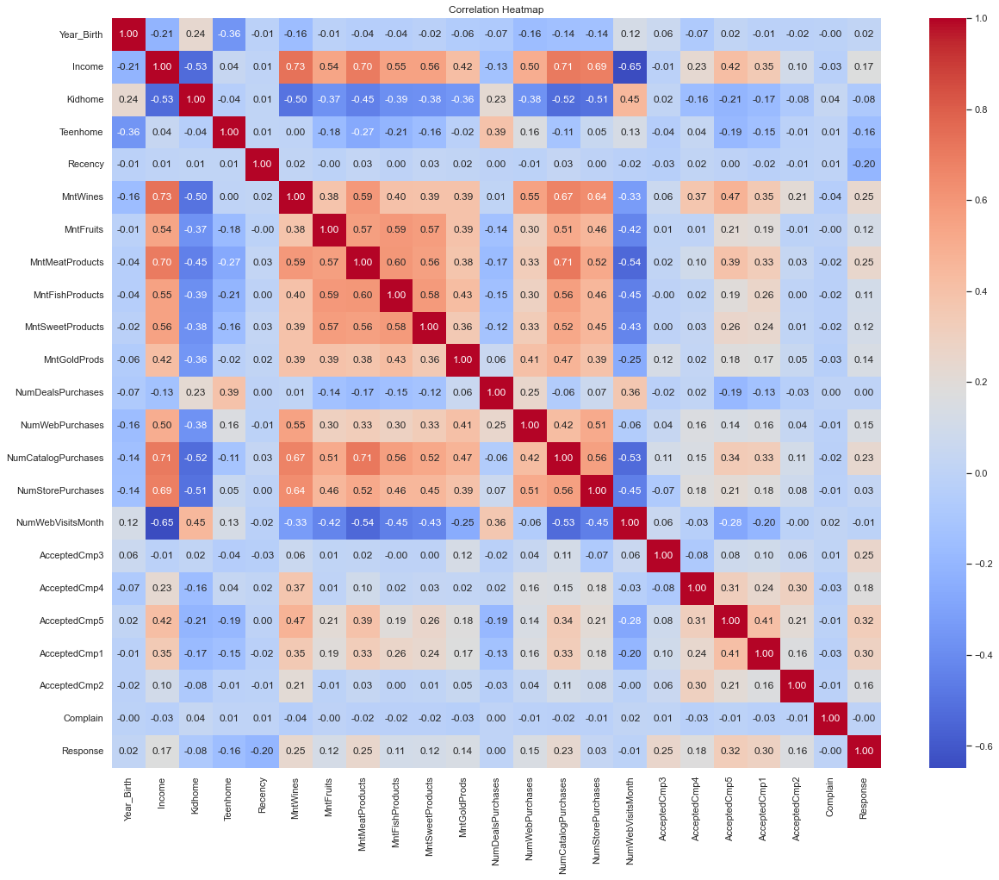

In [55]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 16))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Correlation Heatmap")
plt.show()

**Observations:**
- Having kids correlates to less spending on all products. Customers with teens has a less negative correlation with all products.
- Having higher income correlates to that customer buying more products, having a negative correlation with purchasing deals, and having a negative correlation with visiting the website
- Customers that visit the website has a negative correlation with purchasing our products, but these customers have a positive correlation with purchasing deals
- Customers who purchase our products have a postive correlation with purchasing other products
- People with higher income, purchase wines and meats, and purchase from the catalog have a higher correlation with accepting capaign offers
- Having a kid/teen in the home correlates with purchasing more deals
- There is a slight correlation with customer who accept one campaign with others

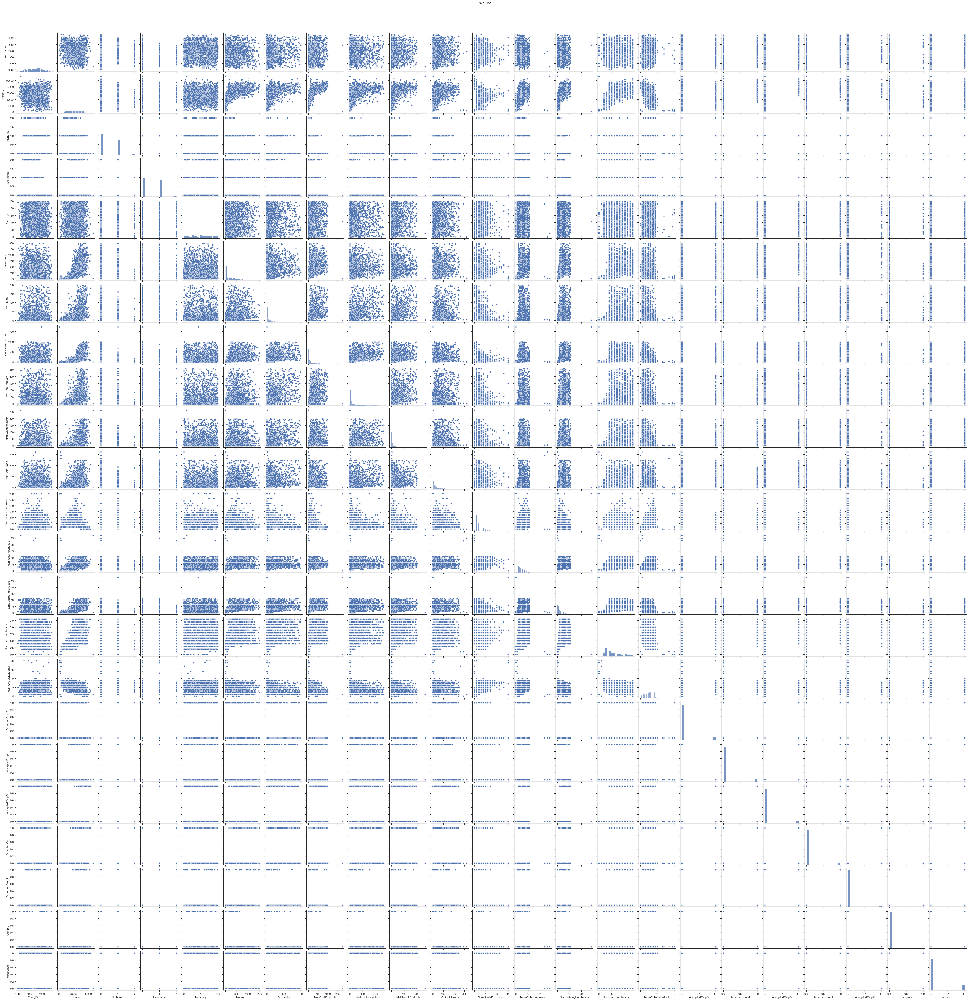

In [56]:
# Create a pair plot using seaborn
sns.set(style='ticks')
sns.pairplot(df[:])
plt.suptitle("Pair Plot", y=1.02)
plt.show()

**Observations:**
- I dont see much that we didnt already see in the above correlation matrix

In [57]:
# Plots a categorical column with a numerical column
def plot_categorical_numeric(df, cat_col, num_col):
    # Group the data by the categorical column and calculate the mean of the numeric column for each category
    grouped_data = df.groupby(cat_col)[num_col].mean().reset_index()

    # Create a bar plot
    plt.figure(figsize=(8, 6))
    plt.bar(grouped_data[cat_col], grouped_data[num_col])
    plt.xlabel(cat_col)
    plt.ylabel(f'Mean {num_col}')
    plt.title(f'Mean {num_col} by {cat_col}')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.tight_layout()

    # Show the plot
    plt.show()

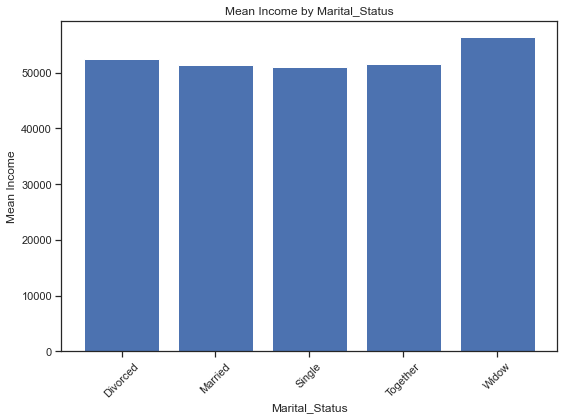

In [58]:
plot_categorical_numeric(df, 'Marital_Status', 'Income')

**Observations:**
- Marital_Status groups seem to share around the same income. Widow is the highest with Single being the lowest Income group.

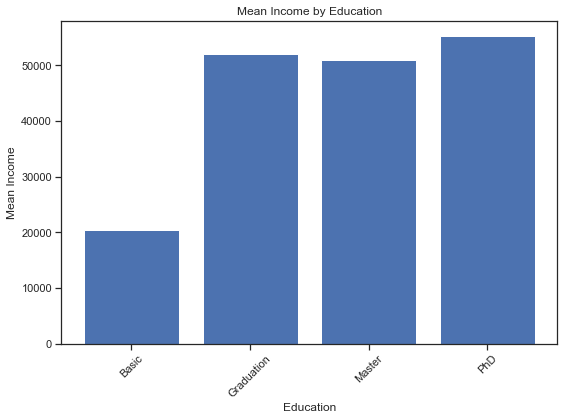

In [59]:
plot_categorical_numeric(df, 'Education', 'Income')

**Observations:**
- Their is a clear indication that the higher the education the higher Income that person has. PhD has the highest mean Income and Graduation and Master are about the same.

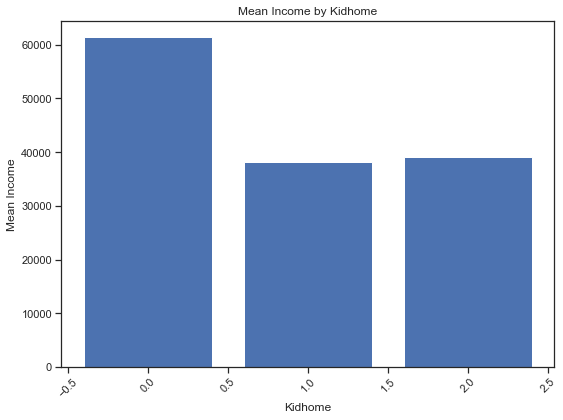

In [60]:
plot_categorical_numeric(df, 'Kidhome', 'Income')

**Observations:**
- People with no kids tend to have more mean income then people with 1 or 2 kids.

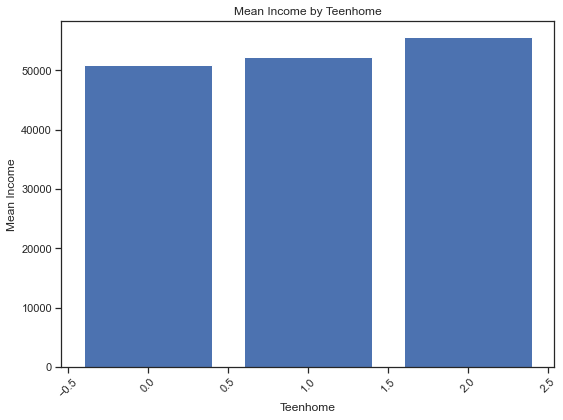

In [61]:
plot_categorical_numeric(df, 'Teenhome', 'Income')

**Observations:**
- The difference in Income between people with kids seems to not be the same with Teenhomes where people with 0, 1, and 2 teens in the home have around the same mean Income.

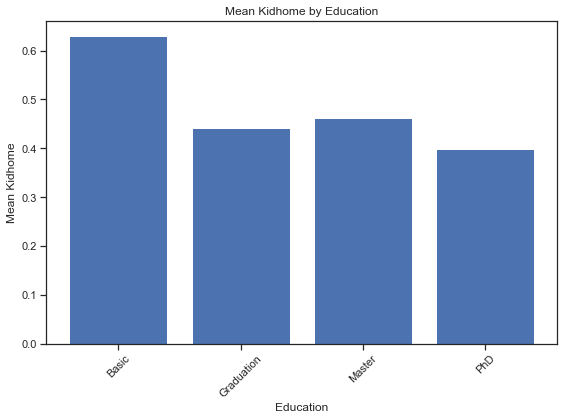

In [62]:
plot_categorical_numeric(df, 'Education', 'Kidhome')

**Observations:**
- People with a basic education have a much higher mean Kidhome then people with higher Education.

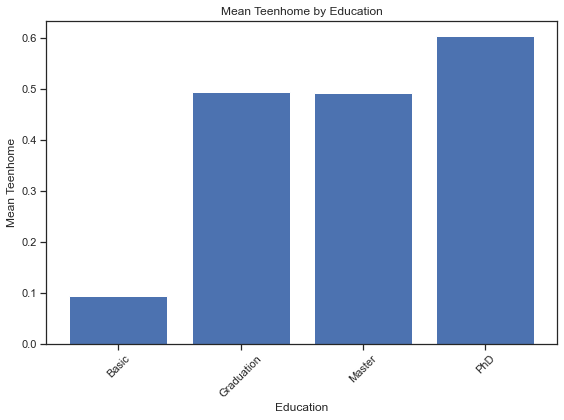

In [63]:
plot_categorical_numeric(df, 'Education', 'Teenhome')

**Observations:**
- Unlike Kidhome, Teenhome changes where people with higher educations tend to have teens in the home rather than children. 

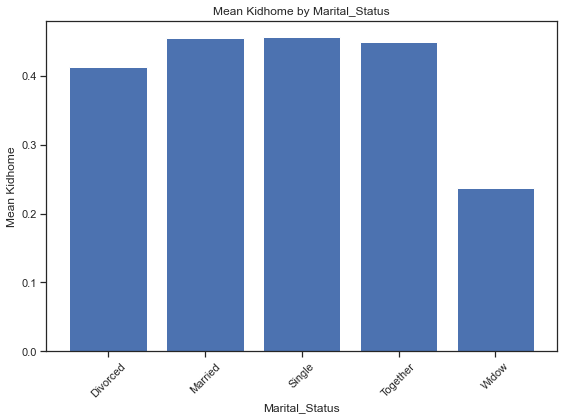

In [64]:
plot_categorical_numeric(df, 'Marital_Status', 'Kidhome')

**Observations:**
- Most groups have about the same mean kids at the home, with Widow being the lowest group by a lot.

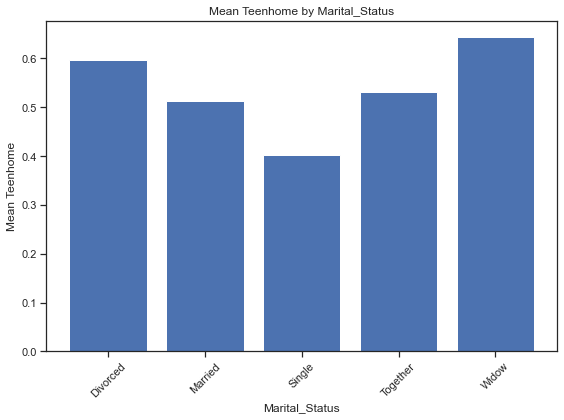

In [65]:
plot_categorical_numeric(df, 'Marital_Status', 'Teenhome')

**Observations:**
- Singles are the smallest group with teen in the home, with Divorced and Widow being the highest groups with teens in the home.

### **Feature Engineering and Data Processing**

In this section, we will first prepare our dataset for analysis.
- Imputing missing values

**Think About It:**

- Can we extract the age of each customer and create a new feature?
- Can we find the total kids and teens in the home?
- Can we find out how many members each family has?
- Can we find the total amount spent by the customers on various products?
- Can we find out how long the customer has been with the company?
- Can we find out how many offers the customers have accepted?
- Can we find out amount spent per purchase?



In [66]:
# Impute NaN values in Income with the mean (since the data is now normally distibuted we can use the mean)
df['Income'].fillna(df['Income'].mean(), inplace=True)

In [67]:
# Calculate the age of customers and create a new 'Customer_Age' column
df['Customer_Age'] = 2016 - df['Year_Birth']

In [68]:
# calculate total children in households = Kidhome + Teenhome
df['Total_Children'] = df['Kidhome'] + df['Teenhome']

In [69]:
def calculate_household_size(row):
    if row['Marital_Status'] in ['Married', 'Together']:
        return 2 + row['Total_Children']
    else:
        return 1 + row['Total_Children']

In [70]:
# calculate total members in the family
df['Household_Size'] = df.apply(calculate_household_size, axis=1)

In [71]:
# Create the 'Amount_Purchased' column which is the total amount spent on purchases over 2 years
df['Amount_Purchased'] = df['MntWines'] + df['MntFruits'] + df['MntMeatProducts'] + df['MntFishProducts'] + df['MntSweetProducts'] + df['MntGoldProds']

In [72]:
# Total Purchases which is the total amount of purchases made across business
df['Total_Purchases'] = df['NumDealsPurchases'] + df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases']

In [73]:
# Convert the 'Dt_Customer' column to datetime format if it's not already
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

In [74]:
df['Dt_Customer'].max()

Timestamp('2014-12-06 00:00:00')

**Observation:**
- Since the last customer joined on 12-06-2014 ill use the beginning of the new year 01-01-2015 as the datetime.

In [75]:
# Convert the string to a datetime object
date_object = datetime.strptime('2015-01-01', '%Y-%m-%d')
# Calulate how long the customer has been with the company 
df['Days_With_Company'] = (date_object - df['Dt_Customer']).dt.days

In [76]:
# Calculate how many campaigns the customer has accepted
df['Total_Accepted_Offers'] = df['AcceptedCmp1'] + df['AcceptedCmp2'] + df['AcceptedCmp3'] + df['AcceptedCmp4'] + df['AcceptedCmp5'] + df['Response']

In [77]:
# Calculate the average amount per purchase, replacing division by zero with 0
df['Avg_Amount_Per_Purchase'] = np.where(df['Total_Purchases'] != 0,
                                         df['Amount_Purchased'] / df['Total_Purchases'],
                                         0)

In [78]:
# Make sure that we handled dividing by zero correclty and dont have inf or undefined values
df['Avg_Amount_Per_Purchase'].describe().T

count    2205.000000
mean       32.590924
std        28.556446
min         0.000000
25%         9.714286
50%        23.375000
75%        45.346154
max       186.500000
Name: Avg_Amount_Per_Purchase, dtype: float64

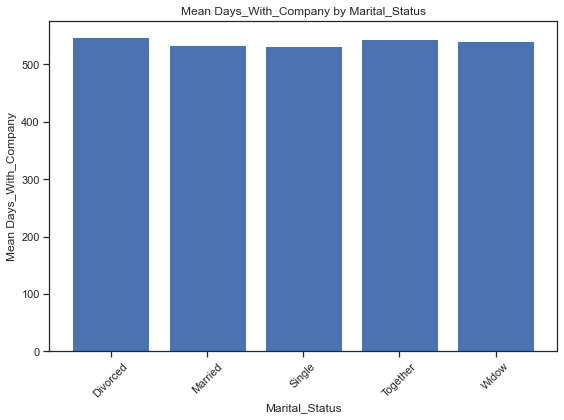

In [79]:
plot_categorical_numeric(df, 'Marital_Status', 'Days_With_Company')

**Observations:**
- All marital status have been with the company for about the same time.

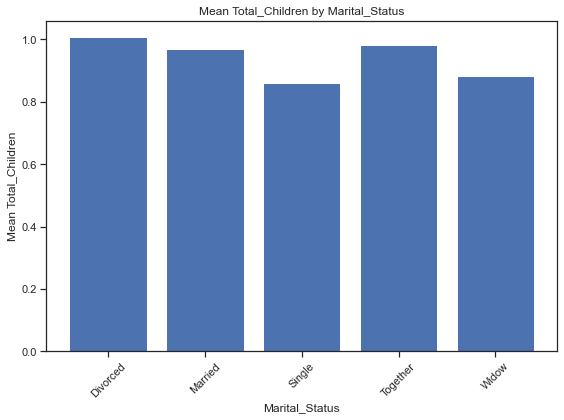

In [80]:
plot_categorical_numeric(df, 'Marital_Status', 'Total_Children')

**Observations:**
- Divored, Together, and Married have the most total children with single and widow being the least.

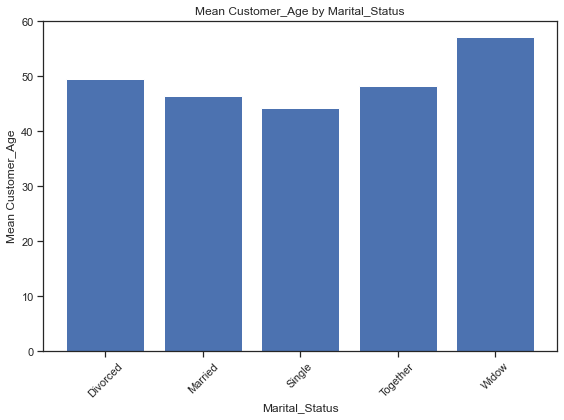

In [81]:
plot_categorical_numeric(df, 'Marital_Status', 'Customer_Age')

**Observations:**
- Widows tend to be the oldest customers, other groups are about the same age, with single being the youngest.

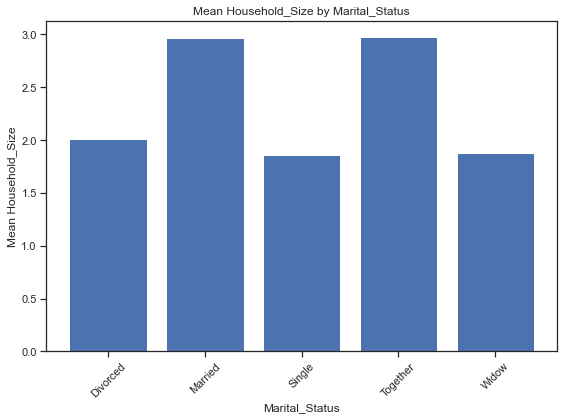

In [82]:
plot_categorical_numeric(df, 'Marital_Status', 'Household_Size')

**Observations:**
- The martical status with the largest family size are people who are Marries and Together. Divorce, single, and widow have about the same family sizes.

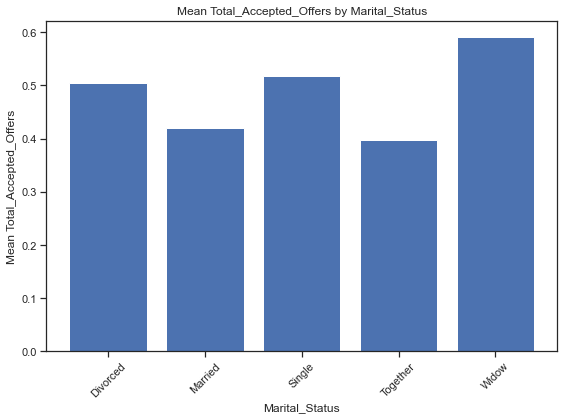

In [83]:
plot_categorical_numeric(df, 'Marital_Status', 'Total_Accepted_Offers')

**Observations:**
- Widows tend to accept the campaign offers the most. The other groups accept about the same.

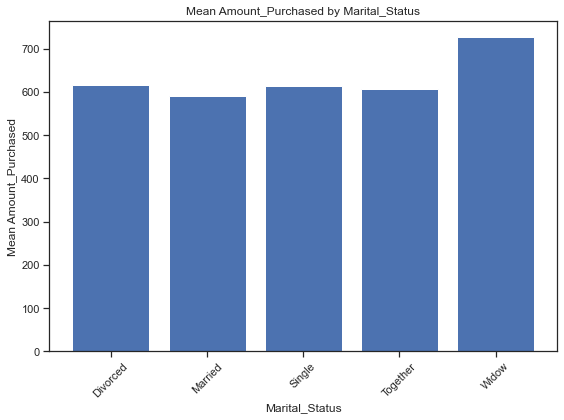

In [84]:
plot_categorical_numeric(df, 'Marital_Status', 'Amount_Purchased')

**Observations:**
- Windows make the most most costly purchases then other marital status groups, the other groups are about the same.

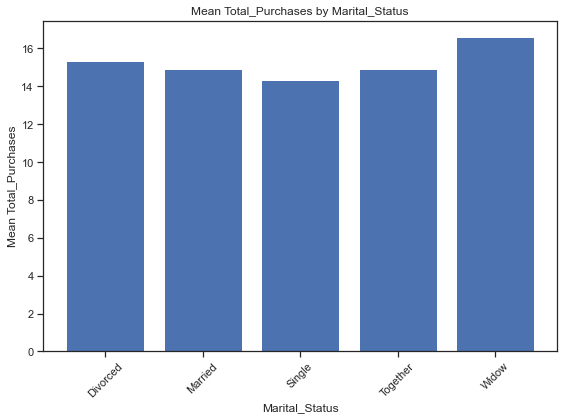

In [85]:
plot_categorical_numeric(df, 'Marital_Status', 'Total_Purchases')

**Observations:**
- Widows make the most total purchases but most marital statuses are about the same

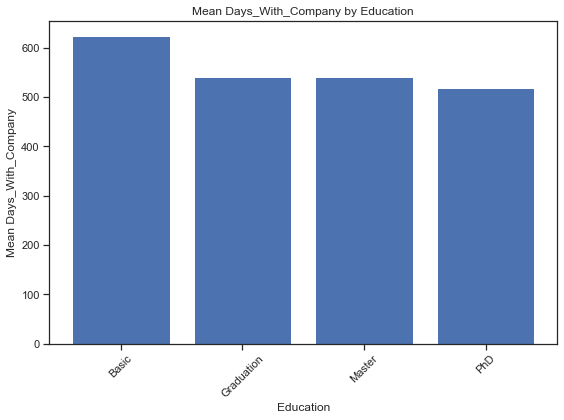

In [86]:
plot_categorical_numeric(df, 'Education', 'Days_With_Company')

**Observations:**
- Basic education people tend to be with the company the longest, however this isnt very conmclusive 

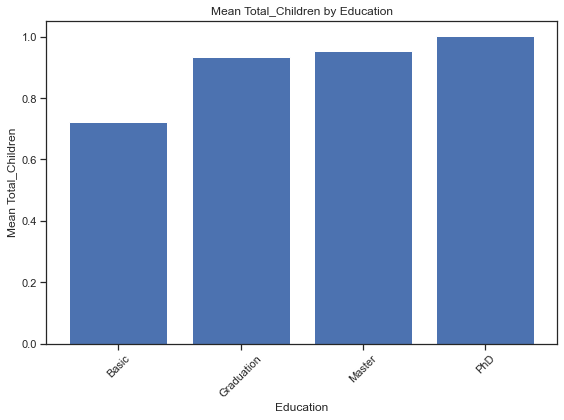

In [87]:
plot_categorical_numeric(df, 'Education', 'Total_Children')

**Observations:**
- People with Basic education tend to have less children then those with higher education.

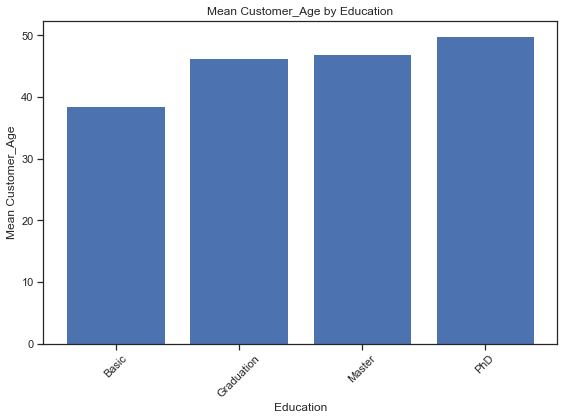

In [88]:
plot_categorical_numeric(df, 'Education', 'Customer_Age')

**Observations:**
- People with Basic education tend to be on the younger side then with people with higher education.

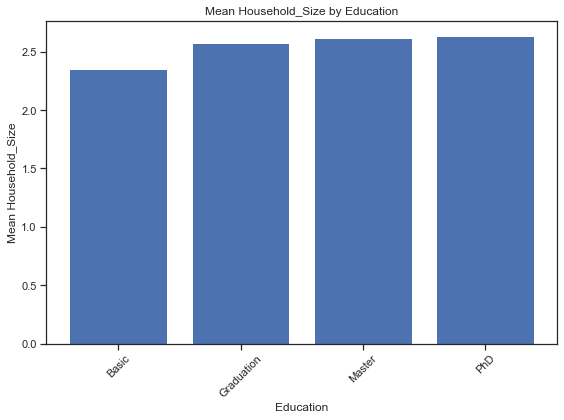

In [89]:
plot_categorical_numeric(df, 'Education', 'Household_Size')

**Observations:**
- Education doesnt seem to factor much into the hoursehold size.

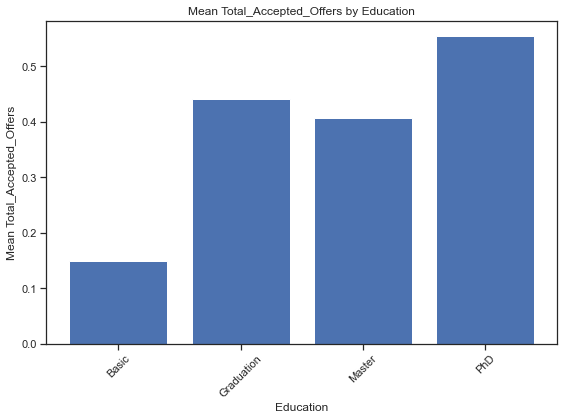

In [90]:
plot_categorical_numeric(df, 'Education', 'Total_Accepted_Offers')

**Observations:**
- People with higher educations accept campaign offers much more than Basic education.

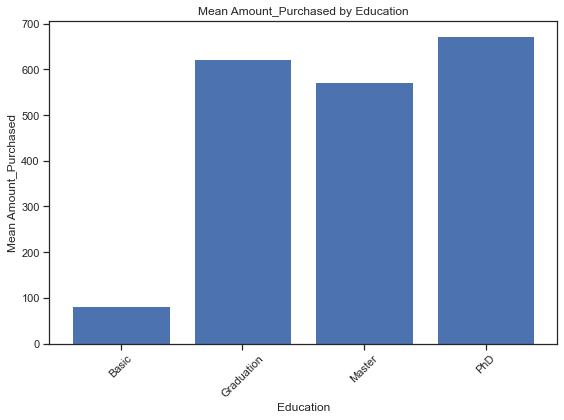

In [91]:
plot_categorical_numeric(df, 'Education', 'Amount_Purchased')

**Observations:**
- The amount of the purchases is much higher with people with higher educations then Basic

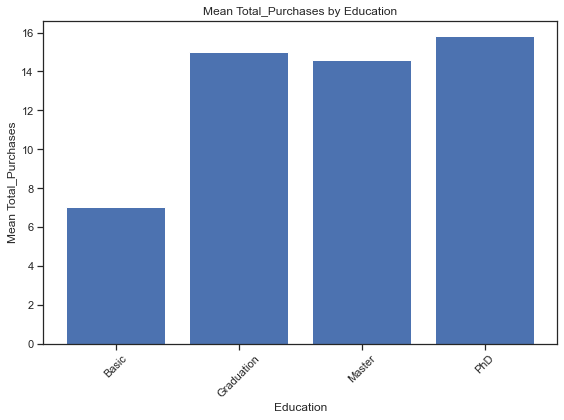

In [92]:
plot_categorical_numeric(df, 'Education', 'Total_Purchases')

**Observations:**
- People with higher educations have much higher total purchases then Basic Education

## **Important Insights from EDA and Data Preprocessing**

What are the the most important observations and insights from the data based on the EDA and Data Preprocessing performed?

**Important Observations and Insights from EDA and Data Preprocessing**
- Exploratory Data Analysis:
    - The final dataset has 2204 observations out of the orginal 2240 observations
    - The vast majority of people have a graduation degree or higher and only 54 people have a basic Education.
    - The majority of marital status is married (864), with second being together (580), followed by single (487), divored (232), Widow (77). Most people in our data are together or married.
    - Once the major outliers in Year_birth were removed the data is normally distributed
    - The majority of people do not have kids, close second is having 1 kid, then 2 with the vast minority of the data
    - The majority of people do not have teens in the home, having 1 teen is a close second, with 2 being the least in the data.
    - The amound of product for fish, meat, fruit, sweet, wines, gold are all heavily right skewed.
    - The number of purchases is skewed right on all variables such as deals, web, catelog, store purchases
    - The majority of people have not accepted campaign offers
    - Very few people have complained in the past 2 years
    - More people have participated in the last campaign offer than any campain offer prior
    - There are decently strong correlation between people who buy a given product with buying our other products. 
    - People who have kids in the home tend to purchase less products. They do make more web visits and they purchase deals
    - There is a strong positive correlation between Income and purchasing products, income has a negative correlation with web visits.
    - Income in marital statuses is about the same in all groups
    - People with higher education have higher Income
    - People with a basic education have more kids in the home and people with higher education have more teens in the home.
    - Marital status doesnt affect days with the company, and total children is about the same
    - Most marital status groups are about the same age, other than widow which is higher avg age.
    - Married and Together families have the highest household size
    - Widows accept campaign offers more than others. Therefore older customer accept more campaign offers.
    - People with higher education accept more campaign offers than people with basic education. Higher educated people have higher Income, make more purchases, and have more amount spent on theose purchases.
- Feature Engineering:
    - Several features where created to try and better understand the data. These features are customer age, total children, household size, amount purchased, total purchases, days with company, total accepted campaign offers, average amount spent on each purchase.
- Data Preprocessing:
    - The ID Column was removed since it wont help with analysis since its just a index value.
    - Missing values in the Income column were inputed with the mean, since the data was fairly normally distributed
    - There where very few observations with much higher Income, and those observations were removed from the data.
    - Year_Birth had some people born before 1900 which where removed since they would be over 100 years of age, and were major outliers.

## **Data Preparation for Segmentation**

- The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. So we need to think carefully about the variables we will choose for clustering. Clearly, this is a step where a lot of contextual knowledge, creativity, and experimentation/iterations are needed.
- Moreover, we often use only a few of the data attributes for segmentation (the segmentation attributes) and use some of the remaining ones (the profiling attributes) only to profile the clusters. For example, in market research and market segmentation, we can use behavioral data for segmentation (to segment the customers based on their behavior like amount spent, units bought, etc.), and then use both demographic as well as behavioral data for profiling the segments found.
- Plot the correlation plot after we've removed the irrelevant variables
- Scale the Data

- Segmentation Attributes:
    - Dt_Customer (Drop for modeling)
    - Recency 
    - MntWines
    - MntFruits
    - MntMeatProducts
    - MntFishProducts
    - MntSweetProducts
    - MntGoldProducts
    - NumDealsPurchases
    - NumWebPurchases
    - NumCatelogPurchases
    - NumStorePurchases
    - NumWebVisitsMonth
    - AcceptedCmp3 (Drop for modeling)
    - AcceptedCmp4 (Drop for modeling)
    - AcceptedCmp5 (Drop for modeling)
    - AcceptedCmp1 (Drop for modeling)
    - AcceptedCmp2 (Drop for modeling)
    - Complain (Drop for modeling)
    - Response (Drop for modeling)
    - Amount_Purchased (added feature)
    - Total_Purchases (added feature)
    - Days_With_Company (added feature)
    - Total_Accepted_Offers (added feature)
    - Avg_Amount_Per_Purchase (added feature)

- Profile Attributes:
    - Year_Birth (Drop for modeling)
    - Customer_Age (added feature) (Drop for modeling)
    - Education (Drop for modeling)
    - Marital_Status (Drop for modeling)
    - Income (Drop for modeling)
    - Kidhome (Drop for modeling)
    - Teenhome (Drop for modeling)
    - Total_Children (added feature) (Drop for modeling)
    - Household_Size (added feature) (Drop for modeling)


In [93]:
# column to drop Kidhome, Teenhome, Year_Birth, AcceptedCmp1, AcceptedCmp2, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, Response, Dt_Customer, Education, Marital_Status, Income, Total_Children, Household_Size
columns_to_keep = [
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
model_data = df[columns_to_keep].copy()

In [94]:
# View the shape of the modeling data
model_data.shape

(2205, 17)

In [95]:
# View general info about the model data
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2205 entries, 0 to 2239
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Recency                  2205 non-null   int64  
 1   MntWines                 2205 non-null   int64  
 2   MntFruits                2205 non-null   int64  
 3   MntMeatProducts          2205 non-null   int64  
 4   MntFishProducts          2205 non-null   int64  
 5   MntSweetProducts         2205 non-null   int64  
 6   MntGoldProds             2205 non-null   int64  
 7   NumDealsPurchases        2205 non-null   int64  
 8   NumWebPurchases          2205 non-null   int64  
 9   NumCatalogPurchases      2205 non-null   int64  
 10  NumStorePurchases        2205 non-null   int64  
 11  NumWebVisitsMonth        2205 non-null   int64  
 12  Amount_Purchased         2205 non-null   int64  
 13  Total_Purchases          2205 non-null   int64  
 14  Days_With_Company       

**Observation:**
- All the data we are modeling on is a numerical value
- We are only modeling on segmentation attributes

In [96]:
# View the first 5 rows in the model data
model_data.head()

,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Amount_Purchased,Total_Purchases,Days_With_Company,Total_Accepted_Offers,Avg_Amount_Per_Purchase
0,58,635,88,546,172,88,88,3,8,10,4,7,1617,25,997,1,64.680000
1,38,11,1,6,2,1,6,2,1,1,2,5,27,6,151,0,4.500000
2,26,426,49,127,111,21,42,1,8,2,10,4,776,21,498,0,36.952381
3,26,11,4,20,10,3,5,2,2,0,4,6,53,8,91,0,6.625000
4,94,173,43,118,46,27,15,5,5,3,6,5,422,19,347,0,22.210526


In [97]:
model_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Recency,2205.0,49.009070,28.932111,0.0,24.000000,49.000,74.000000,99.0
MntWines,2205.0,306.164626,337.493839,0.0,24.000000,178.000,507.000000,1493.0
MntFruits,2205.0,26.403175,39.784484,0.0,2.000000,8.000,33.000000,199.0
MntMeatProducts,2205.0,165.312018,217.784507,0.0,16.000000,68.000,232.000000,1725.0
MntFishProducts,2205.0,37.756463,54.824635,0.0,3.000000,12.000,50.000000,259.0
MntSweetProducts,2205.0,27.128345,41.130468,0.0,1.000000,8.000,34.000000,262.0
MntGoldProds,2205.0,44.057143,51.736211,0.0,9.000000,25.000,56.000000,321.0
NumDealsPurchases,2205.0,2.318367,1.886107,0.0,1.000000,2.000,3.000000,15.0
NumWebPurchases,2205.0,4.100680,2.737424,0.0,2.000000,4.000,6.000000,27.0
NumCatalogPurchases,2205.0,2.645351,2.798647,0.0,0.000000,2.000,4.000000,28.0


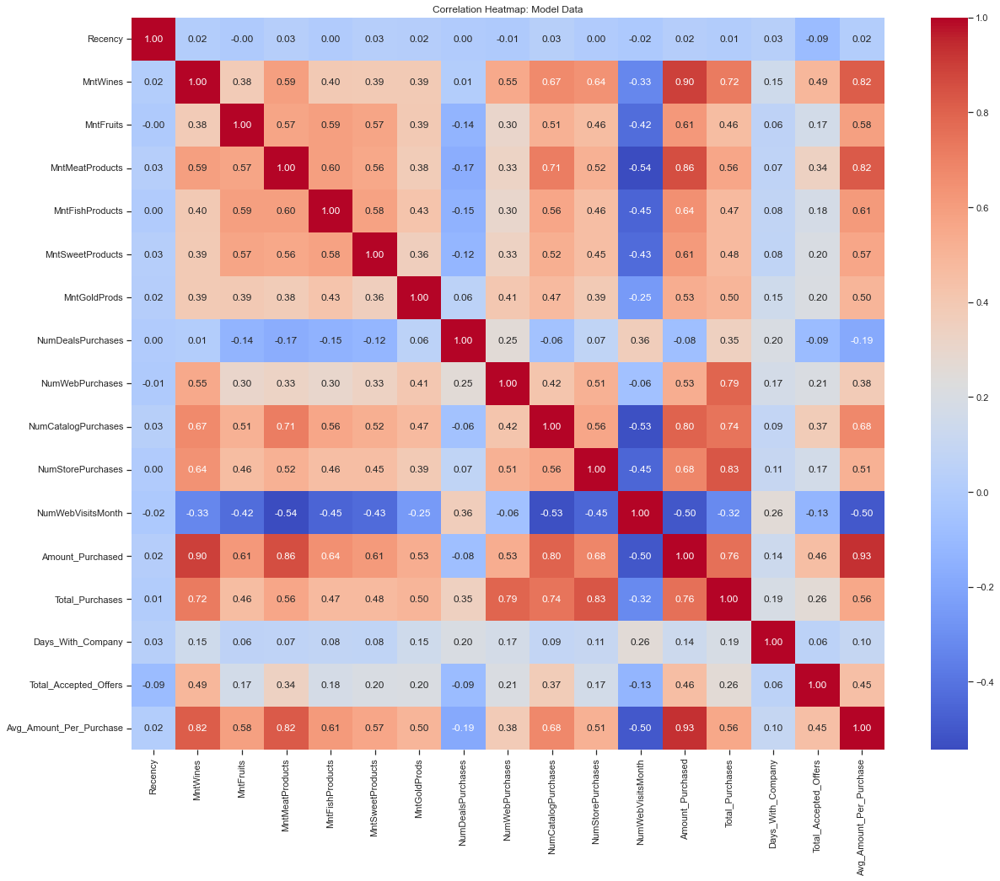

In [98]:
# Calculate the correlation matrix
correlation_matrix = model_data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 16))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Correlation Heatmap: Model Data")
plt.show()

**Observation:**
- We can see similar correlations as the previous correlation matrix but only with segmentation features.
- Customers that visit the website has a negative correlation with purchasing our products, but these customers have a positive correlation with purchasing deals
- Customers who purchase one of our products has a positive correlation with purchasing other products. 
- Customers who purchase in stores, in catalog, on the website have a positive correlation with purchasing our products. 
- The customers who participate in campaigns are customers who purchase wines and meats as well as customers with higher catalog purchases, total purchases, and higher average purchase cost.
- Days with the company doesnt really tell us much.
- Poeple who purchase from one channel tend to have a higher correaltion with purchasing from other channels.
- Customers who spend a lot on products tend to not purchase deals.

In [99]:
scaler = StandardScaler()
model_data_scaled = scaler.fit_transform(model_data)
model_data_scaled = pd.DataFrame(model_data_scaled, columns = model_data.columns)

## **Applying T-SNE and PCA to the data to visualize the data distributed in 2 dimensions**

### **Applying T-SNE**

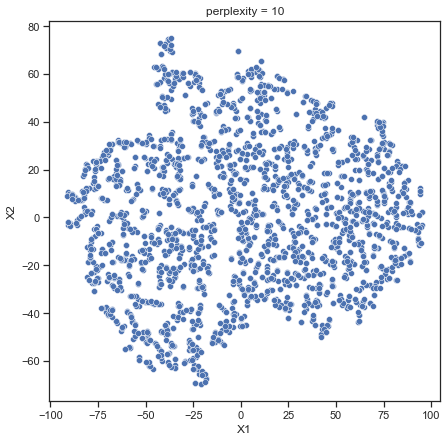

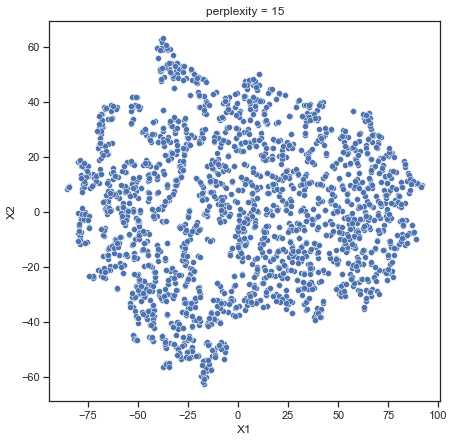

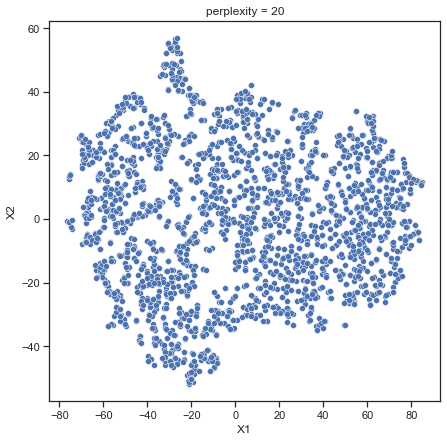

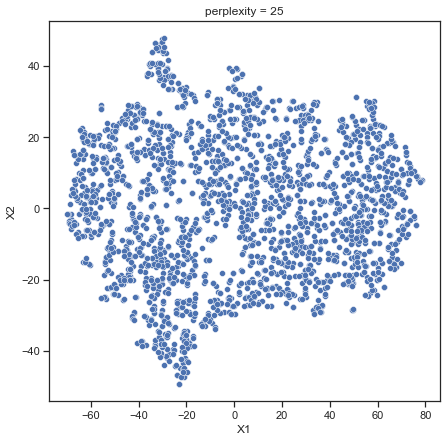

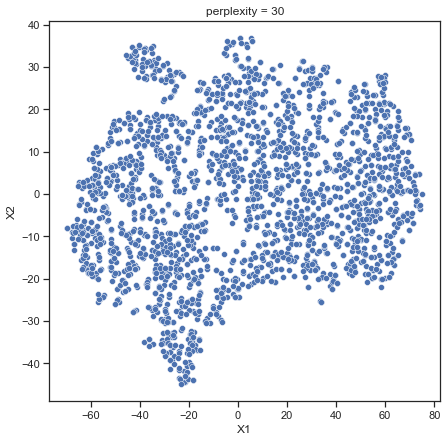

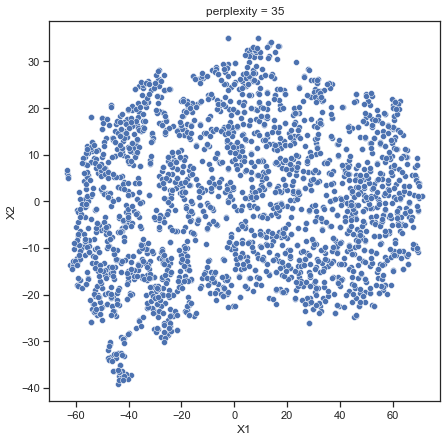

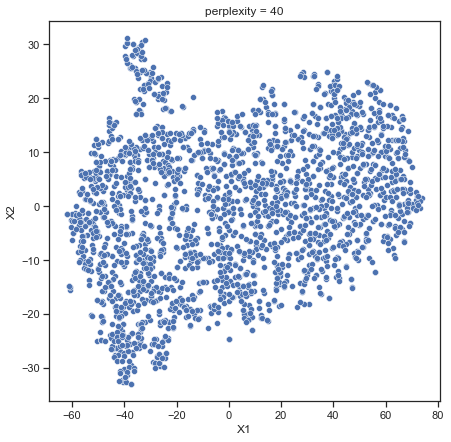

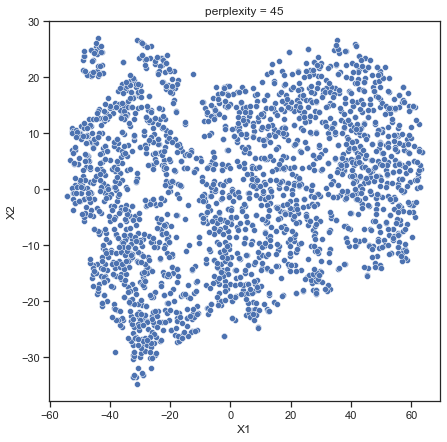

In [100]:
# Loop through perplexity so we can see which perplexity value is best for grouping the data
for i in range(10, 50, 5):
    tsne = TSNE(n_components = 2, random_state = 1, perplexity = i)
    
    data_tsne = tsne.fit_transform(model_data_scaled)
    
    data_tsne = pd.DataFrame(data_tsne)
    
    data_tsne.columns = ['X1', 'X2']
    
    plt.figure(figsize = (7,7))
    
    sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne)
    
    plt.title("perplexity = {}".format(i))

**Observation and Insights:** t-SNE seems to be forming a large blob of data without any real clustering going on. 

### **Applying PCA**

**Think about it:**
- Should we apply clustering algorithms on the current data or should we apply PCA on the data before applying clustering algorithms? How would this help?

In [101]:
# Defining the number of principal components to generate
n = model_data_scaled.shape[1]

# Finding principal components for the data
pca = PCA(n_components = n, random_state = 1)
df_pca = pd.DataFrame(pca.fit_transform(model_data_scaled))

# The percentage of variance explained by each principal component
exp_var = pca.explained_variance_ratio_

In [102]:
# Print the explained variance by the first 2 components
print(exp_var[0]+exp_var[1])

0.5708069833712592


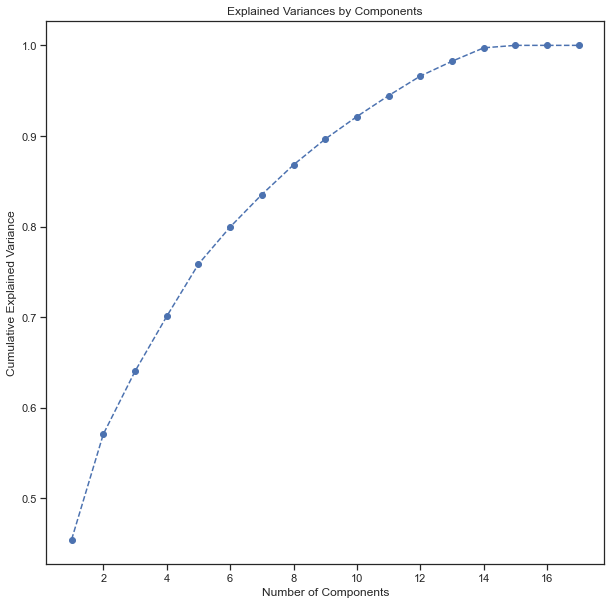

In [103]:
# Visualize the explained variance by individual components
plt.figure(figsize = (10, 10))

plt.plot(range(1, 18), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')

plt.title("Explained Variances by Components")

plt.xlabel("Number of Components")

plt.ylabel("Cumulative Explained Variance")

plt.show()

In [104]:
# Making a new dataframe with first 5 principal components as columns and original features as indices
pc_comps = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']

data_pca = pd.DataFrame(np.round(pca.components_[:5,:],2), index = pc_comps, columns = model_data_scaled.columns)
data_pca.T

,PC1,PC2,PC3,PC4,PC5
Recency,0.01,0.00,-0.33,0.55,-0.74
MntWines,0.30,0.13,0.30,-0.02,-0.22
MntFruits,0.25,-0.15,-0.24,0.08,0.27
MntMeatProducts,0.30,-0.16,0.05,0.09,-0.01
MntFishProducts,0.26,-0.15,-0.23,0.11,0.26
MntSweetProducts,0.25,-0.13,-0.23,0.10,0.21
MntGoldProds,0.21,0.11,-0.11,0.09,0.15
NumDealsPurchases,-0.02,0.56,-0.15,-0.14,-0.01
NumWebPurchases,0.21,0.39,-0.05,-0.17,-0.06
NumCatalogPurchases,0.30,-0.02,0.03,-0.03,-0.09


**Observations:**
- We can see that the first component is about Amount_Purchased (0.35), Avg_Amount_Per_Purchase (0.32). These are the most important features in the first component with features like Total_Purchases, NumCatalogPurchases, MntMeatProducts, MntWines being very important as well. 

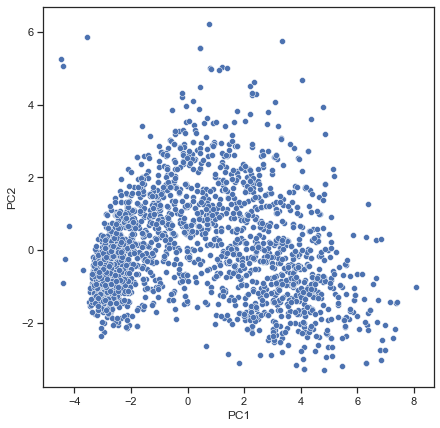

In [105]:
plt.figure(figsize = (7,7))

sns.scatterplot(x = df_pca[0], y = df_pca[1])

plt.xlabel("PC1")

plt.ylabel("PC2")

plt.show()

**Observation and Insights:**PCA does a better job at seperating the data into clustered areas compared to t-SNE. 

## **K-Means** 

**Think About It:**

- How do we determine the optimal K value from the elbow curve?
    - We want to find where the sum of squered errors starts to not decrease at a large rate
- Which metric can be used to determine the final K value?
    - We can use silhouette score as an additional measure to determine the optimal K value.

In [106]:
df_pca_kmeans = df_pca.copy()

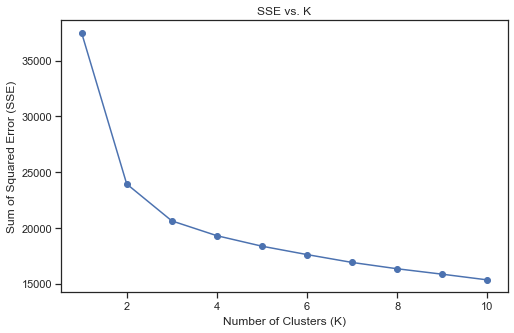

In [107]:
# Initialize a dictionary to store SSE for each K
sse = {}

# Run for a range of Ks and store SSE for each run
for k in range(1, 11):  
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_pca_kmeans)  
    sse[k] = kmeans.inertia_

# Plot the SSE vs K and plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.title('SSE vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Error (SSE)')
plt.show()

In [108]:
silhouette_scores = []
# Define the range of cluster numbers to iterate through
cluster_range = range(3, 8)  # Start from 2 clusters and go up to 11 clusters

for n_clusters in cluster_range:
    # Create and fit the K-Means model
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(df_pca_kmeans)
    
    # Calculate the Silhouette Score for this iteration
    silhouette_avg = silhouette_score(df_pca_kmeans, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg}")

Silhouette Score for 3 clusters: 0.27631070813321607
Silhouette Score for 4 clusters: 0.25277750779271124
Silhouette Score for 5 clusters: 0.23484824262784307
Silhouette Score for 6 clusters: 0.12250551069989875
Silhouette Score for 7 clusters: 0.1287387784838586


**Observations:**
- From the elbow plot, we can see that the elbow seems to start at 3 clusters and we can analyze a few clusters from that so around 3-6. It seems that the elbow slopes down and doesnt move horizontally. 
- Using the silhouette score we can see a massive decrease at 6 clusters, so 3 to 5 clusters seems to be a good range
- Conclusions: From the elbow plot we can see that 3 clusters is the start of the elbow and using silhouette scores we can see that 3 to 5 clusters should be where we start our analysis.

### **Applying KMeans on the PCA data and visualize the clusters**

In [109]:
# Perform K-Means clustering with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(df_pca_kmeans)

KMeans(n_clusters=3, random_state=42)

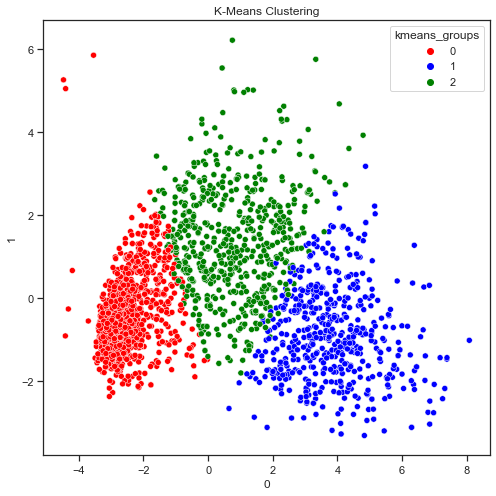

In [110]:
# Add cluster labels to your DataFrames
df_pca_kmeans['kmeans_groups'] = kmeans.labels_
model_data['kmeans_groups'] = kmeans.labels_
df['kmeans_groups'] = kmeans.labels_
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green'}

# Create a scatter plot 
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_kmeans[0], y=df_pca_kmeans[1], data=df_pca_kmeans, hue=df_pca_kmeans['kmeans_groups'], palette=color_mapping)
plt.title("K-Means Clustering")
plt.show()

#### **Cluster Profiling**

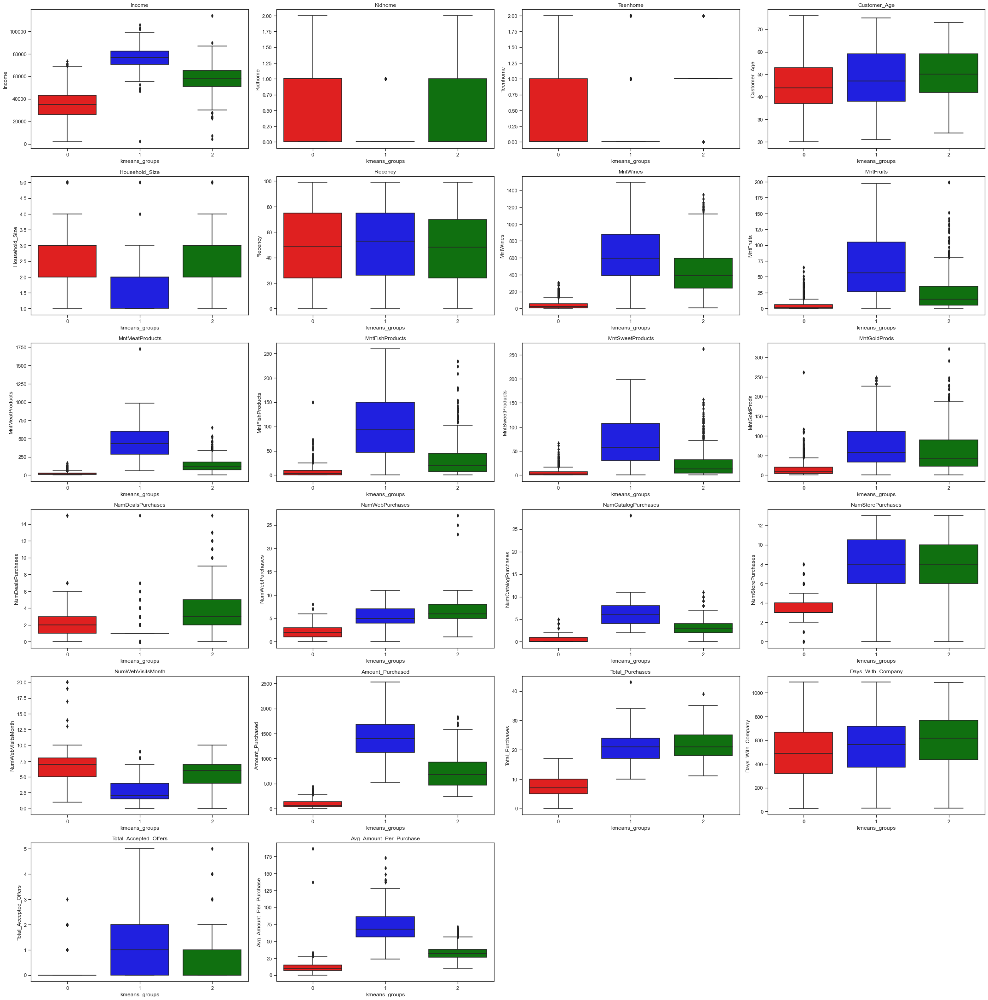

In [111]:
# Define the columns for cluster analysis
all_col = [
    'Income',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
# print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)
    
    sns.boxplot(y=df[variable], x=df['kmeans_groups'], palette=color_mapping)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

In [112]:
# Calculate how many observations are in each cluster
df_pca_kmeans['kmeans_groups'].value_counts()

0    1041
2     613
1     551
Name: kmeans_groups, dtype: int64

**Observations:**
- We can see that each clusters has a good amount of observations

In [113]:
# Describe() the orginal data using the kmeans 3 clusters
all_col = [
    'Income',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('kmeans_groups')[all_col].describe()

Income                                                        \
                count          mean           std     min      25%      50%   
kmeans_groups                                                                 
0              1041.0  34982.161383  12580.690587  1730.0  26091.0  34838.0   
1               551.0  76350.938294   9695.481662  2447.0  70509.0  76773.0   
2               613.0  57652.401305  11561.282439  4428.0  50729.0  58293.0   

                                 Kidhome                                     \
                   75%       max   count      mean       std  min  25%  50%   
kmeans_groups                                                                 
0              43269.0   73395.0  1041.0  0.756964  0.509064  0.0  0.0  1.0   
1              82275.0  105471.0   551.0  0.038113  0.191642  0.0  0.0  0.0   
2              65295.0  113734.0   613.0  0.270799  0.469751  0.0  0.0  0.0   

                        Teenhome                                               \
               75%  max    count      mean       std  min  25%  50%  75%  max   
kmeans_groups                                                                   
0              1.0  2.0   1041.0  0.476465  0.527761  0.0  0.0  0.0  1.0  2.0   
1              0.0  1.0    551.0  0.212341  0.435172  0.0  0.0  0.0  0.0  2.0   
2              1.0  2.0    613.0  0.822186  0.494443  0.0  1.0  1.0  1.0  2.0   

              Customer_Age                                                \
                     count       mean        std   min   25%   50%   75%   
kmeans_groups                                                              
0                   1041.0  44.944284  11.127615  20.0  37.0  44.0  53.0   
1                    551.0  48.047187  13.131002  21.0  38.0  47.0  59.0   
2                    613.0  49.893964  10.562459  24.0  42.0  50.0  59.0   

                    Household_Size                                          \
                max          count      mean       std  min  25%  50%  75%   
kmeans_groups                                                                
0              76.0         1041.0  2.886647  0.843883  1.0  2.0  3.0  3.0   
1              75.0          551.0  1.872958  0.709811  1.0  1.0  2.0  2.0   
2              73.0          613.0  2.743883  0.811266  1.0  2.0  3.0  3.0   

                   Recency                                                     \
               max   count       mean        std  min   25%   50%   75%   max   
kmeans_groups                                                                   
0              5.0  1041.0  49.165226  29.018787  0.0  24.0  49.0  75.0  99.0   
1              5.0   551.0  50.419238  29.379713  0.0  26.0  53.0  75.0  99.0   
2              5.0   613.0  47.476346  28.348292  0.0  24.0  48.0  70.0  99.0   

              MntWines                                                    \
                 count        mean         std  min    25%    50%    75%   
kmeans_groups                                                              
0               1041.0   44.270893   54.636171  0.0    8.0   22.0   58.0   
1                551.0  644.439201  323.491845  1.0  389.5  594.0  881.5   
2                613.0  446.853181  267.509015  6.0  243.0  387.0  595.0   

                      MntFruits                                                \
                  max     count       mean        std  min   25%   50%    75%   
kmeans_groups                                                                   
0               309.0    1041.0   4.950048   7.544063  0.0   0.0   2.0    6.0   
1              1493.0     551.0  69.098004  50.795646  0.0  26.5  56.0  105.0   
2              1349.0     613.0  24.458401  29.271944  0.0   5.0  15.0   35.0   

                     MntMeatProducts                                       \
                 max           count        mean         std   min    25%   
kmeans_groups                                                      

**Observations and Insights:**

- Group 0: There are 1041 observations in this group. This group has the lowest mean Income with $34,982 with a range from $1,730-$73,395. This group seems to have the most amount of kids out of the other group with a mean of 0.76. This group has average amount of teens in the home with a mean of 0.48 teens in the home. This group is the youngest group out of all groups with a mean age of 45 years old with a range of 20-76 years of age. This group has the largest family size with a mean of 2.89 and a range of 1-5 members in the family. This group by far has the lowest amount of wines purchased with a mean of 44 dollars spent and a range of $0-$1041. This group also doesnt spend the least on fruits with a mean of $4.9 spent with a range of $0-$65. The amount of meats is also the lowest out of all groups with a mean of $23 and a range of $0-$168. Fish is also similar as this groups the least with a mean of $7 and a range of $0-$150. This groups spends the least of Sweets with a mean of $5 and a range of $0-$66. The amount of gold spent is also the lowest with a mean of $15 and a range of $0-$262. This group is in the middle with the amount of deals with a mean of 2 and a range of 0-15 deals purchased. This group is the least likely to purchase through the web with a mean of 2.13 and a range of 0-8 web purchases. This group is the least likely to purchase through the catalog with a mean of 0.56 and a range of 0-5 catalog purchases. This group makes the least store purchases out of all the groups, but its this groups primary way of purchasing products with a mean of 3.3 and a range of 0-8 purchases made at the store. This group makes the most visits to the website out of all groups with a mean of 6.4 and a range of 1-20 visits per month. The mean amount spent over 2 years fror this group is $86 and a range of $5-$442 spent, which is by far the least of any group. This group has made the least total purchases with the company with a mean of 8 purchases and a range of 0-17 purchases. The mean days with company is about 500 days with a range of 26-1089 days which is on average the least of any group but its a huge difference, but it is noticable. This group is the least likely to paricipate in a campaign with a mean of 0.17 offers accepted with a range of 0-3 capaigns paricipated. The average amount spent on a purchase for this group is $11 with a range of $0-$187

- Group 0 Insights: **Low-Income, Larger Younger Families, Least Spending, Least Campaign Engaged**
    - Demographics: Predominantly younger families with children (both kids and teens) and the largest family size.
    - Income and Spending: Lowest income and overall spending among the groups across various product categories.
    - Purchase Behavior: Prefers store purchases, with the highest number of store purchases and website visits but spends the least overall.
    - Engagement: Least engaged with campaigns and has the shortest duration of relationship with the company.
    - Conclusions: This group seems to represent younger, larger families possibly in earlier stages of their careers, given their lower incomes and larger household sizes. Their spending is conservative, likely due to budget constraints. Marketing strategies for this group might focus on deals and budget-friendly options, and channels should likely involve both in-store and online platforms, given their propensity for store purchases and website visits. **Focus on budget-friendly deals and options, possibly targeting young family-oriented products and utilizing both in-store and online platforms for engagement.**

- Group 1: There are 551 observations in this group. This group has the highest mean income of $76,350.94 with a range from $2,447.00-$105,471.00. This group has the lowest mean amount of kids of 0.04 with a range from 0.00-1.00. This group has the lowest mean teens in the home of 0.21 with a range from 0.00-2.00. This group has the  mean age of 48.05 with a range from 21.00-75.00. This group has the lowest mean family size of 1.87 with a range from 1.00-5.00. This group has the highest mean amount of wines purchased of $644.44 with a range from $1.00-$1,493.00. This group has the highest mean amount spent on fruits of $69.10 with a range from $0.00-$197.00. This group has the highest mean amount spent on meats of $462.37 with a range from $61.00-$1,725.00. This group has the highest mean amount spent on fish of $102.14 with a range from $0.00-$259.00. This group has the highest mean amount spent on sweets of $72.04 with a range from $0.00-$198.00. This group has the highest mean amount spent on gold of $79.12 with a range from $0.00-$249.00. This group has the lowest mean amount of deals of 1.30 with a range from 0-15 deals purchased. This group has the mean web purchases of 5.23 with a range from 0-11. This group has the highest mean catalog purchases of 6.06 with a range from 2-28. This group has the highest mean store purchases of 8.25 with a range from 0.-13. This group has the lowest mean visits to the website per month of 2.91 with a range from 0-9. This group has the highest mean amount spent over 2 years of $1,429.20 with a range from $523.00-$2,525.00. This group has the  mean total purchases with the company of 20.83 with a range from 10-43. This group has the  mean days with company of 545.29 with a range from 27-1,089 days. This group has the highest mean offers accepted of 1.04 with a range from 0.00-5.00 campaigns accepted. This group has the highest mean average amount spent on a purchase of $71.46 with a range from $23.77-$173.23. 

- Group 1 Insights: **High-Income, Smaller Families, Older, Highest Spending, Campaign Engaged**
    - Demographics: Middle of the pact for age of customer, families likely with older children (teens).
    - Income and Spending: Mid-level income and spending, neither the highest nor the lowest.
    - Purchase Behavior: Exhibits balanced purchase behavior across web, catalog, and store platforms.
    - Engagement: Highly engaged with campaigns and has the longest duration of relationship with the company.
    - Conclusions: Group 1 appears to be affluent, likely consisting of well-established individuals or couples without children, who have the financial capacity to spend significantly across various categories. Strategies for this group might focus on premium products and exclusive online deals, given their high spending and frequent online purchases. Maintaining engagement through online channels and catalogs seems crucial for this segment. This group is also the most engaded in marketing campaigns so forming campaigns around this group could be a good move. **Leverage their financial capacity by offering premium products and exclusive deals through online and catalog channels. Consider loyalty or reward programs to leverage their high engagement and long-term relationship with the company.**

- Group 2: There are 613 observations in this group. This group has the  mean income of $57,652.40 with a range from $4,428.00-$113,734.00. This group has the  mean amount of kids of 0.27 with a range from 0-2. This group has the highest mean teens in the home of 0.82 with a range from 0.-2 teens. This group has the highest mean age of 49.89 with a range from 24-73. This group has the mean family size of 2.74 with a range from 1-5. This group has the  mean amount of wines purchased of $446.85 with a range from $6.00-$1,349.00. This group has the  mean amount spent on fruits of $24.46 with a range from $0.00-$199.00. This group has the  mean amount spent on meats of $139.88 with a range from $3.00-$650.00. This group has the  mean amount spent on fish of $31.78 with a range from $0.00-$234.00. This group has the  mean amount spent on sweets of $24.15 with a range from $0.00-$262.00. This group has the  mean amount spent on gold of $61.91 with a range from $0.00-$321.00. This group has the highest mean amount of deals of 3.72 with a range from 0-15 deals purchased. This group has the highest mean web purchases of 6.43 with a range from 1-27. This group has the  mean catalog purchases of 3.12 with a range from 0-11. This group has a mean store purchases of 7.98 with a range from 0-13. This group has the  mean visits to the website per month of 5.71 with a range from 0-10. This group has the  mean amount spent over 2 years of $729.03 with a range from $240.00-$1,829.00. This group has the highest mean total purchases with the company of 21.25 with a range from 11-39. This group has the highest mean days with company of 596.58 with a range from 27-1,087. This group has a mean offers accepted of 0.39 with a range from 0-5. This group has the mean average amount spent on a purchase of $34.06 with a range from $10.26-$71.35.

- Group 2 Insights: **Mid-Income, Older Teen-Oriented Families, Moderate Spending, Deal Seekers, Moderatley Engaged**
    - Demographics: Predominantly older individuals or couples without children.
    - Income and Spending: Highest income and the highest spending across various product categories.
    - Purchase Behavior: Highly engaged in web and catalog purchases, indicating a preference for online shopping.
    - Engagement: Not the most engaged in campaigns but is still fairly highly engaged with campaigns and has the longest duration of relationship with the company.
    - Conclusions: This group seems to represent mid-income families, possibly with teenagers, given the noticeable presence of teens in the home. They have a balanced shopping behavior, utilizing web, catalog, and store purchases, which indicates marketing strategies might need a multi-channel approach. Their high engagement with campaigns and the longest relationship with the company suggest that loyalty programs or campaigns might be particularly effective with this group. **Utilize a multi-channel marketing approach and consider loyalty or reward programs to leverage their high engagement and long-term relationship with the company.**

4 Clusters

In [114]:
df_pca_kmeans = df_pca.copy()

In [115]:
# Perform K-Means clustering with 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(df_pca_kmeans)

KMeans(n_clusters=4, random_state=42)

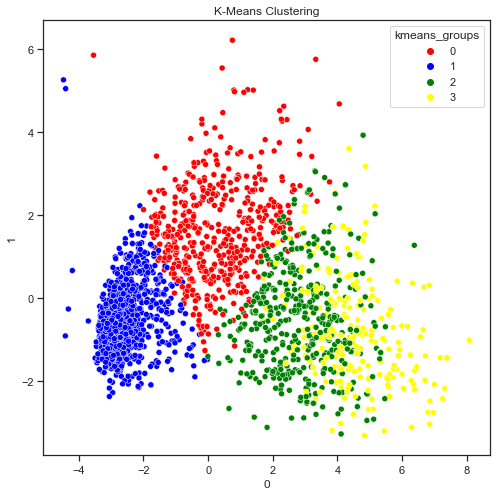

In [116]:
# Add cluster labels to your DataFrame
df_pca_kmeans['kmeans_groups'] = kmeans.labels_
model_data['kmeans_groups'] = kmeans.labels_
df['kmeans_groups'] = kmeans.labels_
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green', 3: 'yellow'}
# Create a scatter plot 
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_kmeans[0], y=df_pca_kmeans[1], data=df_pca_kmeans, hue=df_pca_kmeans['kmeans_groups'], palette=color_mapping)
plt.title("K-Means Clustering")
plt.show()

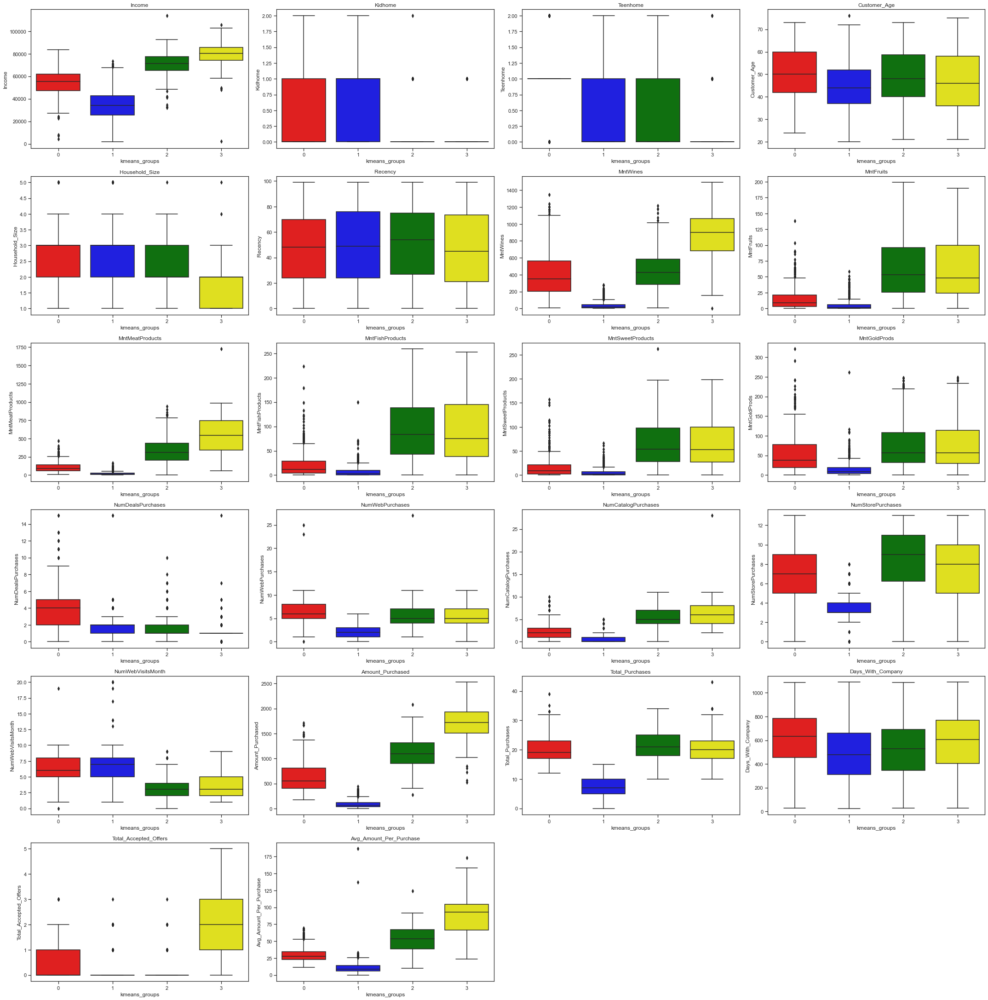

In [117]:
all_col = [
    'Income',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
# print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)
    
    sns.boxplot(y=df[variable], x=df['kmeans_groups'], palette=color_mapping)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

In [118]:
df_pca_kmeans['kmeans_groups'].value_counts()

1    986
0    526
2    442
3    251
Name: kmeans_groups, dtype: int64

**Observations:**
- Each cluster still has a decent number of observations

In [119]:
all_col = [
    'Income',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('kmeans_groups')[all_col].describe()

Income                                                          \
               count          mean           std      min       25%      50%   
kmeans_groups                                                                  
0              526.0  54298.435361  11055.558789   4428.0  47013.00  55320.5   
1              986.0  34421.996957  12515.800902   1730.0  25459.50  34194.5   
2              442.0  70828.106335   9739.459046  31907.0  65200.75  71117.5   
3              251.0  79759.482072  10594.054547   2447.0  74060.00  80360.0   

                                  Kidhome                                     \
                    75%       max   count      mean       std  min  25%  50%   
kmeans_groups                                                                  
0              61968.00   83664.0   526.0  0.361217  0.515232  0.0  0.0  0.0   
1              42546.25   73395.0   986.0  0.758621  0.506357  0.0  0.0  1.0   
2              77374.75  113734.0   442.0  0.056561  0.240869  0.0  0.0  0.0   
3              85710.50  105471.0   251.0  0.047809  0.213788  0.0  0.0  0.0   

                        Teenhome                                               \
               75%  max    count      mean       std  min  25%  50%  75%  max   
kmeans_groups                                                                   
0              1.0  2.0    526.0  0.876426  0.467959  0.0  1.0  1.0  1.0  2.0   
1              1.0  2.0    986.0  0.456389  0.526095  0.0  0.0  0.0  1.0  2.0   
2              0.0  2.0    442.0  0.377828  0.508215  0.0  0.0  0.0  1.0  2.0   
3              0.0  1.0    251.0  0.155378  0.394666  0.0  0.0  0.0  0.0  2.0   

              Customer_Age                                                 \
                     count       mean        std   min   25%   50%    75%   
kmeans_groups                                                               
0                    526.0  50.338403  10.323322  24.0  42.0  50.0  60.00   
1                    986.0  44.665314  11.072514  20.0  37.0  44.0  52.00   
2                    442.0  48.769231  12.455860  21.0  40.0  48.0  58.75   
3                    251.0  46.900398  13.307218  21.0  36.0  46.0  58.00   

                    Household_Size                                          \
                max          count      mean       std  min  25%  50%  75%   
kmeans_groups                                                                
0              73.0          526.0  2.885932  0.801375  1.0  2.0  3.0  3.0   
1              76.0          986.0  2.869168  0.841875  1.0  2.0  3.0  3.0   
2              73.0          442.0  2.072398  0.761433  1.0  2.0  2.0  3.0   
3              75.0          251.0  1.816733  0.714338  1.0  1.0  2.0  2.0   

                   Recency                                                \
               max   count       mean        std  min   25%   50%    75%   
kmeans_groups                                                              
0              5.0   526.0  47.511407  28.593021  0.0  24.0  48.0  70.00   
1              5.0   986.0  49.222110  28.947289  0.0  24.0  49.0  76.00   
2              5.0   442.0  51.178733  28.631797  0.0  27.0  54.0  74.75   
3              5.0   251.0  47.490040  29.992847  0.0  21.0  45.0  73.50   

                    MntWines                                             \
                max    count        mean         std  min    25%    50%   
kmeans_groups                                                             
0              99.0    526.0  412.817490  262.989692  7.0  204.0  349.0   
1              99.0    986.0   37.591278   46.054308  0.0    8.0   19.5   
2              99.0    442.0  455.766968  220.232978  6.0  285.0  425.0   
3              99.0    251.0  874.250996  304.958746  1.0  684.0  901.0   

                               MntFruits                                   \
                   75%     max     count       mean        std  min   25%   
kmeans_groups           

**Observations and Insights:**

- Group 0: There are 526 observations in this group. This group has the  mean income of $54,298.44 with a range from $4,428.00-$83,664.00. This group has the  mean amount of kids of 0.36 with a range from 0-2. This group has the highest mean teens in the home of 0.88 with a range from 0-2. This group has the highest mean age of 50.34 with a range from 24-73. This group has the highest mean family size of 2.89 with a range from 1-5. This group has the  mean amount of wines purchased of $412.82 with a range from $7.00-$1,349.00. This group has the  mean amount spent on fruits of $15.82 with a range from $0.00-$138.00. This group has the  mean amount spent on meats of $110.70 with a range from $10.00-$469.00. This group has the  mean amount spent on fish of $21.48 with a range from $0.00-$223.00. This group has the  mean amount spent on sweets of $15.83 with a range from $0.00-$157.00. This group has the  mean amount spent on gold of $56.02 with a range from $0.00-$321.00. This group has the highest mean amount of deals of 4.14 with a range from 0-15. This group has the highest mean web purchases of 6.29 with a range from 0-25. This group has the  mean catalog purchases of 2.66 with a range from 0-10. This group has the  mean store purchases of 7.15 with a range from 0-13. This group has the  mean visits to the website per month of 6.28 with a range from 0-19. This group has the  mean amount spent over 2 years of $632.67 with a range from $178.00-$1,706.00. This group has the  mean total purchases with the company of 20.24 with a range from 12-39. This group has the highest mean days with company of 611.69 with a range from 27-1,087. This group has the  mean offers accepted of 0.40 with a range from 0-3. This group has the  mean average amount spent on a purchase of $30.66 with a range from $11.12-$69.19. 

- Group 0 Insights: **Middle-Income, Older Teen-Oriented Families, Moderate Spending, Deal Seekers, Moderately Engaged**
    - Demographics: Likely families with teenagers, given the presence of teens in the home.
    - Income and Spending: Mid-level income and spending, not leaning towards either extreme.
    - Engagement: Engages with the company across various purchasing platforms (web, store, catalog).
    - Conclusions: Likely families navigating through the expenses of having teenagers, with a balanced, moderate approach to spending. Multi-channel engagement strategies with a blend of deals and premium options might appeal to this group.**Employ a balanced, multi-channel approach, offering a mix of premium and budget-friendly options.**

- Group 1: There are 986 observations in this group. This group has the lowest mean income of $34,422.00 with a range from $1,730.00-$73,395.00. This group has the highest mean amount of kids of 0.76 with a range from 0-2. This group has the  mean teens in the home of 0.46 with a range from 0-2. This group has the lowest mean age of 44.67 with a range from 20-76. This group has the  mean family size of 2.87 with a range from 1-5. This group has the lowest mean amount of wines purchased of $37.59 with a range from $0.00-$279.00. This group has the lowest mean amount spent on fruits of $4.75 with a range from $0.00-$58.00. This group has the lowest mean amount spent on meats of $20.98 with a range from $0.00-$168.00. This group has the lowest mean amount spent on fish of $6.98 with a range from $0.00-$150.00. This group has the lowest mean amount spent on sweets of $5.03 with a range from $0.00-$66.00. This group has the lowest mean amount spent on gold of $14.24 with a range from $0.00-$262.00. This group has the  mean amount of deals of 1.90 with a range from 0-15. This group has the lowest mean web purchases of 1.99 with a range from 0-6. This group has the lowest mean catalog purchases of 0.52 with a range from 0-5. This group has the lowest mean store purchases of 3.20 with a range from 0-8. This group has the highest mean visits to the website per month of 6.36 with a range from 1-20. This group has the lowest mean amount spent over 2 years of $89.57 with a range from $5.00-$442.00. This group has the lowest mean total purchases with the company of 7.60 with a range from 0-15. This group has the lowest mean days with company of 492.86 with a range from 26-1,089. This group has the lowest mean offers accepted of 0.16 with a range from 0-3. This group has the lowest mean average amount spent on a purchase of $10.73 with a range from $0.00-$186.50.  

- Group 1 Insights: **Lower Income, Younger Families, Conservative Spending**
    - Demographics: Younger families, possibly with small children, given the presence of kids in the home
    - Income and Spending: Lower income and conservative spending across categories.
    - Engagement: Engages primarily through store purchases and website visits.
    - Conclusions: Family-oriented, budget-friendly options, possibly with an emphasis on kids' products, might appeal to this group. Strategies may involve both in-store and online platforms, with a potential focus on deals and savings. **Focus on in-store and online platforms, offering deals and budget-friendly, family-oriented options.**

- Group 2: There are 442 observations in this group. This group has the  mean income of $70,828.11 with a range from $31,907.00-$113,734.00. This group has the  mean amount of kids of 0.06 with a range from 0-2. This group has the mean teens in the home of 0.38 with a range from 0-2. This group has the  mean age of 48.77 with a range from 21-73. This group has the  mean family size of 2.07 with a range from 1-5. This group has the  mean amount of wines purchased of $455.77 with a range from $6.00-$1,215.00. This group has the highest mean amount spent on fruits of $65.78 with a range from $0.00-$199.00. This group has the  mean amount spent on meats of $340.53 with a range from $3.00-$940.00. This group has the highest mean amount spent on fish of $95.31 with a range from $0.00-$259.00. This group has the highest mean amount spent on sweets of $67.29 with a range from $0.00-$262.00. This group has the  mean amount spent on gold of $77.16 with a range from $0.00-$248.00. This group has the  mean amount of deals of 1.72 with a range from 0-10. This group has the  mean web purchases of 5.43 with a range from 1-27. This group has the  mean catalog purchases of 5.33 with a range from 0-11. This group has the highest mean store purchases of 8.97 with a range from 0-13. This group has the lowest mean visits to the website per month of 3.07 with a range from 0-9. This group has the  mean amount spent over 2 years of $1,101.84 with a range from $277.00-$2,074.00. This group has the highest mean total purchases with the company of 21.45 with a range from 10-34. This group has the  mean days with company of 524.16 with a range from 27-1,086. This group has the  mean offers accepted of 0.21 with a range from 0-3. This group has the  mean average amount spent on a purchase of $53.03 with a range from $10.26-$124.55. 


- Group 2 Insights: **Affluent, Older Families, Generous Spending**
    - Demographics: Families, likely with older children or adults, given the minimal presence of small kids.
    - Income and Spending: High income and spends generously across various product categories.
    - Engagement: Engages through various platforms with a notable preference for online shopping.
    - Conclusions: Offering premium products and personalized, exclusive deals, especially through online channels, might be effective. Maintaining engagement and loyalty, given their financial capacity, could be pivotal for revenue. **Leverage their financial capacity by offering premium products and exclusive deals through online channels.**

- Group 3: There are 251 observations in this group. This group has the highest mean income of $79,759.48 with a range from $2,447.00-$105,471.00. This group has the lowest mean amount of kids of 0.05 with a range from 0-1. This group has the lowest mean teens in the home of 0.16 with a range from 0-2. This group has the  mean age of 46.90 with a range from 21-75. This group has the lowest mean family size of 1.82 with a range from 1-5. This group has the highest mean amount of wines purchased of $874.25 with a range from $1.00-$1,493.00. This group has the  mean amount spent on fruits of $64.29 with a range from $0.00-$190.00. This group has the highest mean amount spent on meats of $538.17 with a range from $61.00-$1,725.00. This group has the  mean amount spent on fish of $91.43 with a range from $0.00-$253.00. This group has the  mean amount spent on sweets of $66.87 with a range from $0.00-$198.00. This group has the highest mean amount spent on gold of $77.85 with a range from $0.00-$249.00. This group has the lowest mean amount of deals of 1.22 with a range from 0-15. This group has the  mean web purchases of 5.46 with a range from 0-11. This group has the highest mean catalog purchases of 6.25 with a range from 2-28. This group has the  mean store purchases of 7.82 with a range from 0-13. This group has the  mean visits to the website per month of 3.32 with a range from 1-9. This group has the highest mean amount spent over 2 years of $1,712.86 with a range from $523.00-$2,525.00. This group has the  mean total purchases with the company of 20.75 with a range from 10-43. This group has the  mean days with company of 585.82 with a range from 30-1,089. This group has the highest mean offers accepted of 2.09 with a range from 0-5. This group has the highest mean average amount spent on a purchase of $86.50 with a range from $23.77-$173.23.

- Group 3 Insights: **High-Income, Smaller Families/Individuals, Highest Spending, Very Engaged**
    - Demographics: Smaller families or individuals without the presence of children or teens.
    - Income and Spending: High income with the highest spending across categories.
    - Engagement: Primarily engages through web and catalog purchases.
    - Conclusions: Strategies for this affluent group could focus on premium and exclusive products, with marketing through online and catalog channels. Special offers or loyalty programs for high-value customers could be particularly effective here. **Focus on online and catalog channels, offering exclusive and premium products, possibly with a loyalty program.**

5 Clusters

In [120]:
df_pca_kmeans = df_pca.copy()

In [121]:
# Perform K-Means clustering with 5 clusters
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(df_pca_kmeans)

KMeans(n_clusters=5, random_state=42)

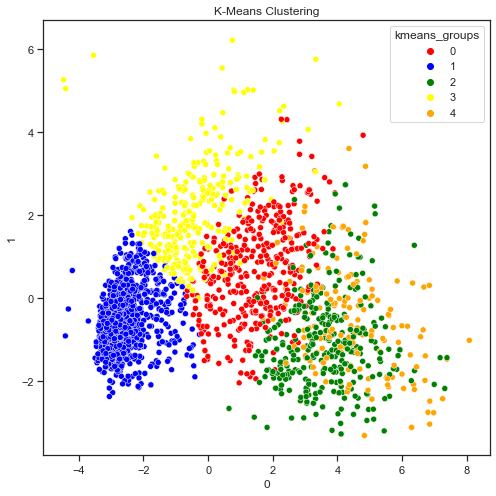

In [122]:
# Add cluster labels to your DataFrame
df_pca_kmeans['kmeans_groups'] = kmeans.labels_
model_data['kmeans_groups'] = kmeans.labels_
df['kmeans_groups'] = kmeans.labels_
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green', 3: 'yellow', 4: 'orange'}
# Create a scatter plot 
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_kmeans[0], y=df_pca_kmeans[1], data=df_pca_kmeans, hue=df_pca_kmeans['kmeans_groups'], palette=color_mapping)
plt.title("K-Means Clustering")
plt.show()

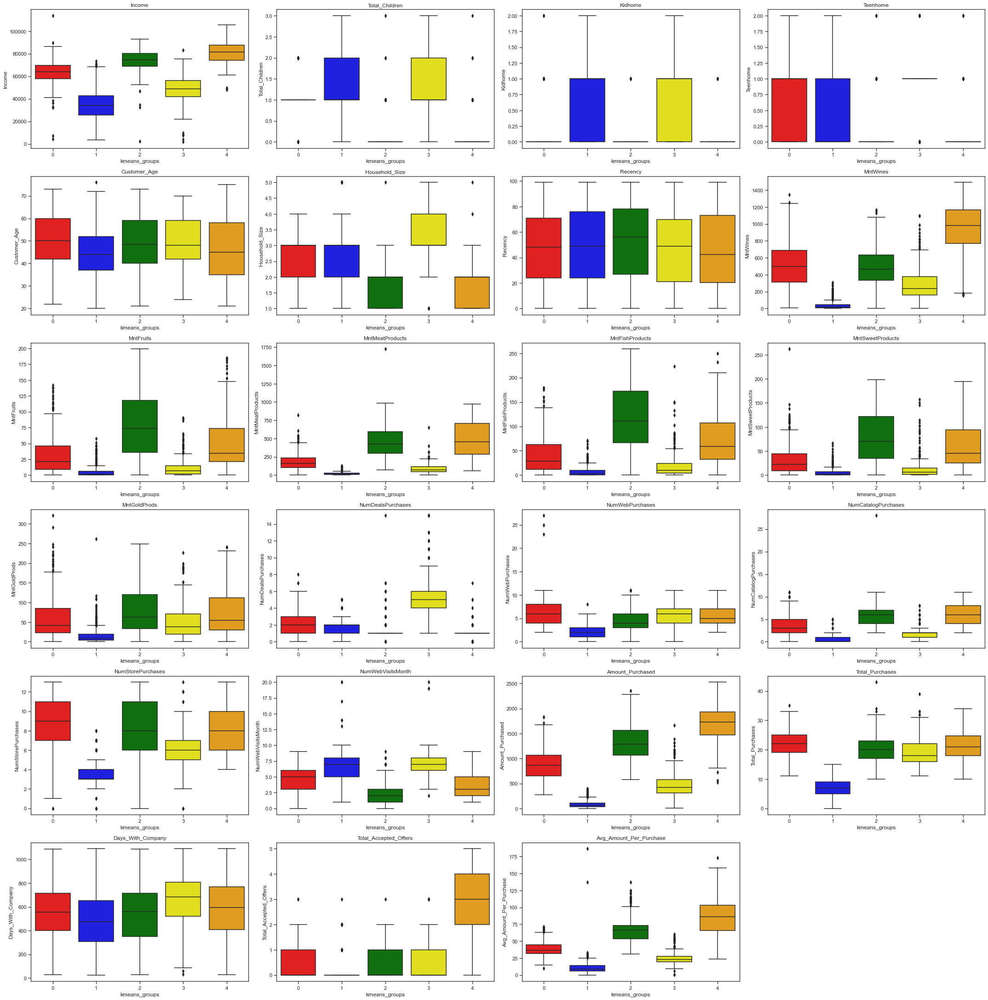

In [123]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
# print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)
    
    sns.boxplot(y=df[variable], x=df['kmeans_groups'], palette=color_mapping)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

In [124]:
df_pca_kmeans['kmeans_groups'].value_counts()

1    968
0    409
2    340
3    314
4    174
Name: kmeans_groups, dtype: int64

**Observations:**
- Each group has a decent number of observations, group 4 being the smallest group with only 174 observations

In [125]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('kmeans_groups')[all_col].describe()

Income                                                          \
               count          mean           std      min       25%      50%   
kmeans_groups                                                                  
0              409.0  63608.921760  10342.018605   4428.0  57642.00  63998.0   
1              968.0  34592.585744  12463.233925   3502.0  25509.00  34236.0   
2              340.0  73987.723529   9563.186168   2447.0  68691.75  74676.5   
3              314.0  48112.168790  11476.613382   1730.0  41915.75  48828.0   
4              174.0  80816.091954  10137.091159  48192.0  74232.50  81636.0   

                                 Total_Children                                \
                   75%       max          count      mean       std  min  25%   
kmeans_groups                                                                   
0              69759.0  113734.0          409.0  0.836186  0.533267  0.0  1.0   
1              42665.5   73395.0          968.0  1.214876  0.698133  0.0  1.0   
2              80463.5   92859.0          340.0  0.261765  0.478761  0.0  0.0   
3              56023.0   83273.0          314.0  1.423567  0.651039  0.0  1.0   
4              87748.0  105471.0          174.0  0.218391  0.490965  0.0  0.0   

                             Kidhome                                          \
               50%  75%  max   count      mean       std  min  25%  50%  75%   
kmeans_groups                                                                  
0              1.0  1.0  2.0   409.0  0.092910  0.307063  0.0  0.0  0.0  0.0   
1              1.0  2.0  3.0   968.0  0.756198  0.506894  0.0  0.0  1.0  1.0   
2              0.0  0.0  3.0   340.0  0.032353  0.177196  0.0  0.0  0.0  0.0   
3              1.0  2.0  3.0   314.0  0.592357  0.547494  0.0  0.0  1.0  1.0   
4              0.0  0.0  3.0   174.0  0.045977  0.210040  0.0  0.0  0.0  0.0   

                   Teenhome                                               \
               max    count      mean       std  min  25%  50%  75%  max   
kmeans_groups                                                              
0              2.0    409.0  0.743276  0.519342  0.0  0.0  1.0  1.0  2.0   
1              2.0    968.0  0.458678  0.526787  0.0  0.0  0.0  1.0  2.0   
2              1.0    340.0  0.229412  0.441591  0.0  0.0  0.0  0.0  2.0   
3              2.0    314.0  0.831210  0.486410  0.0  1.0  1.0  1.0  2.0   
4              1.0    174.0  0.172414  0.422130  0.0  0.0  0.0  0.0  2.0   

              Customer_Age                                                \
                     count       mean        std   min   25%   50%   75%   
kmeans_groups                                                              
0                    409.0  50.317848  11.141105  22.0  42.0  50.0  60.0   
1                    968.0  44.649793  11.035633  20.0  37.0  44.0  52.0   
2                    340.0  48.379412  12.643286  21.0  40.0  48.5  59.0   
3                    314.0  49.251592  10.610912  24.0  42.0  48.0  59.0   
4                    174.0  46.729885  13.618311  21.0  35.0  45.0  58.0   

                    Household_Size                                          \
                max          count      mean       std  min  25%  50%  75%   
kmeans_groups                                                                
0              73.0          409.0  2.474328  0.757286  1.0  2.0  3.0  3.0   
1              76.0          968.0  2.866736  0.838456  1.0  2.0  3.0  3.0   
2              73.0          340.0  1.891176  0.676128  1.0  1.0  2.0  2.0   
3              70.0          314.0  3.098726  0.822875  1.0  3.0  3.0  4.0   
4              75.0          174.0  1.816092  0.753086  1.0  1.0  2.0  2.0   

                   Recency                                                 \
               max   count       mean        std  min    25%   50%    75%   
kmeans_groups                                                               
0        

**Observations and Insights:**

- Group 0: There are 409 observations in this group. This group has the mean income of $63,608.92 with a range from $4,428.00-$113,734.00. This group has the mean amount of kids of 0.09 with a range from 0-2. This group has the mean teens in the home of 0.74 with a range from 0-2. This group has the highest mean age of 50.32 with a range from 22-73. This group has the mean family size of 2.47 with a range from 1-4. This group has the mean amount of wines purchased of $520.68 with a range from $6.00-$1,349.00. This group has the mean amount spent on fruits of $32.10 with a range from $0.00-$142.00. This group has the mean amount spent on meats of $183.92 with a range from $3.00-$818.00. This group has the mean amount spent on fish of $40.58 with a range from $0.00-$179.00. This group has the mean amount spent on sweets of $31.17 with a range from $0.00-$262.00. This group has the mean amount spent on gold of $62.81 with a range from $0.00-$321.00. This group has the mean amount of deals of 2.41 with a range from 0-8. This group has the highest mean web purchases of 6.35 with a range from 2-27. This group has the mean catalog purchases of 3.92 with a range from 0-11. This group has the highest mean store purchases of 9.10 with a range from 0-13. This group has the mean visits to the website per month of 4.65 with a range from 0-9. This group has the mean amount spent over 2 years of $871.26 with a range from $277.00-$1,829.00. This group has the highest mean total purchases with the company of 21.78 with a range from 11-35. This group has the mean days with company of 549.84 with a range from 27-1087. This group has the mean offers accepted of 0.31 with a range from 0-3. This group has the mean average amount spent on a purchase of $40.25 with a range from $10.26-$71.35. 

- Group 0 Insights: **Mature, Affluent, Minimal Children, and Engaged Shoppers**
    - Demographics: Older, smaller families, possibly empty nesters given the low number of kids and teens
    - Income and Spending: High income and spends significantly across various categories, especially on wines.
    - Engagement: Highly engaged with the company, showcasing the highest web and store purchases.
    - Conclusions: Group 0’s engagement and spending habits indicate a ripe opportunity for upselling and cross-selling through online and in-store promotions. Specialized wine promotions and exclusive in-store events may resonate well with this group. **Utilize both online and in-store channels for promotions and exclusive events, with a particular focus on wine offerings.**

- Group 1: There are 968 observations in this group. This group has the lowest mean income of $34,592.59 with a range from $3,502.00-$73,395.00. This group has the highest mean amount of kids of 0.76 with a range from 0-2. This group has the mean teens in the home of 0.51 with a range from 0-2. This group has the mean age of 45.04 with a range from 20-76. This group has the mean family size of 2.32 with a range from 1-4. This group has the lowest mean amount of wines purchased of $46.21 with a range from $0.00-$1,130.00. This group has the mean amount spent on fruits of $5.42 with a range from $0.00-$65.00. This group has the mean amount spent on meats of $24.06 with a range from $0.00-$172.00. This group has the mean amount spent on fish of $6.83 with a range from $0.00-$150.00. This group has the lowest mean amount spent on sweets of $5.03 with a range from $0.00-$66.00. This group has the lowest mean amount spent on gold of $15.20 with a range from $0.00-$262.00. This group has the mean amount of deals of 1.92 with a range from 0-15. This group has the mean web purchases of 2.29 with a range from 0-8. This group has the mean catalog purchases of 0.62 with a range from 0-5. This group has the mean store purchases of 3.38 with a range from 0-8. This group has the mean visits to the website per month of 6.45 with a range from 1-20. This group has the mean amount spent over 2 years of $103.76 with a range from $5.00-$442.00. This group has the mean total purchases with the company of 8.21 with a range from 0-17. This group has the mean days with company of 499.16 with a range from 26-1089. This group has the mean offers accepted of 0.18 with a range from 0-3. This group has the mean average amount spent on a purchase of $12.44 with a range from $0.00-$187.00.  

- Group 1 Insights: **Lower Income, Larger Families, and Modest Spenders, Least Campaign Engaged**
    - Demographics: Larger families with children, potentially in earlier life stages given the lower age and income.
    - Income and Spending: Lowest income and spending is considerably lower across all categories.
    - Engagement: Predominantly engages through web visits but purchases less from the web.
    - Conclusions: Considering the larger family size and lower income, promotional campaigns offering discounts, family packs, or bulk purchase deals might be attractive to this group. **Focus on delivering value-for-money deals, especially through online channels, and consider family-oriented promotions.**

- Group 2: There are 340 observations in this group. This group has the mean Income of $73,987.72 with a range from $2,447.00-$92,859.00. This group has the mean Kidhome of 0.03 with a range from 0.0-1.0. This group has the mean Teenhome of 0.23 with a range from 0.0-2.0. This group has the mean Customer Age of 48.38 with a range from 21.0-73.0. This group has the mean Household Size of 1.89 with a range from 1.0-5.0. This group has the mean Recency of 52.19 with a range from 0.0-99.0. This group has the mean MntWines of $499.10 with a range from $1.00-$1,170.00. This group has the mean MntFruits of $80.62 with a range from $0.00-$142.00. This group has the mean MntMeatProducts of $459.58 with a range from $74.00-$1,725.00. This group has the mean MntFishProducts of $120.26 with a range from $0.00-$259.00. This group has the mean MntSweetProducts of $79.71 with a range from $0.00-$198.00. This group has the mean MntGoldProds of $83.29 with a range from $0.00-$249.00. This group has the mean NumDealsPurchases of 1.43 with a range from 0.0-15.0. This group has the mean NumWebPurchases of 4.91 with a range from 0.0-11.0. This group has the mean NumCatalogPurchases of 5.94 with a range from 2.0-28.0. This group has the mean NumStorePurchases of 8.26 with a range from 0.0-13.0. This group has the mean NumWebVisitsMonth of 2.64 with a range from 0.0-9.0. This group has the mean Amount Purchased of $1,322.56 with a range from $576.00-$2,352.00. This group has the mean Total Purchases of 20.54 with a range from 10.0-43.0. This group has the mean Days With Company of 535.46 with a range from 27.0-1086.0. This group has the mean Total Accepted Offers of 0.33 with a range from 0.0-3.0. This group has the mean Avg Amount Per Purchase of $66.76 with a range from $30.86-$137.36. 


- Group 2 Insights: **Well-Off, Minimal Family Obligations, High Spending**
    - Demographics: Likely middle-aged individuals or couples with minimal family obligations due to low kids and teens.
    - Income and Spending: Above-average income and high spending, notably on meat and fish products.
    - Engagement: Engages through various purchase channels, notably catalogs.
    - Conclusions: Group 2 has the financial means and seems to enjoy a good quality of life, potentially indulging in gourmet food given their spending on meat and fish. Tailoring gourmet or premium product offerings and creating exclusive catalog campaigns might be effective. **Emphasize premium and gourmet offerings, particularly through catalog channels.**

- Group 3:  There are 314 observations in this group. This group has the mean Income of $48,112.17 with a range from $1,730.00-$83,273.00. This group has the mean amount of kids of 0.59 with a range from 0-2. This group has the mean teens in the home of 0.83 with a range from 0-2. This group has the mean age of 49.25 with a range from 24-70. This group has the mean family size of 3.10 with a range from 1-5. This group has the mean amount of wines purchased of $290.21 with a range from $1.00-$1,099.00. This group has the mean amount spent on fruits of $11.73 with a range from $0.00-$90.00. This group has the mean amount spent on meats of $90.05 with a range from $1.00-$650.00. This group has the mean amount spent on fish of $19.25 with a range from $0.00-$223.00. This group has the mean amount spent on sweets of $13.93 with a range from $0.00-$157.00. This group has the mean amount spent on gold of $52.15 with a range from $0.00-$227.00. This group has the mean amount of deals of 5.30 with a range from 1-15. This group has the mean web purchases of 5.93 with a range from 0-11. This group has the mean catalog purchases of 2.03 with a range from 0-8. This group has the mean store purchases of 5.77 with a range from 0-13. This group has the mean visits to the website per month of 7.18 with a range from 2-20. This group has the mean amount spent over 2 years of $477.32 with a range from $8.00-$1,662.00. This group has the mean total purchases with the company of 19.04 with a range from 11-39. This group has the mean days with company of 659.09 with a range from 31-1089. This group has the mean offers accepted of 0.46 with a range from 0-3. This group has the mean average amount spent on a purchase of $24.31 with a range from $0.53-$60.00.

- Group 3 Insights: **Mid-Income, Family-Oriented, Deal Seekers**
    - Demographics: Middle-aged, larger families with both kids and teens.
    - Income and Spending: Mid-level income, with a balanced spending pattern across categories.
    - Engagement: Engages well online, with a notably high number of website visits.
    - Conclusions: Group 3 may be looking for deals that provide value for their mid-level income, especially those that cater to family needs. Given their online engagement, digital marketing campaigns highlighting family deals and savings could be impactful. **Digital campaigns that highlight savings and family packages could resonate well.**

- Group 4: There are 174 observations in this group. This group has the mean income of $80,816.09 with a range from $48,192.00-$105,471.00. This group has the mean amount of kids of 0.05 with a range from 0.0-1.0. This group has the mean teens in the home of 0.17 with a range from 0.0-2.0. This group has the mean age of 46.73 with a range from 21.0-75.0. This group has the mean family size of 1.82 with a range from 1.0-5.0. This group has the mean amount of wines purchased of $946.23 with a range from $152.00-$1,493.00. This group has the mean amount spent on fruits of $54.18 with a range from $0.00-$185.00. This group has the mean amount spent on meats of $488.96 with a range from $61.00-$974.00. This group has the mean amount spent on fish of $76.75 with a range from $0.00-$250.00. This group has the mean amount spent on sweets of $62.27 with a range from $0.00-$194.00. This group has the mean amount spent on gold of $75.61 with a range from $0.00-$241.00. This group has the mean amount of deals of 1.16 with a range from 0.0-7.0. This group has the mean web purchases of 5.76 with a range from 2.0-11.0. This group has the mean catalog purchases of 6.22 with a range from 2.0-11.0. This group has the mean store purchases of 8.02 with a range from 4.0-13.0. This group has the mean visits to the website per month of 3.52 with a range from 1.0-9.0. This group has the mean amount spent over 2 years of $1,704.01 with a range from $523.00-$2,525.00. This group has the mean total purchases with the company of 21.16 with a range from 10.0-34.0. This group has the mean days with company of 580.95 with a range from 30.0-1089.0. This group has the mean offers accepted of 2.62 with a range from 0.0-5.0. This group has the mean average amount spent on a purchase of $84.52 with a range from $23.77-$173.23.

- Group 4 Insights: **High-Income, Premium Spenders, Diverse Shopping Habits, Highly Engaged**
    - Demographics: Likely well-established professionals or couples without significant family obligations.
    - Income and Spending: High income, with the highest spending on various products, notably wines and meats.
    - Engagement: Diverse engagement across web, catalog, and store purchases.
    - Conclusions: Group 4 appreciates quality and has the means to afford it. Strategies might involve exclusive memberships or loyalty programs offering first access to new products or premium customer service. Engage them through diverse channels, possibly with a slight emphasis on catalog marketing. **Implement exclusive membership or loyalty programs and engage through various channels, with some emphasis on catalog offerings.**

### **Describe the characteristics of each cluster**

**Think About It:**
- Are the K-Means profiles providing any deep insights into customer purchasing behavior or which channels they are using?
- What is the next step to get more meaningful insights? 

- Yes, the K-Means clusters are providing deep meaning from the data. We observate that the clusters are well seperated into groups by the customer behavior, such as prefered purchasing channel, prefered items to purchase, total purchases, average purchase cost, campaign offers accepted, deals purchased. Once clustered these groups also have distinct demographic characteristics such as age, income, kids/teens in the home.
- Next, we will compare the different amount of clusters and determine the best amount of clusters.  

**Summary of each cluster:**
- 3 Clusters: 
    - Group 0: Low-Income, Larger Younger Families, Least Spending, Least Campaign Engaged
    - Group 1: High-Income, Smaller Families, Older, Highest Spending, Campaign Engaged
    - Group 2: Mid-Income, Older Teen-Oriented Families, Moderate Spending, Deal Seekers, Moderatley Engaged
- 4 Clusters:
    - Group 0: Middle-Income, Older Teen-Oriented Families, Moderate Spending, Deal Seekers, Moderately Engaged
    - Group 1: Lower Income, Younger Families, Conservative Spending
    - Group 2: Affluent, Older Families, Generous Spending
    - Group 3: High-Income, Smaller Families/Individuals, Highest Spending, Very Engaged
- 5 Clusters:
    - Group 0: Affluent, Mature, Minimal Children, and Engaged Shoppers
    - Group 1: Lower Income, Larger Families, and Modest Spenders, Least Campaign Engaged
    - Group 2: Well-Off, Minimal Family Obligations, High Spending
    - Group 3: Mid-Income, Family-Oriented, Deal Seekers
    - Group 4: High-Income, Premium Spenders, Diverse Shopping Habits, Highly Engaged

Conclusions:
- 3 clusters while it does seperate the groups well, their isnt a lot of granularity on the groups
- 4 clusters seems to be much better as we have two low and two high income groups with more diverse habits and demographics
- 5 clusters seems to be have a lot of detail about distinct groups in the data, with the most seperation of groups based on a large range of factors. There is even a group that seeks out deals. This seems to be better than 3 clusters for sure and probably is better for marketing then 4 clusters.

## **K-Medoids**

In [126]:
df_pca_km = df_pca.copy()

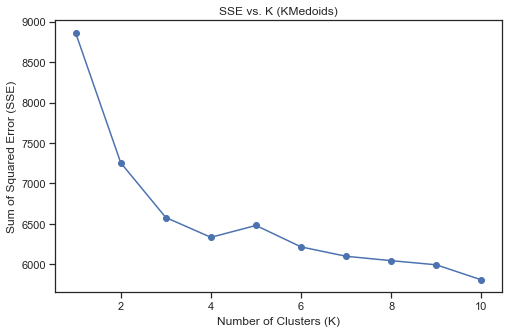

In [127]:
# Initialize a dictionary to store SSE for each K
sse = {}

# Run for a range of Ks and store SSE for each run
for k in range(1, 11):
    kmedoids = KMedoids(n_clusters=k, random_state=42)
    kmedoids.fit(df_pca_km)
    
    # Calculate the SSE manually based on distances
    sse[k] = sum(np.min(cdist(df_pca_km, kmedoids.cluster_centers_, 'euclidean'), axis=1))

# Plot the SSE vs K and plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.title('SSE vs. K (KMedoids)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Error (SSE)')
plt.show()

Silhouette Score for 3 clusters: 0.24286374685178228
Silhouette Score for 4 clusters: 0.22349496710263786
Silhouette Score for 5 clusters: 0.11959370952453006
Silhouette Score for 6 clusters: 0.09376868048694784
Silhouette Score for 7 clusters: 0.0771151039867032


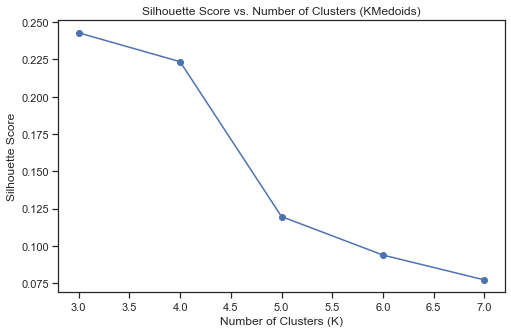

In [128]:
# Initialize a list to store silhouette scores
silhouette_scores = []

# Define the range of cluster numbers to iterate through
cluster_range = range(3, 8)  # Start from 3 clusters and go up to 7 clusters

for n_clusters in cluster_range:
    # Create and fit the KMedoids model
    kmedoids = KMedoids(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmedoids.fit_predict(df_pca_km)
    
    # Calculate the Silhouette Score for this iteration
    silhouette_avg = silhouette_score(df_pca_km, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg}")

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters (KMedoids)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

**Observations:**
- Using the elbow plot, we can see that 3 clusters seems to be the start of the elbow and 4 to 6 clusters we see a flat line. So, from the elbow plot 3-6 clusters seems to be a good place to start. There is a notable bump in score at 5 clusters so we will only look at 3 and 5 clusters.
- Using the silhouette score, we can see that 3 and 4 clusters has the highest score. There apears to be a steap drop off of score at 5 clusters.

Conclusion: For k-mediods we should start our analysis with 3-5 Clusters as that seems to align with what our elbow graph and silhouette scores seem to be suggesting.

In [129]:
# Perform K-Medoids clustering with 3 clusters
kmedoids = KMedoids(n_clusters=3, random_state=42)
kmedoids.fit(df_pca_km)

KMedoids(n_clusters=3, random_state=42)

### **Visualize the clusters using PCA**

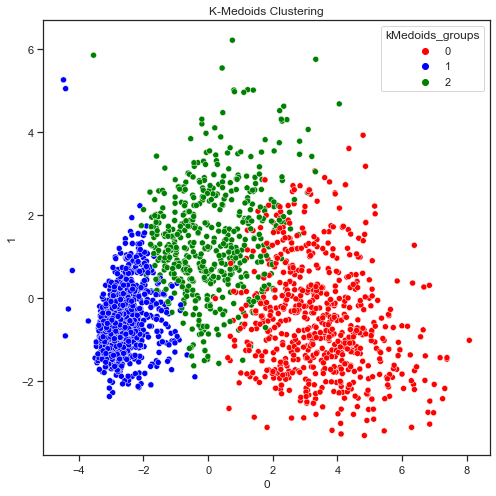

In [130]:
# Add cluster labels to your DataFrame
df_pca_km['kMedoids_groups'] = kmedoids.labels_
model_data['kMedoids_groups'] = kmedoids.labels_
df['kMedoids_groups'] = kmedoids.labels_
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green'}

# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_km[0], y=df_pca_km[1], data=df_pca_km, hue=df_pca_km['kMedoids_groups'], palette=color_mapping)
plt.title("K-Medoids Clustering")
plt.show()

### **Cluster Profiling**

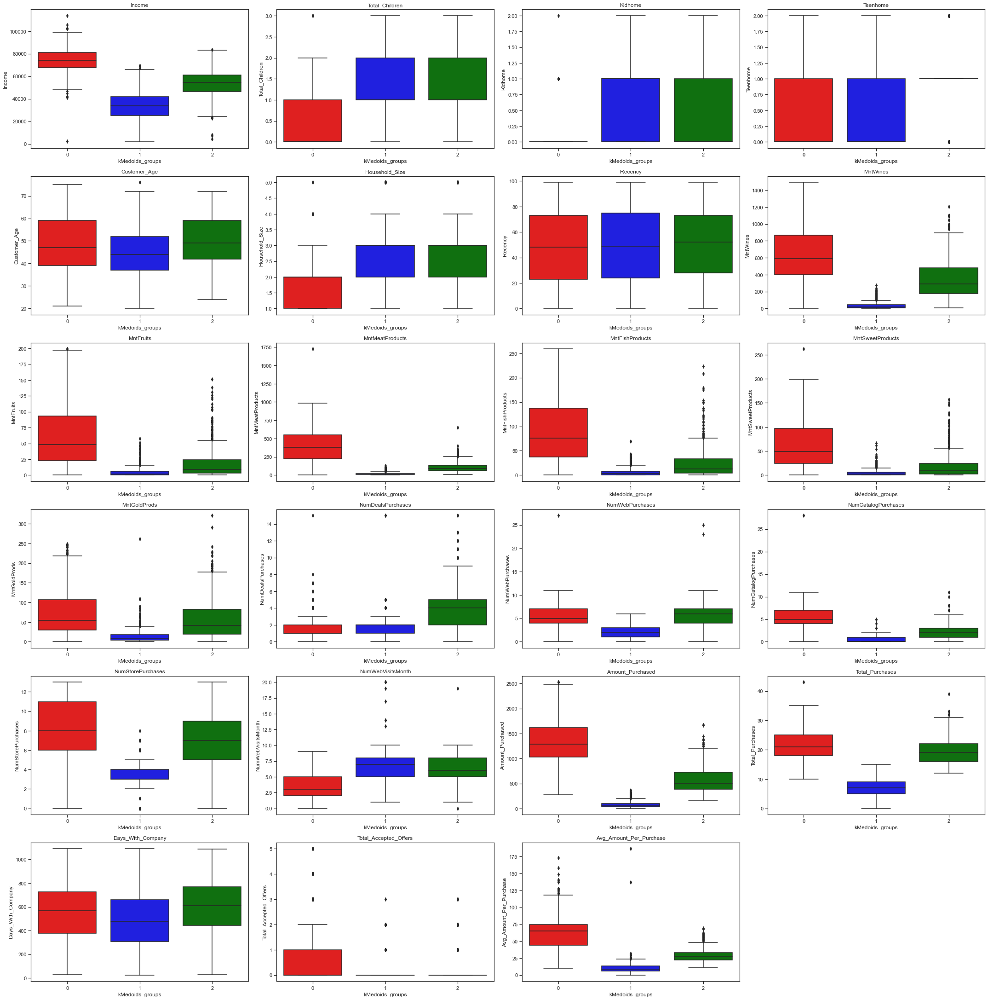

In [131]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
plt.figure(figsize=(30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['kMedoids_groups'], palette=color_mapping)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [132]:
df['kMedoids_groups'].value_counts()

1    949
0    702
2    554
Name: kMedoids_groups, dtype: int64

In [133]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('kMedoids_groups')[all_col].describe()

Income                                                         \
                 count          mean           std     min       25%      50%   
kMedoids_groups                                                                 
0                702.0  74078.069801  10556.172680  2447.0  67445.00  74259.0   
1                949.0  33887.569020  12254.573431  1730.0  25176.00  33629.0   
2                554.0  53546.229242  11297.559954  4428.0  46396.25  54371.0   

                                    Customer_Age                              \
                      75%       max        count       mean        std   min   
kMedoids_groups                                                                
0                80991.75  113734.0        702.0  48.394587  12.837273  21.0   
1                41986.00   69139.0        949.0  44.562698  11.036740  20.0   
2                61285.50   83664.0        554.0  49.788809  10.391634  24.0   

                                        Total_Children                      \
                  25%   50%   75%   max          count      mean       std   
kMedoids_groups                                                              
0                39.0  47.0  59.0  75.0          702.0  0.361823  0.536934   
1                37.0  44.0  52.0  76.0          949.0  1.225501  0.697904   
2                42.0  49.0  59.0  72.0          554.0  1.218412  0.628688   

                                         Kidhome                           \
                 min  25%  50%  75%  max   count      mean       std  min   
kMedoids_groups                                                             
0                0.0  0.0  0.0  1.0  3.0   702.0  0.051282  0.227101  0.0   
1                0.0  1.0  1.0  2.0  3.0   949.0  0.773446  0.499251  0.0   
2                0.0  1.0  1.0  2.0  3.0   554.0  0.370036  0.519324  0.0   

                                    Teenhome                                \
                 25%  50%  75%  max    count      mean       std  min  25%   
kMedoids_groups                                                              
0                0.0  0.0  0.0  2.0    702.0  0.310541  0.492891  0.0  0.0   
1                0.0  1.0  1.0  2.0    949.0  0.452055  0.524775  0.0  0.0   
2                0.0  0.0  1.0  2.0    554.0  0.848375  0.479722  0.0  1.0   

                               Household_Size                                \
                 50%  75%  max          count      mean       std  min  25%   
kMedoids_groups                                                               
0                0.0  1.0  2.0          702.0  1.991453  0.757227  1.0  1.0   
1                0.0  1.0  2.0          949.0  2.875659  0.844021  1.0  2.0   
2                1.0  1.0  2.0          554.0  2.873646  0.805895  1.0  2.0   

                               Recency                                         \
                 50%  75%  max   count       mean        std  min   25%   50%   
kMedoids_groups                                                                 
0                2.0  2.0  5.0   702.0  47.921652  29.234618  0.0  23.0  48.0   
1                3.0  3.0  5.0   949.0  48.849315  29.039974  0.0  24.0  49.0   
2                3.0  3.0  5.0   554.0  50.660650  28.333592  0.0  28.0  52.0   

                            MntWines                                       \
                  75%   max    count        mean         std  min     25%   
kMedoids_groups                                                             
0                73.0  99.0    702.0  641.327635  318.248641  1.0  398.00   
1                75.0  99.0    949.0   33.625922   40.554181  0.0    7.00   
2                73.0  99.0    554.0  348.321300  225.618975  7.0  175.25   

                                       MntFruits                             \
                   50%     75%     max     count       mean        std  min   
kMedoids_groups                                                 

**Observations and Insights:**

- Group 0: there are 702 observations. This group has the mean Income of $74,078.07 with a range from $2,447.00-$113,734.00. This group has the mean Total children of 0.36 with a range from 0.00-3.00. This group has the mean Kidhome of 0.05 with a range from 0.00-2.00. This group has the mean Teenhome of 0.31 with a range from 0.00-2.00. This group has the mean Customer age of 48.39 with a range from 21.00-75.00. This group has the mean Household size of 1.99 with a range from 1.00-5.00. This group has the mean Recency of 47.92 with a range from 0.00-99.00. This group has the mean Mntwines of 641.33 with a range from 1.00-1,493.00. This group has the mean Mntfruits of 62.34 with a range from 0.00-199.00. This group has the mean Mntmeatproducts of 409.01 with a range from 3.00-1,725.00. This group has the mean Mntfishproducts of 90.44 with a range from 0.00-259.00. This group has the mean Mntsweetproducts of 64.21 with a range from 0.00-262.00. This group has the mean Mntgoldprods of 74.25 with a range from 0.00-249.00. This group has the mean Numdealspurchases of 1.55 with a range from 0.00-15.00. This group has the mean Numwebpurchases of 5.60 with a range from 0.00-27.00. This group has the mean Numcatalogpurchases of 5.74 with a range from 0.00-28.00. This group has the mean Numstorepurchases of 8.47 with a range from 0.00-13.00. This group has the mean Numwebvisitsmonth of 3.31 with a range from 0.00-9.00. This group has the mean Amount purchased of 1,341.57 with a range from 277.00-2,525.00. This group has the mean Total purchases of 21.36 with a range from 10.00-43.00. This group has the mean Days with company of 550.71 with a range from 27.00-1,089.00. This group has the mean Total accepted offers of 0.94 with a range from 0.00-5.00. This group has the mean Avg amount per purchase of 65.77 with a range from 10.26-173.23. 

- Group 0 Insights: **High-Income, Low-Family-Size, Heavy Spenders, Highly Engaged in Campaigns**
    - Demographics: Predominantly older individuals or couples, given a higher average age and smaller household size.
    - Income and Spending: Highest average income and a very wide range, indicating potential for high spending power.
    - Purchase Behavior: Frequent and high spenders, notably on wines and meat products.
    - Engagement: Relatively low recency, suggesting they have interacted with the company recently.
    - Conclusions: This group represents affluent individuals or couples, potentially retired or without children, given their higher income and minimal family size. Their spending habits are quite substantial, and they engage well with various purchasing platforms. **To target this group, upscale product campaigns, especially for wines and meat products, could be effective. Also, given their widespread use of various purchasing methods, a multi-channel marketing approach may be necessary.**

- Group 1: there are 949 observations. This group has the mean Income of $33,887.57 with a range from $1,730.00-$69,139.00. This group has the mean Total children of 1.23 with a range from 0.00-3.00. This group has the mean Kidhome of 0.77 with a range from 0.00-2.00. This group has the mean Teenhome of 0.45 with a range from 0.00-2.00. This group has the mean Customer age of 44.56 with a range from 20.00-76.00. This group has the mean Household size of 2.88 with a range from 1.00-5.00. This group has the mean Recency of 48.85 with a range from 0.00-99.00. This group has the mean Mntwines of 33.63 with a range from 0.00-274.00. This group has the mean Mntfruits of 4.48 with a range from 0.00-58.00. This group has the mean Mntmeatproducts of 19.03 with a range from 0.00-129.00. This group has the mean Mntfishproducts of 6.13 with a range from 0.00-69.00. This group has the mean Mntsweetproducts of 4.71 with a range from 0.00-66.00. This group has the mean Mntgoldprods of 13.60 with a range from 0.00-262.00. This group has the mean Numdealspurchases of 1.87 with a range from 0.00-15.00. This group has the mean Numwebpurchases of 1.91 with a range from 0.00-6.00. This group has the mean Numcatalogpurchases of 0.47 with a range from 0.00-5.00. This group has the mean Numstorepurchases of 3.12 with a range from 0.00-8.00. This group has the mean Numwebvisitsmonth of 6.41 with a range from 1.00-20.00. This group has the mean Amount purchased of 81.57 with a range from 5.00-373.00. This group has the mean Total purchases of 7.37 with a range from 0.00-15.00. This group has the mean Days with company of 491.81 with a range from 26.00-1,089.00. This group has the mean Total accepted offers of 0.17 with a range from 0.00-3.00. This group has the mean Avg amount per purchase of 10.30 with a range from 0.00-186.50. 


- Group 1 Insights: **Low-Income, Larger-Family-Size, Conservative Spenders**
    - Demographics: A younger demographic with larger household sizes, indicating they might be families with children.
    - Income and Spending: The group has the lowest income and spending, which indicates budget-conscious behavior.
    - Purchase Behavior: Significantly lower engagement in all purchasing platforms, especially catalog and web purchases.
    - Engagement: High web visits but lower purchases, indicating browsing without purchasing.
    - Conclusions: This group likely represents families, possibly with younger parents and children, operating on a limited budget. Their purchasing is very conservative, and they may be more difficult to engage with through promotions or campaigns. **Focused campaigns on budget-friendly options, family packs, or bulk purchase discounts might be more appealing to this group. Further, as they frequently visit the web without purchasing, retargeting strategies might be useful in converting these visits to sales.**

- Group 2: there are 554 observations. This group has the mean Income of $53,546.23 with a range from $4,428.00-$83,664.00. This group has the mean Total children of 1.22 with a range from 0.00-3.00. This group has the mean Kidhome of 0.37 with a range from 0.00-2.00. This group has the mean Teenhome of 0.85 with a range from 0.00-2.00. This group has the mean Customer age of 49.79 with a range from 24.00-72.00. This group has the mean Household size of 2.87 with a range from 1.00-5.00. This group has the mean Recency of 50.66 with a range from 0.00-99.00. This group has the mean Mntwines of 348.32 with a range from 7.00-1,205.00. This group has the mean Mntfruits of 18.42 with a range from 0.00-151.00. This group has the mean Mntmeatproducts of 107.09 with a range from 10.00-650.00. This group has the mean Mntfishproducts of 25.17 with a range from 0.00-223.00. This group has the mean Mntsweetproducts of 18.55 with a range from 0.00-157.00. This group has the mean Mntgoldprods of 57.98 with a range from 0.00-321.00. This group has the mean Numdealspurchases of 4.06 with a range from 0.00-15.00. This group has the mean Numwebpurchases of 5.95 with a range from 0.00-25.00. This group has the mean Numcatalogpurchases of 2.45 with a range from 0.00-11.00. This group has the mean Numstorepurchases of 7.11 with a range from 0.00-13.00. This group has the mean Numwebvisitsmonth of 6.06 with a range from 0.00-19.00. This group has the mean Amount purchased of 575.54 with a range from 163.00-1,678.00. This group has the mean Total purchases of 19.56 with a range from 12.00-39.00. This group has the mean Days with company of 601.27 with a range from 27.00-1,087.00. This group has the mean Total accepted offers of 0.31 with a range from 0.00-3.00. This group has the mean Avg amount per purchase of $28.73 with a range from $11.12-$68.81. 

- Group 2 Insights: **Mid-Income, Teen-Oriented Families, Moderate Spending, Deel Seekers**
    - Demographics: Older demographic possibly representing families with teenage children.
    - Income and Spending: Mid-range income and spending, with a significant focus on wine purchases.
    - Purchase Behavior: Engage well with web purchases, and a reasonable engagement with store purchases, but limited catalog buying.
    - Engagement: High recency, indicating less recent interaction with the company. Lower accepted offers, suggesting limited engagement with campaigns.
    - Conclusions: This group appears to represent mid-income families, likely with teenagers, showing a balanced shopping behavior, utilizing web and store purchases. Their moderate engagement with campaigns and relatively balanced relationship with the company suggest that loyalty programs or campaigns might be fairly effective with this group. **Leveraging their engagement with web purchases through online campaigns and offers, especially on wines, might be a productive strategy. Additionally, considering their moderate income, offering value deals or bundled offers could also be appealing to them.**

In [134]:
df_pca_km = df_pca.copy()

In [135]:
# Perform K-Medoids clustering with 3 clusters
kmedoids = KMedoids(n_clusters=5, random_state=42)
kmedoids.fit(df_pca_km)

KMedoids(n_clusters=5, random_state=42)

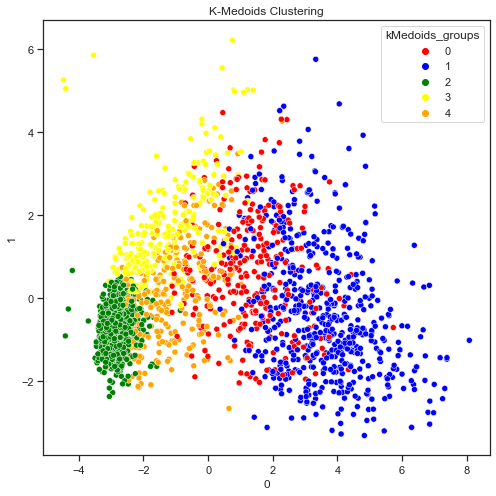

In [136]:
# Add cluster labels to your DataFrame
df_pca_km['kMedoids_groups'] = kmedoids.labels_
model_data['kMedoids_groups'] = kmedoids.labels_
df['kMedoids_groups'] = kmedoids.labels_
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green', 3: 'yellow', 4: 'orange'}

# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_km[0], y=df_pca_km[1], data=df_pca_km, hue=df_pca_km['kMedoids_groups'], palette=color_mapping)
plt.title("K-Medoids Clustering")
plt.show()

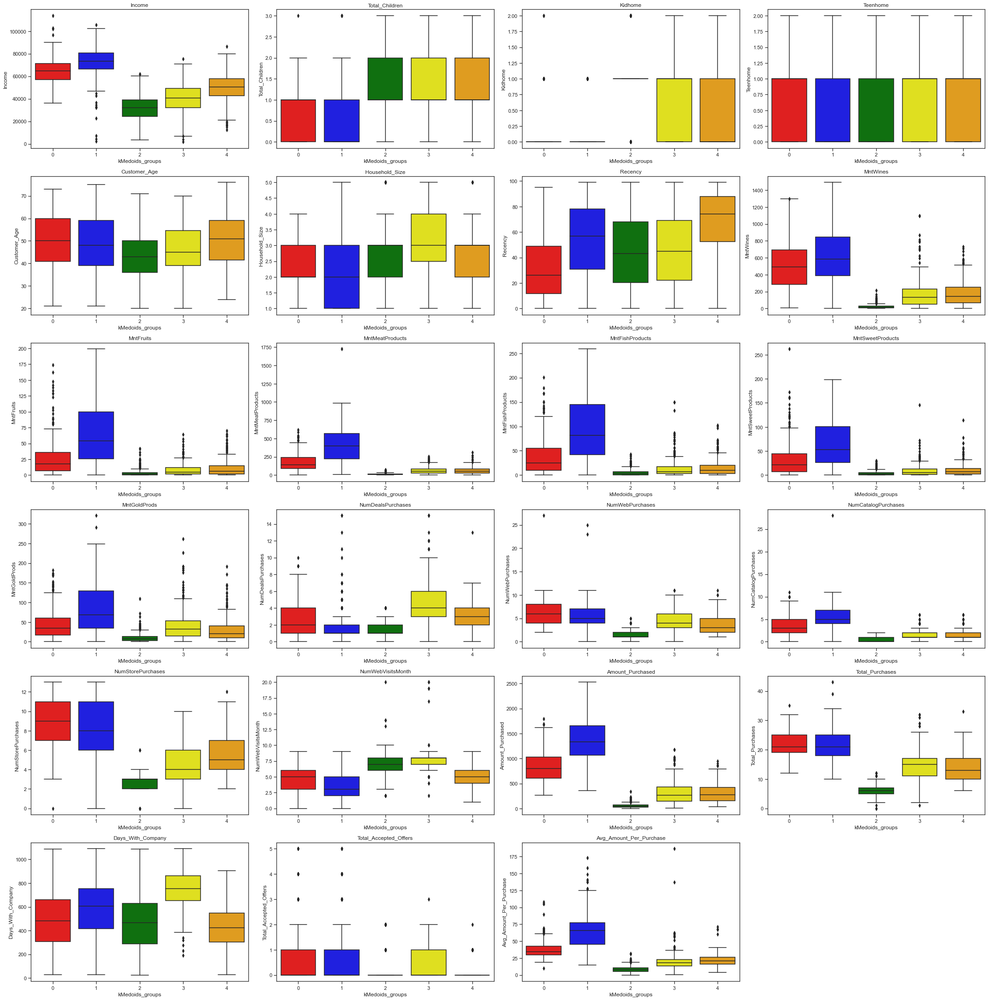

In [137]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
# print(all_col)
plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)
    
    sns.boxplot(y=df[variable], x=df['kMedoids_groups'], palette=color_mapping)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

In [138]:
df['kMedoids_groups'].value_counts()

2    682
1    625
0    308
3    299
4    291
Name: kMedoids_groups, dtype: int64

In [139]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('kMedoids_groups')[all_col].describe()

Income                                                         \
                 count          mean           std      min      25%      50%   
kMedoids_groups                                                                 
0                308.0  64733.594156  11780.563521  36130.0  56938.5  64717.5   
1                625.0  72854.012800  12093.198118   2447.0  66334.0  73454.0   
2                682.0  32371.956012  10837.663185   3502.0  24508.5  32159.5   
3                299.0  39707.678930  13646.127277   1730.0  32273.0  40780.0   
4                291.0  49500.838488  12465.939129  12571.0  42538.5  50353.0   

                                    Total_Children                           \
                      75%       max          count      mean       std  min   
kMedoids_groups                                                               
0                71382.00  113734.0          308.0  0.788961  0.596631  0.0   
1                80685.00  105471.0          625.0  0.396800  0.568390  0.0   
2                39036.75   61917.0          682.0  1.208211  0.702872  0.0   
3                49298.50   75283.0          299.0  1.428094  0.653345  0.0   
4                57640.50   86580.0          291.0  1.202749  0.672201  0.0   

                                    Kidhome                                \
                 25%  50%  75%  max   count      mean       std  min  25%   
kMedoids_groups                                                             
0                0.0  1.0  1.0  3.0   308.0  0.129870  0.355530  0.0  0.0   
1                0.0  0.0  1.0  3.0   625.0  0.060800  0.239154  0.0  0.0   
2                1.0  1.0  2.0  3.0   682.0  0.806452  0.491412  0.0  1.0   
3                1.0  1.0  2.0  3.0   299.0  0.749164  0.485312  0.0  0.0   
4                1.0  1.0  2.0  3.0   291.0  0.422680  0.547755  0.0  0.0   

                               Teenhome                                     \
                 50%  75%  max    count      mean       std  min  25%  50%   
kMedoids_groups                                                              
0                0.0  0.0  2.0    308.0  0.659091  0.520600  0.0  0.0  1.0   
1                0.0  0.0  1.0    625.0  0.336000  0.508643  0.0  0.0  0.0   
2                1.0  1.0  2.0    682.0  0.401760  0.516850  0.0  0.0  0.0   
3                1.0  1.0  2.0    299.0  0.678930  0.528316  0.0  0.0  1.0   
4                0.0  1.0  2.0    291.0  0.780069  0.524977  0.0  0.0  1.0   

                          Customer_Age                                    \
                 75%  max        count       mean        std   min   25%   
kMedoids_groups                                                            
0                1.0  2.0        308.0  49.824675  11.427228  21.0  41.0   
1                1.0  2.0        625.0  48.547200  12.537563  21.0  39.0   
2                1.0  2.0        682.0  43.554252  10.723771  20.0  36.0   
3                1.0  2.0        299.0  46.438127  10.777432  20.0  39.0   
4                1.0  2.0        291.0  50.065292  11.148181  24.0  41.5   

                                  Household_Size                           \
                  50%   75%   max          count      mean       std  min   
kMedoids_groups                                                             
0                50.0  60.0  73.0          308.0  2.412338  0.796231  1.0   
1                48.0  59.0  75.0          625.0  2.017600  0.770870  1.0   
2                43.0  50.0  71.0          682.0  2.862170  0.850882  1.0   
3                45.0  54.5  70.0          299.0  3.046823  0.846121  1.0   
4                51.0  59.0  76.0          291.0  2.927835  0.782314  1.0   

                                    Recency                                    \
                 25%  50%  75%  max   count       mean        std  min    25%   
kMedoids_groups                                                                 
0                2.0  2

**Observations and Insights:**

- Group 0: There are 308 observations in Group 0. This group has a mean income of $64,733.59 with a range from $36,130.00-$113,734.00. This group has a mean total children of 0.79 with a range from 0.00-3.00. This group has a mean kidhome of 0.13 with a range from 0.00-2.00. This group has a mean teenhome of 0.66 with a range from 0.00-2.00. This group has a mean customer age of 49.82 with a range from 21.00-73.00. This group has a mean household size of 2.41 with a range from 1.00-4.00. This group has a mean recency of 31.94 with a range from 0.00-95.00. This group has a mean mntwines of $521.16 with a range from $6.00-$1,298.00. This group has a mean mntfruits of $26.97 with a range from $0.00-$174.00. This group has a mean mntmeatproducts of $175.87 with a range from $3.00-$617.00. This group has a mean mntfishproducts of $37.20 with a range from $0.00-$201.00. This group has a mean mntsweetproducts of $32.05 with a range from $0.00-$262.00. This group has a mean mntgoldprods of $46.11 with a range from $0.00-$182.00. This group has a mean numdealspurchases of 2.61 with a range from 0.00-10.00. This group has a mean numwebpurchases of 6.14 with a range from 2.00-27.00. This group has a mean numcatalogpurchases of 3.78 with a range from 0.00-11.00. This group has a mean numstorepurchases of 9.16 with a range from 0.00-13.00. This group has a mean numwebvisitsmonth of 4.64 with a range from 0.00-9.00. This group has a mean amount purchased of $839.37 with a range from $265.00-$1,789.00. This group has a mean total purchases of 21.70 with a range from 12.00-35.00. This group has a mean days with the company of 481.43 with a range from 27.00-1087.00. This group has a mean total accepted offers of 0.82 with a range from 0.00-5.00. This group has a mean avg amount per purchase of $39.20 with a range from $10.26-$108.07.

- Group 0 Insights: **Moderate-Income, Fewer Children, Older, Varied Spending, Highly Engaged in Campaigns**
    - Demographics: Tends to have fewer children and teens at home with a relatively older customer age.
    - Income and Spending: Moderate income levels with varied spending across different product categories, also having a decent amount of total purchases.
    - Engagement: Engages in purchasing through various channels, including web, catalog, and store, with a fairly average web visit per month.
    - Conclusions: This group seems to be diverse in their spending and interaction with various purchasing channels. A generalized marketing strategy might work well with this group, ensuring that communications span across web, catalog, and in-store promotions. **Diverse marketing strategies and offers across all channels with a potential focus on products that fall within their spending range.**

- Group 1: There are 625 observations in Group 1. This group has a mean income of $72,854.01 with a range from $2,447.00-$105,471.00. This group has a mean total children of 0.40 with a range from 0.00-3.00. This group has a mean kidhome of 0.06 with a range from 0.00-1.00. This group has a mean teenhome of 0.34 with a range from 0.00-2.00. This group has a mean customer age of 48.55 with a range from 21.00-75.00. This group has a mean household size of 2.02 with a range from 1.00-5.00. This group has a mean recency of 54.48 with a range from 0.00-99.00. This group has a mean mntwines of $634.24 with a range from $1.00-$1,493.00. This group has a mean mntfruits of $66.90 with a range from $0.00-$199.00. This group has a mean mntmeatproducts of $422.99 with a range from $12.00-$1,725.00. This group has a mean mntfishproducts of $95.30 with a range from $0.00-$259.00. This group has a mean mntsweetproducts of $66.60 with a range from $0.00-$198.00. This group has a mean mntgoldprods of $86.48 with a range from $0.00-$321.00. This group has a mean numdealspurchases of 1.75 with a range from 0.00-15.00. This group has a mean numwebpurchases of 5.75 with a range from 0.00-25.00. This group has a mean numcatalogpurchases of 5.71 with a range from 0.00-28.00. This group has a mean numstorepurchases of 8.24 with a range from 0.00-13.00. This group has a mean numwebvisitsmonth of 3.51 with a range from 0.00-9.00. This group has a mean amount purchased of $1,372.51 with a range from $359.00-$2,525.00. This group has a mean total purchases of 21.45 with a range from 10.00-43.00. This group has a mean days with the company of 586.21 with a range from 27.00-1089.00. This group has a mean total accepted offers of 0.79 with a range from 0.00-5.00. This group has a mean avg amount per purchase of $67.01 with a range from $14.36-$173.23.  

- Group 1 Insights: **High-Income, Smaller Families, High Spending, Highly Engaged in Campaigns**
    - Demographics: Smaller families, likely with more disposable income due to fewer children and teens at home.
    - Income and Spending: High income and the highest spending across various categories.
    - Engagement: Engages through all channels but has a notable presence in web and catalog purchases.
    - Conclusions: This group has the financial capacity and willingness to spend on varied products. Strategies could focus on premium and exclusive products, with marketing primarily through online and catalog channels. Loyalty programs or exclusive offers for high-value customers might be especially effective. **Focus on online and catalog channels, offering exclusive and premium products, possibly through a loyalty program.**

- Group 2: There are 682 observations in Group 2. This group has a mean income of $32,371.96 with a range from $3,502.00-$61,917.00. This group has a mean total children of 1.21 with a range from 0.00-3.00. This group has a mean kidhome of 0.81 with a range from 0.00-2.00. This group has a mean teenhome of 0.40 with a range from 0.00-2.00. This group has a mean customer age of 43.55 with a range from 20.00-71.00. This group has a mean household size of 2.86 with a range from 1.00-5.00. This group has a mean recency of 44.77 with a range from 0.00-99.00. This group has a mean mntwines of $21.04 with a range from $0.00-$216.00. This group has a mean mntfruits of $3.34 with a range from $0.00-$42.00. This group has a mean mntmeatproducts of $13.28 with a range from $0.00-$74.00. This group has a mean mntfishproducts of $4.97 with a range from $0.00-$43.00. This group has a mean mntsweetproducts of $3.43 with a range from $0.00-$30.00. This group has a mean mntgoldprods of $10.24 with a range from $0.00-$110.00. This group has a mean numdealspurchases of 1.53 with a range from 0.00-4.00. This group has a mean numwebpurchases of 1.60 with a range from 0.00-5.00. This group has a mean numcatalogpurchases of 0.29 with a range from 0.00-2.00. This group has a mean numstorepurchases of 2.85 with a range from 0.00-6.00. This group has a mean numwebvisitsmonth of 6.51 with a range from 2.00-20.00. This group has a mean amount purchased of $56.31 with a range from $5.00-$343.00. This group has a mean total purchases of 6.27 with a range from 0.00-12.00. This group has a mean days with company of 469.83 with a range from 26.00-1086.00. This group has a mean total accepted offers of 0.17 with a range from 0.00-2.00. This group has a mean avg amount per purchase of $8.46 with a range from $0.00-$32.00.


- Group 2 Insights: **Low-Income, Larger Young Families, Lowest Spending, Low Engagment**
    - Demographics: Larger families with both children and teens, and relatively younger customers.
    - Income and Spending: Significantly lower income and the lowest spending across all categories.
    - Engagement: Predominantly engages through web purchases with relatively high web visits per month.
    - Conclusions: This group is likely budget-conscious and possibly looking for deals and value purchases. Strategies should focus on offering value deals, discounts, and possibly bundle offers to maximize their spending. Communications and promotions through web channels might be the most effective. **Focus on web channels, offering value deals, discounts, and bundle offers.**

- Group 3: There are 299 observations in Group 3. This group has a mean income of $39,707.68 with a range from $1,730.00-$75,283.00. This group has a mean total children of 1.43 with a range from 0.00-3.00. This group has a mean kidhome of 0.75 with a range from 0.00-2.00. This group has a mean teenhome of 0.68 with a range from 0.00-2.00. This group has a mean customer age of 46.44 with a range from 20.00-70.00. This group has a mean household size of 3.05 with a range from 1.00-5.00. This group has a mean recency of 45.92 with a range from 0.00-99.00. This group has a mean mntwines of $172.91 with a range from $1.00-$1,099.00. This group has a mean mntfruits of $8.49 with a range from $0.00-$64.00. This group has a mean mntmeatproducts of $62.87 with a range from $1.00-$253.00. This group has a mean mntfishproducts of $14.50 with a range from $0.00-$150.00. This group has a mean mntsweetproducts of $9.37 with a range from $0.00-$146.00. This group has a mean mntgoldprods of $43.58 with a range from $0.00-$262.00. This group has a mean numdealspurchases of 4.53 with a range from 0.00-15.00. This group has a mean numwebpurchases of 4.46 with a range from 0.00-11.00. This group has a mean numcatalogpurchases of 1.39 with a range from 0.00-6.00. This group has a mean numstorepurchases of 4.54 with a range from 0.00-10.00. This group has a mean numwebvisitsmonth of 7.69 with a range from 2.00-20.00. This group has a mean amount purchased of $311.72 with a range from $8.00-$1,178.00. This group has a mean total purchases of 14.91 with a range from 1.00-32.00. This group has a mean days with company of 754.98 with a range from 192.00-1089.00. This group has a mean total accepted offers of 0.33 with a range from 0.00-3.00. This group has a mean avg amount per purchase of $20.16 with a range from $0.53-$186.50.

- Group 3 Insights: **Lower-Middle Income, Larger Families, Moderate Spending, Deal Seeker**
    - Demographics: Larger families with the presence of children and teens, with a moderate customer age.
    - Income and Spending: Lower-middle income with moderate spending, especially on wines.
    - Engagement: Engages significantly through web purchases and has high web visits per month.
    - Conclusions: With a tight budget but willingness to spend on certain categories like wines, strategies for this group could involve offering value-for-money deals, possibly through bundle offers or quantity discounts. Given their engagement through web channels, online marketing and offers might be most effective. **Focus on online channels, offering value-for-money deals and discounts, particularly in the wine category.**

- Group 4: There are 291 observations in Group 4. This group has a mean income of $49,500.84 with a range from $12,571.00-$86,580.00. This group has a mean total children of 1.20 with a range from 0.00-3.00. This group has a mean kidhome of 0.42 with a range from 0.00-2.00. This group has a mean teenhome of 0.78 with a range from 0.00-2.00. This group has a mean customer age of 50.07 with a range from 24.00-76.00. This group has a mean household size of 2.93 with a range from 1.00-5.00. This group has a mean recency of 68.42 with a range from 0.00-99.00. This group has a mean mntwines of $179.12 with a range from $3.00-$734.00. This group has a mean mntfruits of $11.27 with a range from $0.00-$70.00. This group has a mean mntmeatproducts of $62.26 with a range from $2.00-$309.00. This group has a mean mntfishproducts of $15.47 with a range from $0.00-$102.00. This group has a mean mntsweetproducts of $10.93 with a range from $0.00-$114.00. This group has a mean mntgoldprods of $30.52 with a range from $0.00-$191.00. This group has a mean numdealspurchases of 2.79 with a range from 0.00-13.00. This group has a mean numwebpurchases of 3.89 with a range from 1.00-11.00. This group has a mean numcatalogpurchases of 1.69 with a range from 0.00-6.00. This group has a mean numstorepurchases of 5.38 with a range from 2.00-12.00. This group has a mean numwebvisitsmonth of 4.82 with a range from 1.00-9.00. This group has a mean amount purchased of $309.59 with a range from $38.00-$948.00. This group has a mean total purchases of 13.75 with a range from 6.00-33.00. This group has a mean days with company of 431.62 with a range from 29.00-903.00. This group has a mean total accepted offers of 0.11 with a range from 0.00-2.00. This group has a mean avg amount per purchase of $20.98 with a range from $3.80-$71.10.

- Group 4 Insights: **Middle-Income, Mixed Family Size, Oldest, Conservative Spending, Least Engaged**
    - Demographics: Mixed family sizes and relatively older customer age.
    - Income and Spending: Middle income but conservative in spending, with a moderate amount in various categories.
    - Engagement: Engages through web, catalog, and store purchases, with an average number of web visits.
    - Conclusions: With a conservative spending pattern but a decent income, this group might be enticed to spend more through targeted offers and promotions. A balanced marketing strategy across web, catalog, and store channels with special offers, possibly during festive or sale seasons, might be effective. **Balanced marketing across all channels, with special offers or seasonal promotions to entice increased spending.**

### **Characteristics of each cluster**

**Summary for each cluster:**
- 3 Clusters: 
    - Group 0: High-Income, Low-Family-Size, Heavy Spenders, Highly Engaged in Campaigns
    - Group 1: Low-Income, Larger-Family-Size, Conservative Spenders
    - Group 2: Mid-Income, Teen-Oriented Families, Moderate Spending, Deal Seekers

- 5 Clusters:
    - Group 0: Moderate-Income, Fewer Children, Older, Varied Spending, Highly Engaged in Campaigns
    - Group 1: High-Income, Smaller Families, High Spending, Highly Engaged in Campaigns
    - Group 2: Low-Income, Larger Young Families, Lowest Spending, Low Engagment
    - Group 3: Lower-Middle Income, Larger Families, Moderate Spending, Deal Seeker
    - Group 4: Middle-Income, Mixed Family Size, Oldest, Conservative Spending, Least Engaged

**Observations and Insights:** 
- As we saw in kmeans 3-5 clusters seems to be a good fit for the data. Since, 5 clusters seems to be a good amount of detail in the segmentation of the customers 5 clusters is t he best fit for kmedoids.

## **Hierarchical Clustering**

- Find the Cophenetic correlation for different distances with different linkage methods.
- Create the dendrograms for different linkages 
- Explore different linkages with each distance metric

In [140]:
df_pca_h = df_pca.copy()

Cophenetic correlation for ward linkage with euclidean distance: 0.509412048964086


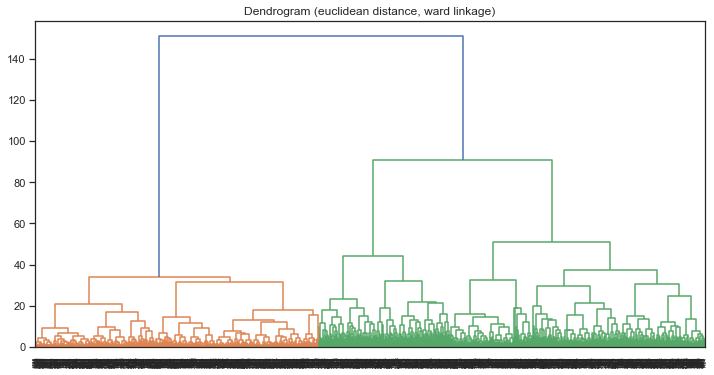

Cophenetic correlation for ward linkage with mahalanobis distance: 0.20937812674639883


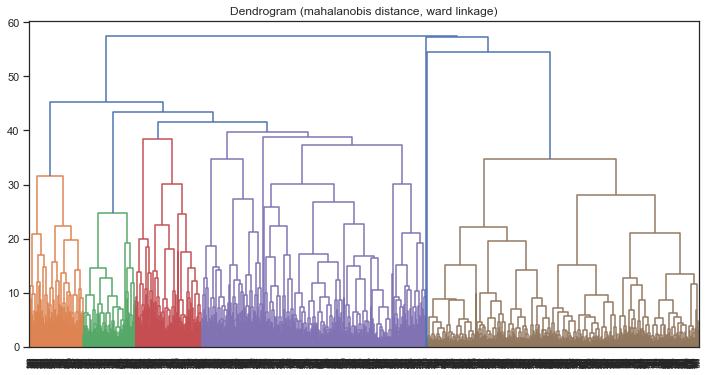

Cophenetic correlation for ward linkage with cosine distance: 0.7848315213462559


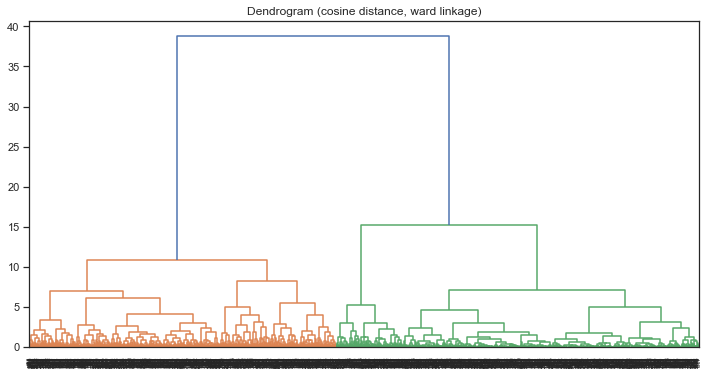

Cophenetic correlation for ward linkage with cityblock distance: 0.4615007644711014


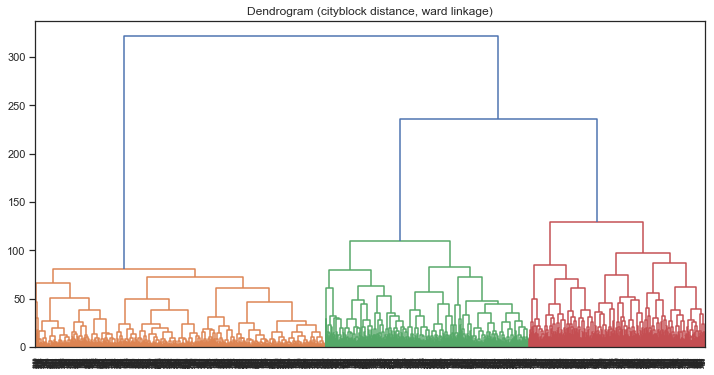

Cophenetic correlation for ward linkage with chebyshev distance: 0.6823188910723113


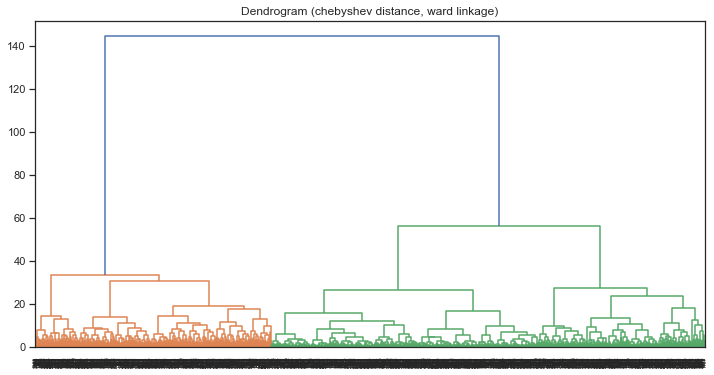

Cophenetic correlation for complete linkage with euclidean distance: 0.7554576259222504


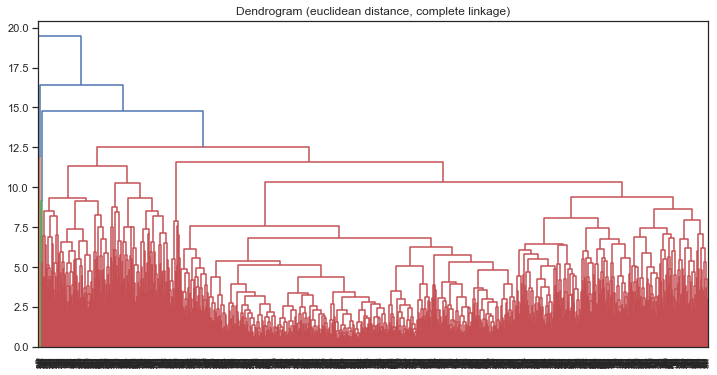

Cophenetic correlation for complete linkage with mahalanobis distance: 0.8073453452309349


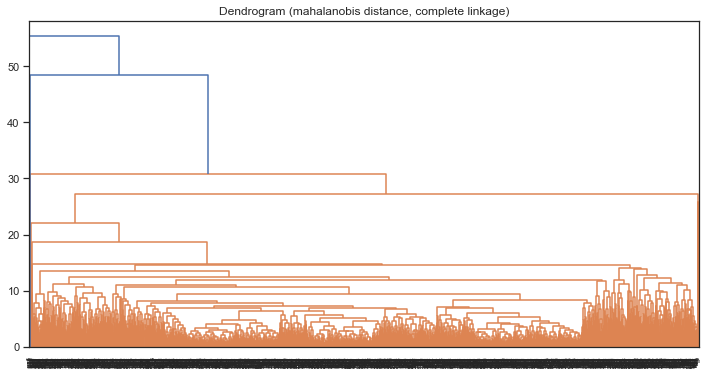

Cophenetic correlation for complete linkage with cosine distance: 0.6431311948919758


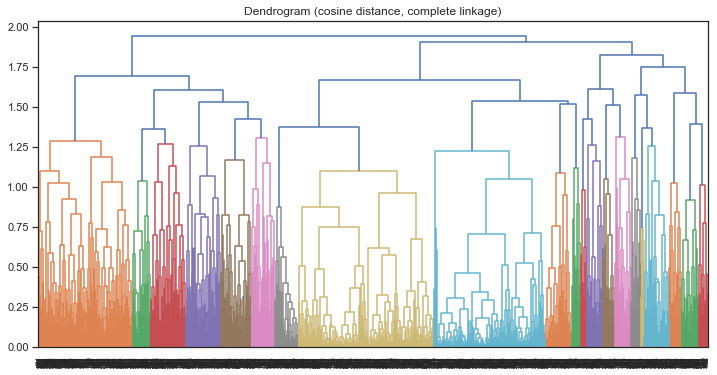

Cophenetic correlation for complete linkage with cityblock distance: 0.7887808513886237


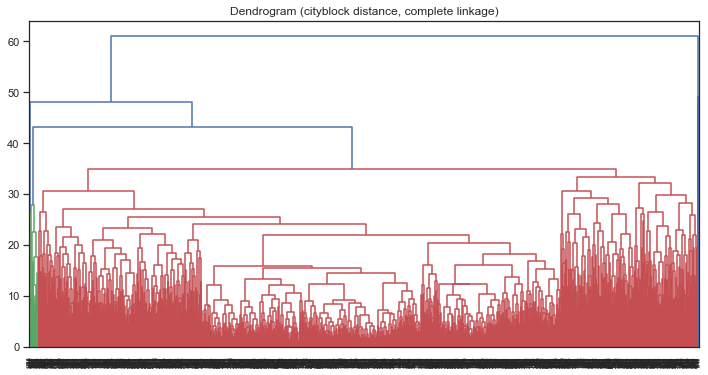

Cophenetic correlation for complete linkage with chebyshev distance: 0.6528923810370849


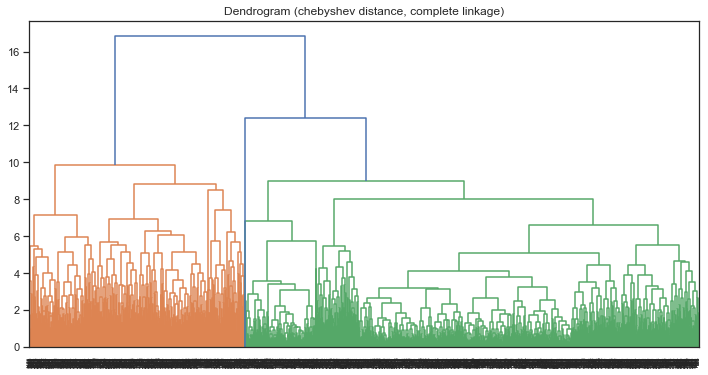

Cophenetic correlation for average linkage with euclidean distance: 0.81495068543288


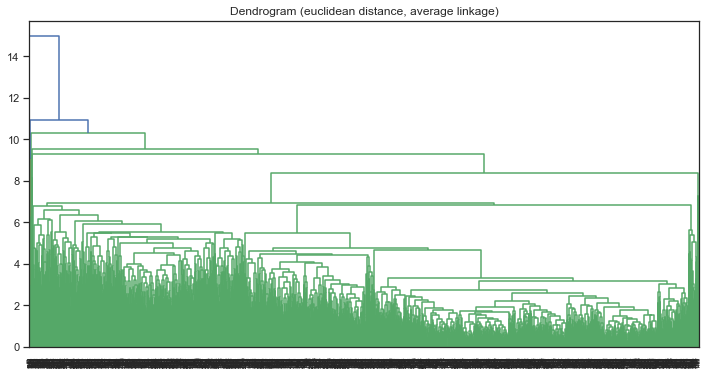

Cophenetic correlation for average linkage with mahalanobis distance: 0.9367934846255843


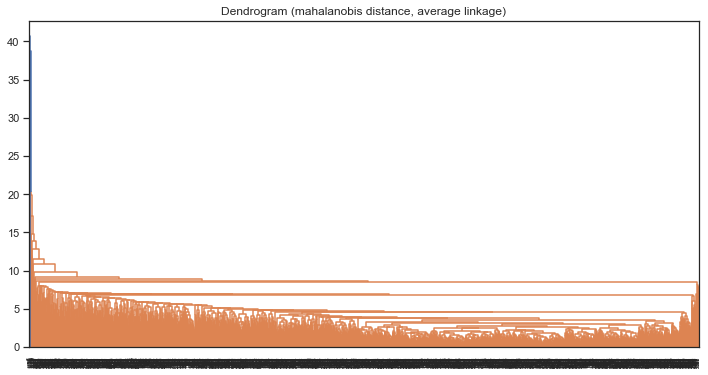

Cophenetic correlation for average linkage with cosine distance: 0.837346484768787


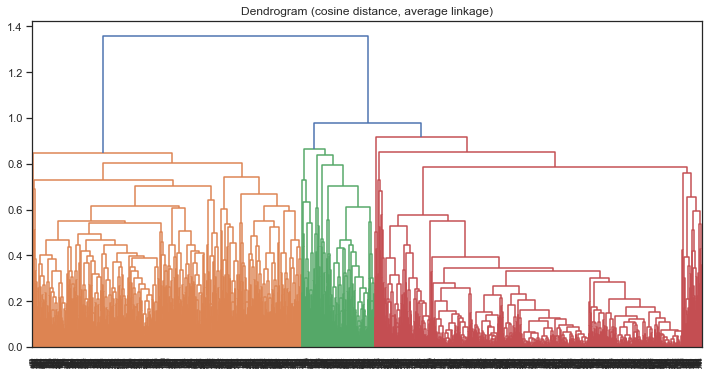

Cophenetic correlation for average linkage with cityblock distance: 0.8670770480537467


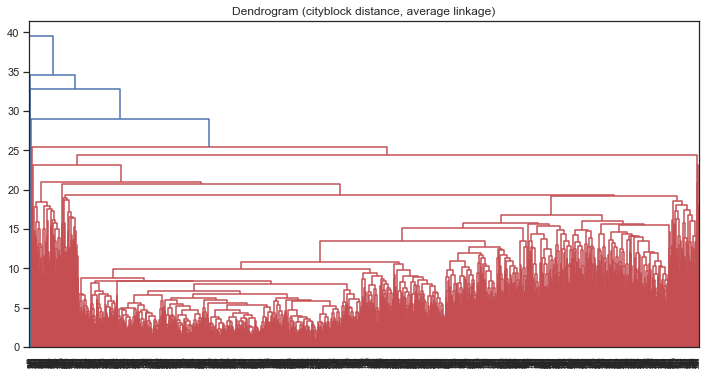

Cophenetic correlation for average linkage with chebyshev distance: 0.7346185454289856


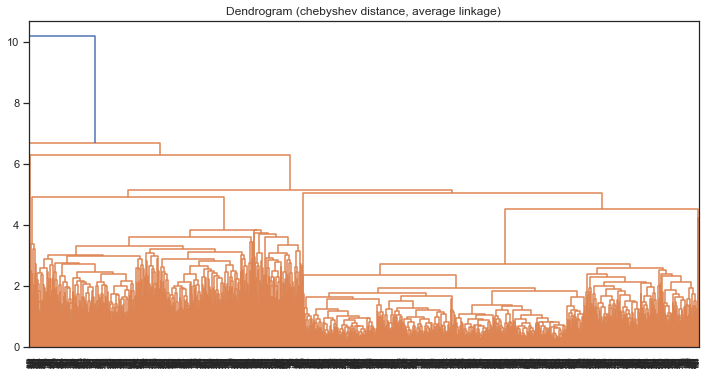

Cophenetic correlation for single linkage with euclidean distance: 0.8011982538604796


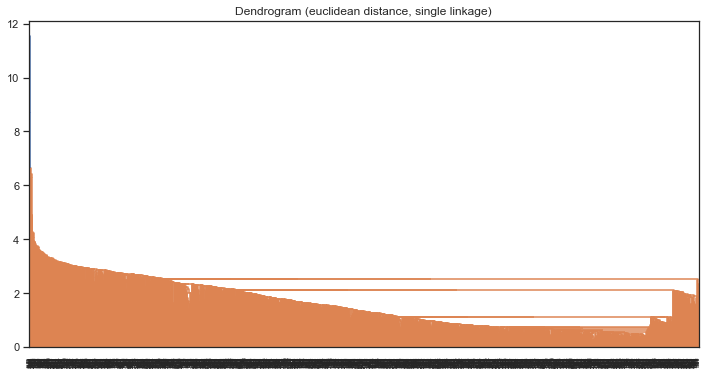

Cophenetic correlation for single linkage with mahalanobis distance: 0.9342340886466003


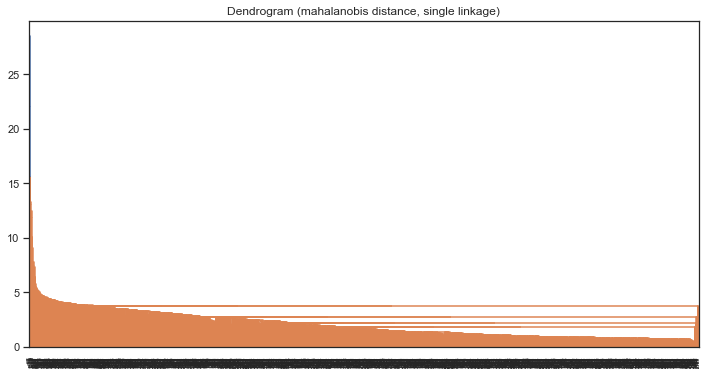

Cophenetic correlation for single linkage with cosine distance: 0.421089540340905


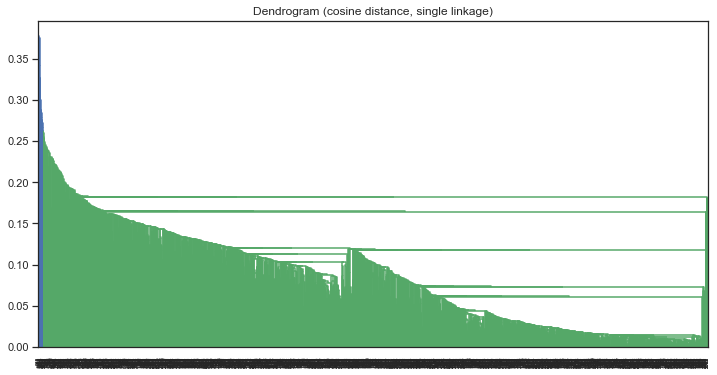

Cophenetic correlation for single linkage with cityblock distance: 0.871822689504098


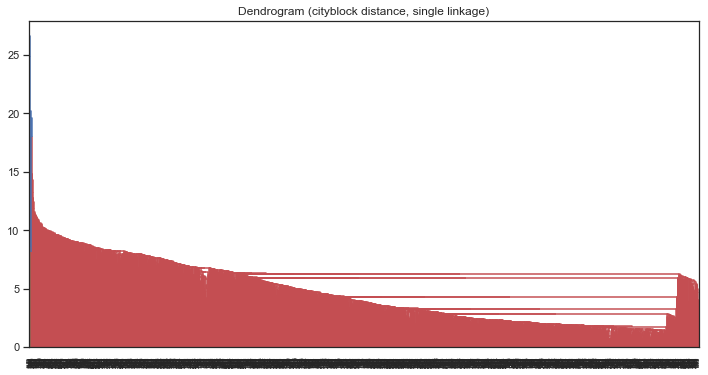

Cophenetic correlation for single linkage with chebyshev distance: 0.6209612708805875


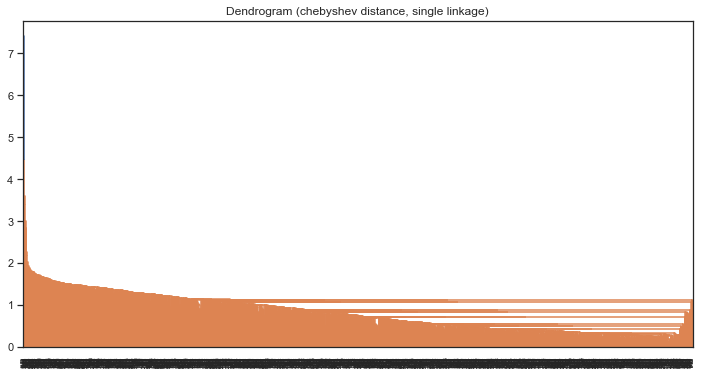

In [141]:
# Define distance metrics
linkage_methods = ['ward', 'complete', 'average', 'single']
distance_metrics = ['euclidean', 'mahalanobis', 'cosine', 'cityblock', 'chebyshev']

for linkage_method in linkage_methods:
    for metric in distance_metrics:
        # Compute pairwise distances with the current metric
        distances = pdist(df_pca_h, metric=metric)

        Z = linkage(distances, linkage_method)
        c, _ = cophenet(Z, distances)
        print(f"Cophenetic correlation for {linkage_method} linkage with {metric} distance: {c}")

        # Create dendrogram for the current combination of metric and linkage method
        plt.figure(figsize=(12, 6))
        plt.title(f'Dendrogram ({metric} distance, {linkage_method} linkage)')
        dendrogram(Z)
        plt.show()

**Observations:**
- Many of these dendrograms do not seem to be good fit for our data, some of them do seem to have good seperations.


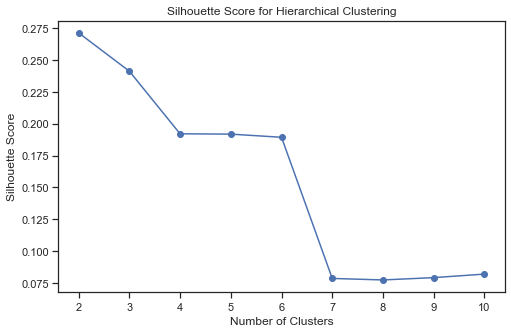

In [142]:
# Calculate the Silhouette score for a range of cluster numbers
silhouette_scores = []
cluster_range = range(2, 11)  # Adjust the range as needed

for n_clusters in cluster_range:
    clustering = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = clustering.fit_predict(df_pca_h)
    silhouette_avg = silhouette_score(df_pca_h, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for Hierarchical Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

**Think about it:**

- Can we clearly decide the number of clusters based on where to cut the dendrogram horizontally?
- What is the next step in obtaining number of clusters based on the dendrogram?
- Are there any distinct clusters in any of the dendrograms?

In [143]:
df_pca_h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205 entries, 0 to 2204
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       2205 non-null   float64
 1   1       2205 non-null   float64
 2   2       2205 non-null   float64
 3   3       2205 non-null   float64
 4   4       2205 non-null   float64
 5   5       2205 non-null   float64
 6   6       2205 non-null   float64
 7   7       2205 non-null   float64
 8   8       2205 non-null   float64
 9   9       2205 non-null   float64
 10  10      2205 non-null   float64
 11  11      2205 non-null   float64
 12  12      2205 non-null   float64
 13  13      2205 non-null   float64
 14  14      2205 non-null   float64
 15  15      2205 non-null   float64
 16  16      2205 non-null   float64
dtypes: float64(17)
memory usage: 293.0 KB


In [144]:
df_pca_h = df_pca.copy()

In [145]:
# Initialize Agglomerative Clustering with the specified parameters
HCmodel = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')

# Fit the model on your data (assuming you have a dataset named data_pca)
HCmodel.fit(df_pca_h)

AgglomerativeClustering(affinity='euclidean', n_clusters=5)

### **Visualize the clusters using PCA**

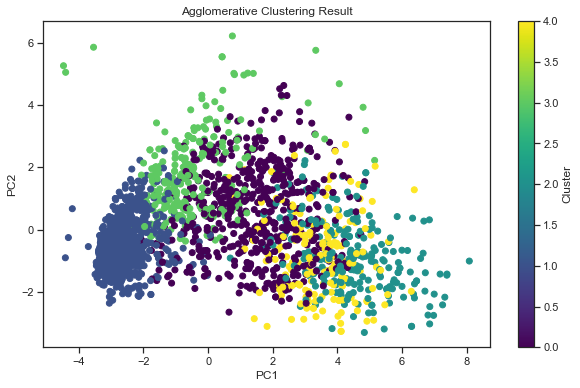

In [146]:
# Add cluster labels to your DataFrame
df_pca_h['HC_groups'] = HCmodel.labels_
model_data['HC_groups'] = HCmodel.labels_
df['HC_groups'] = HCmodel.labels_

plt.figure(figsize=(10, 6))
plt.scatter(df_pca_h[0], df_pca_h[1], c=df_pca_h['HC_groups'], cmap='viridis')
plt.title('Agglomerative Clustering Result')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar(label='Cluster')
plt.show()

### **Cluster Profiling**

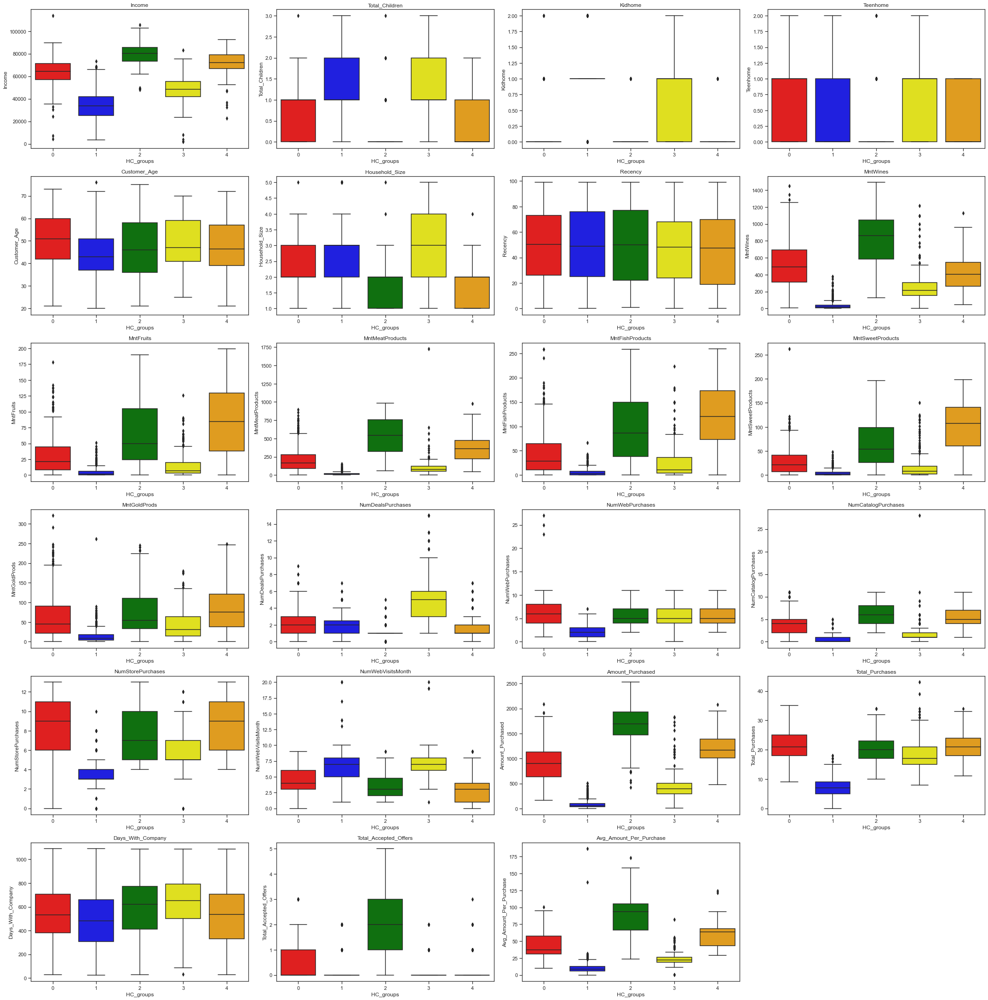

In [147]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]

plt.figure(figsize=(30, 50))

# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green', 3: 'yellow', 4: 'orange'}

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['HC_groups'], palette=color_mapping)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [148]:
df['HC_groups'].value_counts()

1    935
0    566
3    274
2    242
4    188
Name: HC_groups, dtype: int64

In [149]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('HC_groups')[all_col].describe()

Income                                                          \
           count          mean           std      min       25%      50%   
HC_groups                                                                  
0          566.0  63882.393993  11520.600703   4428.0  56831.25  64258.0   
1          935.0  33895.811765  12184.834120   3502.0  25200.00  33629.0   
2          242.0  79768.512397   9821.818919  48192.0  73454.25  80272.0   
3          274.0  47983.989051  11440.274037   1730.0  42015.75  48432.0   
4          188.0  71942.058511  10622.487781  22507.0  66664.00  72144.5   

                              Total_Children                                \
                75%       max          count      mean       std  min  25%   
HC_groups                                                                    
0          71299.50  113734.0          566.0  0.766784  0.566335  0.0  0.0   
1          41998.50   73395.0          935.0  1.255615  0.690954  0.0  1.0   
2          85803.75  105471.0          242.0  0.190083  0.470085  0.0  0.0   
3          55427.25   83273.0          274.0  1.357664  0.748500  0.0  1.0   
4          79209.75   92556.0          188.0  0.351064  0.489624  0.0  0.0   

                         Kidhome                                               \
           50%  75%  max   count      mean       std  min  25%  50%  75%  max   
HC_groups                                                                       
0          1.0  1.0  3.0   566.0  0.097173  0.313855  0.0  0.0  0.0  0.0  2.0   
1          1.0  2.0  3.0   935.0  0.792513  0.489447  0.0  1.0  1.0  1.0  2.0   
2          0.0  0.0  3.0   242.0  0.041322  0.199447  0.0  0.0  0.0  0.0  1.0   
3          1.0  2.0  3.0   274.0  0.587591  0.549385  0.0  0.0  1.0  1.0  2.0   
4          0.0  1.0  2.0   188.0  0.042553  0.202386  0.0  0.0  0.0  0.0  1.0   

          Teenhome                                              Customer_Age  \
             count      mean       std  min  25%  50%  75%  max        count   
HC_groups                                                                      
0            566.0  0.669611  0.540759  0.0  0.0  1.0  1.0  2.0        566.0   
1            935.0  0.463102  0.528094  0.0  0.0  0.0  1.0  2.0        935.0   
2            242.0  0.148760  0.400439  0.0  0.0  0.0  0.0  2.0        242.0   
3            274.0  0.770073  0.522444  0.0  0.0  1.0  1.0  2.0        274.0   
4            188.0  0.308511  0.463112  0.0  0.0  0.0  1.0  1.0        188.0   

                                                              Household_Size  \
                mean        std   min   25%   50%   75%   max          count   
HC_groups                                                                      
0          50.454064  11.431234  21.0  42.0  51.0  60.0  73.0          566.0   
1          44.488770  10.880981  20.0  37.0  43.0  51.0  76.0          935.0   
2          46.896694  13.553095  21.0  36.0  46.0  58.0  75.0          242.0   
3          49.051095  10.999048  25.0  41.0  47.0  59.0  70.0          274.0   
4          47.356383  11.901809  21.0  39.0  46.5  57.0  72.0          188.0   

                                                       Recency             \
               mean       std  min  25%  50%  75%  max   count       mean   
HC_groups                                                                   
0          2.438163  0.763476  1.0  2.0  2.0  3.0  5.0   566.0  49.621908   
1          2.898396  0.840202  1.0  2.0  3.0  3.0  5.0   935.0  49.763636   
2          1.772727  0.701214  1.0  1.0  2.0  2.0  5.0   242.0  49.041322   
3          3.021898  0.905556  1.0  2.0  3.0  4.0  5.0   274.0  46.562044   
4          1.978723  0.708674  1.0  1.0  2.0  2.0  4.0   188.0  46.936170   

                                                   MntWines              \
                 std  min    25%   50%   75%   max    count        mean   
HC_groups                                                                 
0  

### **Characteristics of each cluster**

**Observations and Insights:**

- Group 0: with a total of 566 observations, the average Income is 63882.39, ranging from 4428.0 to 113734.0. The average Total_Children is 0.77, ranging from 0.0 to 3.0. The average Kidhome is 0.10, ranging from 0.0 to 2.0. The average Teenhome is 0.67, ranging from 0.0 to 2.0. The average Customer_Age is 50.45, ranging from 21.0 to 73.0. The average Household_Size is 2.44, ranging from 1.0 to 5.0. The average Recency is 49.62, ranging from 0.0 to 99.0. The average MntWines is 515.00, ranging from 6.0 to 1449.0. The average MntFruits is 30.29, ranging from 0.0 to 178.0. The average MntMeatProducts is 213.43, ranging from 3.0 to 899.0. The average MntFishProducts is 43.17, ranging from 0.0 to 258.0. The average MntSweetProducts is 27.92, ranging from 0.0 to 262.0. The average MntGoldProds is 65.91, ranging from 0.0 to 321.0. The average NumDealsPurchases is 2.40, ranging from 0.0 to 9.0. The average NumWebPurchases is 5.99, ranging from 1.0 to 27.0. The average NumCatalogPurchases is 4.07, ranging from 0.0 to 11.0. The average NumStorePurchases is 8.57, ranging from 0.0 to 13.0. The average NumWebVisitsMonth is 4.47, ranging from 0.0 to 9.0. The average Amount_Purchased is 895.70, ranging from 162.0 to 2089.0. The average Total_Purchases is 21.03, ranging from 9.0 to 35.0. The average Days_With_Company is 539.91, ranging from 27.0 to 1089.0. The average Total_Accepted_Offers is 0.37, ranging from 0.0 to 3.0. The average Avg_Amount_Per_Purchase is 42.75, ranging from 10.26 to 100.53

- Group 0 Insights: **Moderate Income, Oldest, Small Family Size, Varied Spending, Moderatly Engaged**
    - Demographics: Smaller family sizes and an older customer demographic.
    - Income and Spending: Moderate income levels with a varied spending pattern, showing particular interest in wines.
    - Engagement: Active engagement across web, catalog, and store purchases, with a moderate number of web visits.
    - Conclusions: Given their moderate income and a notable interest in wines, curated offers on wines, possibly through a subscription model or exclusive members-only events, might be attractive to this group. Their active engagement across all channels indicates that a multichannel marketing approach would be beneficial. **Multichannel marketing with a focus on exclusive wine offerings or subscription models.**

- Group 1: with a total of 935 observations, the average Income is 33895.81, ranging from 3502.0 to 73395.0. The average Total_Children is 1.26, ranging from 0.0 to 3.0. The average Kidhome is 0.79, ranging from 0.0 to 2.0. The average Teenhome is 0.46, ranging from 0.0 to 2.0. The average Customer_Age is 44.49, ranging from 20.0 to 76.0. The average Household_Size is 2.90, ranging from 1.0 to 5.0. The average Recency is 49.76, ranging from 0.0 to 99.0. The average MntWines is 35.37, ranging from 0.0 to 378.0. The average MntFruits is 4.30, ranging from 0.0 to 51.0. The average MntMeatProducts is 19.16, ranging from 0.0 to 153.0. The average MntFishProducts is 5.99, ranging from 0.0 to 67.0. The average MntSweetProducts is 4.44, ranging from 0.0 to 48.0. The average MntGoldProds is 13.73, ranging from 0.0 to 262.0. The average NumDealsPurchases is 1.90, ranging from 0.0 to 7.0. The average NumWebPurchases is 1.92, ranging from 0.0 to 7.0. The average NumCatalogPurchases is 0.49, ranging from 0.0 to 5.0. The average NumStorePurchases is 3.12, ranging from 0.0 to 10.0. The average NumWebVisitsMonth is 6.39, ranging from 1.0 to 20.0. The average Amount_Purchased is 82.99, ranging from 5.0 to 507.0. The average Total_Purchases is 7.44, ranging from 0.0 to 18.0. The average Days_With_Company is 493.38, ranging from 26.0 to 1089.0. The average Total_Accepted_Offers is 0.18, ranging from 0.0 to 2.0. The average Avg_Amount_Per_Purchase is 10.23, ranging from 0.0 to 186.5.  

- Group 1 Insights: **Low-Income, Youngest, Larger Family Size, Minimal Spending**
    - Demographics: Predominantly larger families and middle-aged customers.
    - Income and Spending: Lower income and very conservative in spending, with minimal amounts in various categories.
    - Engagement: Limited engagement through web and store purchases, with frequent web visits.
    - Conclusions: With a tight budget, this group spends cautiously across various categories. Given their frequent web visits, targeted online advertising and exclusive web offers may encourage more spending. **Enhanced online engagement with web-exclusive offers to cater to their budget-conscious spending.**

- Group 2: with a total of 242 observations, the average Income is 79768.51, ranging from 48192.0 to 105471.0. The average Total_Children is 0.19, ranging from 0.0 to 3.0. The average Kidhome is 0.04, ranging from 0.0 to 1.0. The average Teenhome is 0.15, ranging from 0.0 to 2.0. The average Customer_Age is 46.90, ranging from 21.0 to 75.0. The average Household_Size is 1.77, ranging from 1.0 to 5.0. The average Recency is 49.04, ranging from 1.0 to 99.0. The average MntWines is 839.32, ranging from 125.0 to 1493.0. The average MntFruits is 95.44, ranging from 1.0 to 199.0. The average MntMeatProducts is 357.26, ranging from 26.0 to 981.0. The average MntFishProducts is 126.33, ranging from 0.0 to 259.0. The average MntSweetProducts is 94.55, ranging from 0.0 to 199.0. The average MntGoldProds is 73.21, ranging from 1.0 to 249.0. The average NumDealsPurchases is 1.33, ranging from 0.0 to 7.0. The average NumWebPurchases is 4.95, ranging from 1.0 to 11.0. The average NumCatalogPurchases is 5.92, ranging from 1.0 to 12.0. The average NumStorePurchases is 5.78, ranging from 0.0 to 12.0. The average NumWebVisitsMonth is 6.90, ranging from 1.0 to 20.0. The average Amount_Purchased is 452.22, ranging from 8.0 to 1826.0. The average Total_Purchases is 18.38, ranging from 8.0 to 43.0. The average Days_With_Company is 644.18, ranging from 31.0 to 1087.0. The average Total_Accepted_Offers is 0.21, ranging from 0.0 to 2.0. The average Avg_Amount_Per_Purchase is 23.60, ranging from 0.53 to 82.21.


- Group 2 Insights: **High-Income, Minimual Child Obligations, Liberal Spending, Highly Engaged**
    - Demographics: Smaller family sizes and middle-aged to slightly older customers.
    - Income and Spending: High-income bracket with liberal spending, particularly on wines.
    - Engagement: Regularly engages in web, catalog, and store purchases, albeit with slightly high web visits.
    - Conclusions: With a comfortable income and a penchant for wines, this group might appreciate exclusive offers on premium wines and related products. Given their balanced shopping habits across various channels, a multichannel marketing approach with a focus on premium products could be effective. **Multichannel marketing focusing on premium products and exclusive wine offers.**

- Group 3:  with a total of 274 observations, the average Income is 47983.99, ranging from 1730.0 to 83273.0. The average Total_Children is 1.50, ranging from 0.0 to 3.0. The average Kidhome is 0.94, ranging from 0.0 to 2.0. The average Teenhome is 0.56, ranging from 0.0 to 2.0. The average Customer_Age is 47.12, ranging from 21.0 to 76.0. The average Household_Size is 3.00, ranging from 1.0 to 5.0. The average Recency is 48.63, ranging from 1.0 to 99.0. The average MntWines is 68.40, ranging from 0.0 to 683.0. The average MntFruits is 17.84, ranging from 0.0 to 92.0. The average MntMeatProducts is 57.23, ranging from 0.0 to 259.0. The average MntFishProducts is 18.01, ranging from 0.0 to 101.0. The average MntSweetProducts is 18.64, ranging from 0.0 to 93.0. The average MntGoldProds is 28.74, ranging from 0.0 to 165.0. The average NumDealsPurchases is 1.87, ranging from 0.0 to 7.0. The average NumWebPurchases is 2.40, ranging from 0.0 to 8.0. The average NumCatalogPurchases is 0.92, ranging from 0.0 to 7.0. The average NumStorePurchases is 3.84, ranging from 0.0 to 12.0. The average NumWebVisitsMonth is 6.57, ranging from 0.0 to 20.0. The average Amount_Purchased is 209.88, ranging from 10.0 to 794.0. The average Total_Purchases is 8.92, ranging from 3.0 to 25.0. The average Days_With_Company is 630.95, ranging from 26.0 to 1088.0. The average Total_Accepted_Offers is 0.15, ranging from 0.0 to 2.0. The average Avg_Amount_Per_Purchase is 23.60, ranging from 0.53 to 82.21.

- Group 3 Insights: **Moderate Income, Large Family Size, Conservative Spending, Deal Seeker**
    - Demographics: Larger families and middle to older-aged customers.
    - Income and Spending: Moderate income and cautious spending, with a noticeable amount in the wine category.
    - Engagement: Limited engagement mainly through store purchases and frequent web visits.
    - Conclusions: This group, while having a modest income, tends to spend cautiously. Their preference for store purchases suggests that in-store promotions or loyalty programs might be effective. Additionally, offers on wines, possibly through partnerships or exclusive labels, might drive increased spending. **In-store promotions or loyalty programs, coupled with exclusive or partnership wine offers, to boost spending.**

- Group 4: with a total of 188 observations, the average Income is 71942.06, ranging from 22507.0 to 92556.0. The average Total_Children is 0.35, ranging from 0.0 to 2.0. The average Kidhome is 0.04, ranging from 0.0 to 1.0. The average Teenhome is 0.31, ranging from 0.0 to 1.0. The average Customer_Age is 47.36, ranging from 21.0 to 72.0. The average Household_Size is 1.98, ranging from 1.0 to 4.0. The average Recency is 46.94, ranging from 0.0 to 99.0. The average MntWines is 421.40, ranging from 47.0 to 1132.0. The average MntFruits is 88.89, ranging from 0.0 to 199.0. The average MntMeatProducts is 366.10, ranging from 44.0 to 981.0. The average MntFishProducts is 122.74, ranging from 0.0 to 259.0. The average MntSweetProducts is 101.79, ranging from 0.0 to 198.0. The average MntGoldProds is 86.99, ranging from 0.0 to 249.0. The average NumDealsPurchases is 1.70, ranging from 0.0 to 7.0. The average NumWebPurchases is 5.45, ranging from 2.0 to 11.0. The average NumCatalogPurchases is 5.36, ranging from 1.0 to 11.0. The average NumStorePurchases is 8.68, ranging from 4.0 to 13.0. The average NumWebVisitsMonth is 3.03, ranging from 0.0 to 9.0. The average Amount_Purchased is 1187.91, ranging from 475.0 to 2074.0. The average Total_Purchases is 21.18, ranging from 11.0 to 34.0. The average Days_With_Company is 528.79, ranging from 27.0 to 1086.0. The average Total_Accepted_Offers is 0.30, ranging from 0.0 to 3.0. The average Avg_Amount_Per_Purchase is 58.00, ranging from 28.81 to 124.55.

- Group 4 Insights: **High Income, Small Family Size, Diversified Spending, Moderatly Engaged**
    - Demographics: Smaller family sizes and middle-aged to older customers.
    - Income and Spending: High income with diversified spending across several categories, particularly in meats and fruits.
    - Engagement: Regularly engages through web, catalog, and store purchases, with a low to average number of web visits
    - Conclusions: This group exhibits a balanced spending pattern across several categories, implying a potential openness to exploring varied products. Given their frequent engagements across all shopping channels, a multichannel approach, especially with offers on meat and fruit products or bundling them with other categories, could be lucrative. **Multichannel marketing approach with offers or bundles focusing on meat and fruit products.**

**Summary for each cluster:**

- 5 Clusters:
    - Group 0: Moderate Income, Oldest, Small Family Size, Varied Spending, Moderatly Engaged
    - Group 1: Low-Income, Youngest, Larger Family Size, Minimal Spending
    - Group 2: High-Income, Minimual Child Obligations, Liberal Spending, Highly Engaged
    - Group 3: Moderate Income, Large Family Size, Conservative Spending, Deal Seeker
    - Group 4: High Income, Small Family Size, Diversified Spending, Moderatly Engaged

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, you have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.

In [150]:
df_pca_dbscan = df_pca.copy()

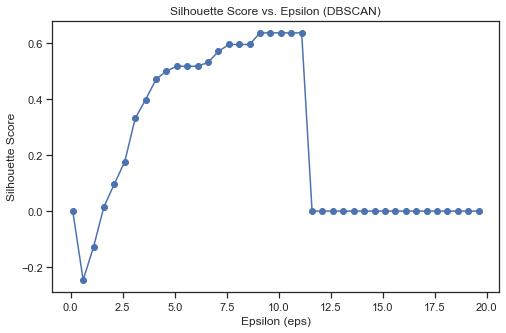

In [151]:
# Initialize a list to store silhouette scores
silhouette_scores = []

# Define a range of epsilon values to iterate through
epsilon_range = np.arange(0.1, 20.0, 0.5)  

for eps in epsilon_range:
    # Create and fit the DBSCAN model
    dbscan = DBSCAN(eps=eps)
    cluster_labels = dbscan.fit_predict(df_pca_dbscan)  # Replace with your data
    
    # Check if at least 2 clusters are formed
    unique_labels = np.unique(cluster_labels)
    if len(unique_labels) > 1:
        silhouette_avg = silhouette_score(df_pca_dbscan, cluster_labels)
        silhouette_scores.append(silhouette_avg)
        # print(f"Silhouette Score for eps={eps}: {silhouette_avg}")
    else:
        silhouette_scores.append(0.0)  # Append 0 if no clusters are formed

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(epsilon_range, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Epsilon (DBSCAN)')
plt.xlabel('Epsilon (eps)')
plt.ylabel('Silhouette Score')
plt.show()

In [152]:
def plot_silhouette_scores(eps_range, min_samples_range, silhouette_scores):
    """
    Plot a heatmap of silhouette scores.
    
    Parameters:
    - eps_range: list of eps values
    - min_samples_range: list of min_samples values
    - silhouette_scores: 2D list of silhouette scores corresponding to hyperparameters
    """
    plt.figure(figsize=(10, 6))
    sns.heatmap(silhouette_scores, annot=True, fmt=".2f", cmap='viridis',
                xticklabels=eps_range, yticklabels=min_samples_range)
    plt.title('Silhouette Scores for different hyperparameters')
    plt.xlabel('Epsilon (eps)')
    plt.ylabel('Minimum Samples (min_samples)')
    plt.show()

In [153]:
best_silhouette_score = -1  # Initialize with a low value
best_eps = None
best_min_samples = None

# Define ranges for hyperparameters
eps_range = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]  
min_samples_range = [1, 2, 5, 10, 15, 20, 30]

# Initialize a 2D list to store silhouette scores
silhouette_scores = []

for min_samples in min_samples_range:
    min_samples_scores = []
    for eps in eps_range:
        # Create and fit the DBSCAN model
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(df_pca_dbscan)  # Replace with your data

        # Ensure at least 2 clusters are formed and noise points are present
        if len(set(cluster_labels)) > 1 and -1 in cluster_labels:
            silhouette_avg = silhouette_score(df_pca_dbscan, cluster_labels)
        else:
            silhouette_avg = -1  # Assign a low score if conditions not met

        # print(f'EPS: {eps}, min_samples: {min_samples} with a silhouette_avg score of {silhouette_avg}')
        min_samples_scores.append(silhouette_avg)

        # Check if this combination has a better silhouette score
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_eps = eps
            best_min_samples = min_samples
    
    silhouette_scores.append(min_samples_scores)

# Print the best hyperparameters and their corresponding silhouette score
print(f"Best EPS: {best_eps}")
print(f"Best Min Samples: {best_min_samples}")
print(f"Best Silhouette Score: {best_silhouette_score}")

Best EPS: 9
Best Min Samples: 2
Best Silhouette Score: 0.6358225681641827


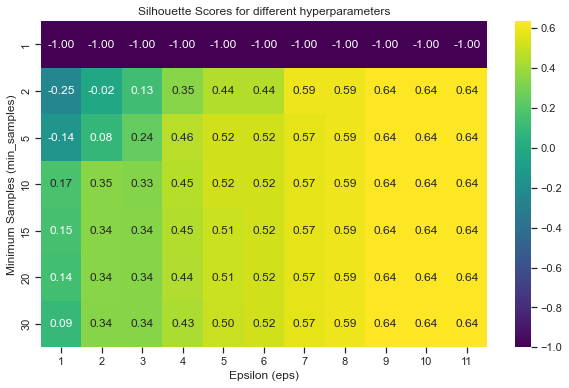

In [154]:
# Plot the heatmap
plot_silhouette_scores(eps_range, min_samples_range, silhouette_scores)

### **Apply DBSCAN for the best hyperparameter and visualize the clusters from PCA**

In [155]:
df_pca_dbscan = df_pca.copy()

In [156]:
# Create and fit the DBSCAN model with the best hyperparameter values
DbScan = DBSCAN(eps=9, min_samples=2)
cluster_labels = DbScan.fit_predict(df_pca_dbscan)

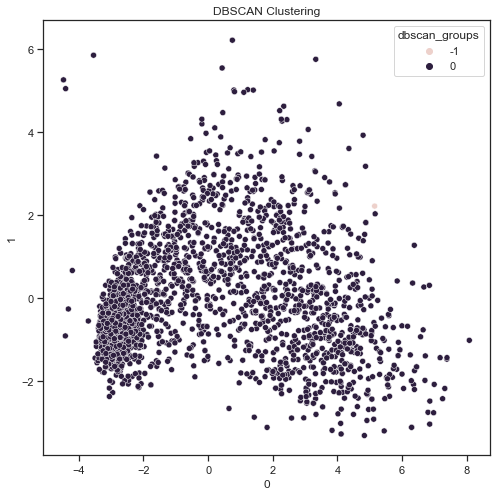

In [157]:
# Add cluster labels to your DataFrame
df_pca_dbscan['dbscan_groups'] = DbScan.labels_
df['dbscan_groups'] = DbScan.labels_
model_data['dbscan_groups'] = DbScan.labels_


# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_dbscan[0], y=df_pca_dbscan[1], data=df_pca_dbscan, hue=df_pca_dbscan['dbscan_groups'])
plt.title("DBSCAN Clustering")
plt.show()

In [158]:
df['dbscan_groups'].value_counts()

 0    2204
-1       1
Name: dbscan_groups, dtype: int64

**Observations and Insights:**
- DBSCAN does not seem to be great at clustering our data.
- Using the best scores for eps and min samples we dont get great clustering, getting two clusters with 2000+ observations in one cluster and single digits for the other cluster. 

**Think about it:**

- Changing the eps and min sample values will result in different DBSCAN results? Can we try more value for eps and min_sample?

- Yes, changing the the eps and min sample values will result in a different DBSCAN result. I have testing different combinations of other eps and min sample values and looked at the clusters and DBSCAN with a large range of values doesnt seem to cluster well. There are always clusters with single digit observations or a single cluster has most of the values in it.

### **Characteristics of each cluster**

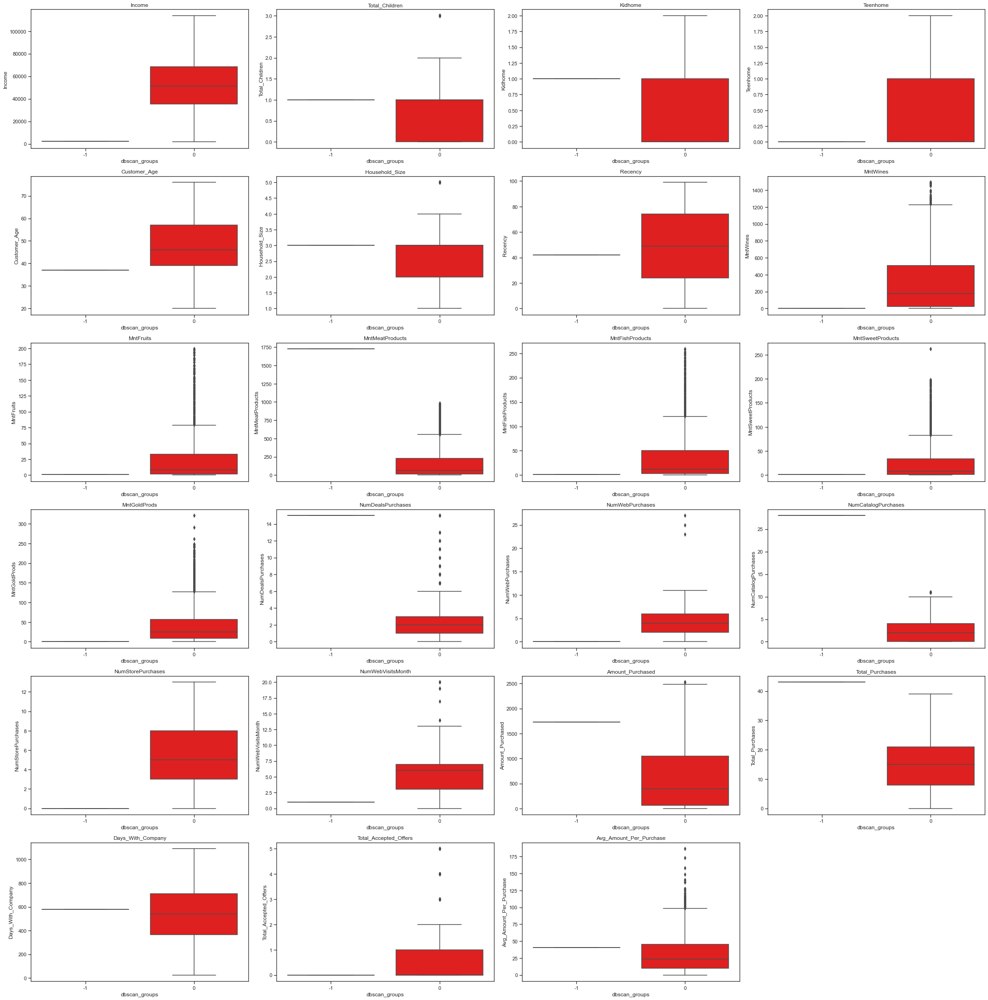

In [159]:
all_col = [
    'Income',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Customer_Age',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
color_mapping = {0: 'red', -1: 'blue'}

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)
    
    sns.boxplot(y=df[variable], x=df['dbscan_groups'], palette=color_mapping)
    
    plt.tight_layout()
    
    plt.title(variable)

plt.show()

In [160]:
# Describe() the orginal data using the kmeans 3 clusters
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('dbscan_groups')[all_col].describe()

Income                                                        \
                count          mean           std     min      25%      50%   
dbscan_groups                                                                 
-1                1.0   2447.000000           NaN  2447.0   2447.0   2447.0   
 0             2204.0  51644.406534  20691.244118  1730.0  35196.0  51301.0   

                                  Customer_Age                              \
                    75%       max        count       mean        std   min   
dbscan_groups                                                                
-1              2447.00    2447.0          1.0  37.000000        NaN  37.0   
 0             68289.75  113734.0       2204.0  47.100272  11.706481  20.0   

                                      Total_Children                        \
                25%   50%   75%   max          count     mean     std  min   
dbscan_groups                                                                
-1             37.0  37.0  37.0  37.0            1.0  1.00000     NaN  1.0   
 0             39.0  46.0  57.0  76.0         2204.0  0.94873  0.7494  0.0   

                                  Kidhome                                     \
               25%  50%  75%  max   count      mean       std  min  25%  50%   
dbscan_groups                                                                  
-1             1.0  1.0  1.0  1.0     1.0  1.000000       NaN  1.0  1.0  1.0   
 0             0.0  1.0  1.0  3.0  2204.0  0.441924  0.537122  0.0  0.0  0.0   

                        Teenhome                                               \
               75%  max    count      mean       std  min  25%  50%  75%  max   
dbscan_groups                                                                   
-1             1.0  1.0      1.0  0.000000       NaN  0.0  0.0  0.0  0.0  0.0   
 0             1.0  2.0   2204.0  0.506806  0.544397  0.0  0.0  0.0  1.0  2.0   

              Household_Size                                               \
                       count      mean       std  min  25%  50%  75%  max   
dbscan_groups                                                               
-1                       1.0  3.000000       NaN  3.0  3.0  3.0  3.0  3.0   
 0                    2204.0  2.593466  0.906362  1.0  2.0  3.0  3.0  5.0   

              Recency                                                     \
                count      mean        std   min   25%   50%   75%   max   
dbscan_groups                                                              
-1                1.0  42.00000        NaN  42.0  42.0  42.0  42.0  42.0   
 0             2204.0  49.01225  28.938292   0.0  24.0  49.0  74.0  99.0   

              MntWines                                                   \
                 count        mean         std  min   25%    50%    75%   
dbscan_groups                                                             
-1                 1.0    1.000000         NaN  1.0   1.0    1.0    1.0   
 0              2204.0  306.303085  337.507782  0.0  24.0  178.0  507.0   

                      MntFruits                                            \
                  max     count       mean       std  min  25%  50%   75%   
dbscan_groups                                                               
-1                1.0       1.0   1.000000       NaN  1.0  1.0  1.0   1.0   
 0             1493.0    2204.0  26.414701  39.78983  0.0  2.0  8.0  33.0   

                     MntMeatProducts                                          \
                 max           count         mean        std     min     25%   
dbscan_groups                                                                  
-1               1.0             1.0  1725.000000        NaN  1725.0  1725.0   
 0             199.0          2204.0   164.604356  215.28327     0.0    16.0   

                                      MntFishProducts                       \
                  50% 

**Summary of each cluster:**

- Group -1 (outliers): There is only 1 observation in this cluster. The income of this customer is $2,447. The customer is 37 years old. The customer has 1 child which is a kid. The customer has a partner, so the household size is 3. The customer has spent $1 on wines, fruits. This customer has spent **$1,725 on meats** in the last 2 years, which is one of the largest in the whole dataset. This customer sepnt $1 on fish, sweet and gold products. This customer is a **deal seeker with 15 deals** purchased. This customer has never visited the website. This customer has purchased from the **catalog 28 times** the largest in the dataset. This customer has never purchased from the store. This customer has visited the website 1 time a month. The total amount purchased over the two years is $1,730 which $1,725 is meats. The **total purchases were 43** which is the most out of the whole dataset. This customer has been with the company a fair amount of time of 579 days. This customer has never accepted a campaign offer. This customer has a average purchase amount of $40, which is much higher on average then other customers.

- Group -1 Insights: **Very-Low-Income, Meat Products Only, Deal Seeker, Catalog Channel, Modest Spender**
    - Demographics: Young with a small family, little income.
    - Income and Spending: Low income, one of the highest spending on meats.
    - Engagement: Only engages through the catalog, seeks out deals, and doesnt participate in campaign offers.
    - Conclusions: This group seeks our deals in the catalog for meats. Strategies might involve exclusive deals around meats in the catalog. Engage them through the catalog. **Implement exclusive membership or loyalty programs and engage through catalog channel, with some emphasis on meat products.**

- Group 0: This group is substantially larger, encompassing 2204 records. The mean income of individuals in this cluster is approximately 51644.41 with a considerable standard deviation of 20691.24, implying a wide spread around the mean. The mean of the average amount per purchase is 32.59 with a standard deviation of 28.56, indicating variability in purchasing behavior within this cluster. The customers in this cluster have accepted up to 5 offers, with 75% of the group accepting 1 or no offers, suggesting a general hesitancy or selectivity toward accepting offers among them.

- Group 0 Insights: **Diverse Income, Varied Spending, Selective Deal Acceptance**
    - Demographics: This group encompasses a wide range of individuals, with varying incomes and spending patterns. With 2204 records, it represents a substantial portion of the customer base.
    - Income and Spending: The mean income of this group is 51644.41, with significant variability (standard deviation of 20691.24). Mean spending per purchase is 32.59, again with a wide spread (standard deviation of 28.56), highlighting the economic diversity within this cluster.
    - Engagement: The data points to varied engagement with offers, with up to 5 offers being accepted, but 75% of the group accepting 1 or no offers, indicating a level of selectivity or hesitancy toward deal acceptance.
    - Conclusions: Considering the size and variability within this group, it might be beneficial to further segment this cluster to better tailor marketing strategies. **Overall, understanding the preferred channels and types of offers that resonate with this group is crucial to enhancing engagement. Implementing tiered loyalty programs or offers that cater to different income and spending levels within this group could optimize impact and appeal to the diverse customer base within it.**

Cluster Conclusions: This DBSCAN Cluster does not make a lot of insights since one cluster is only one observation which is an outlier on a few categories such as meats, and the other cluster is all the other observations. Lets see if we can get a DBSCAN with 3 or more clusters with good distibution in the number of observations in the clusters.

In [161]:
df_pca_dbscan = df_pca.copy()

In [162]:
# Create and fit the DBSCAN model with the best hyperparameter values
DbScan = DBSCAN(eps=8, min_samples=5)
cluster_labels = DbScan.fit_predict(df_pca_dbscan)

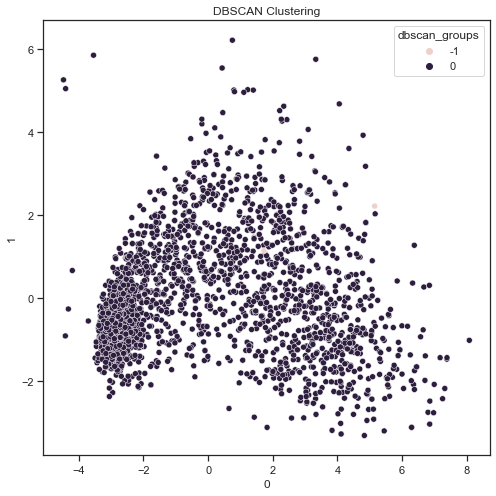

In [163]:
# Add cluster labels to your DataFrame
df_pca_dbscan['dbscan_groups'] = DbScan.labels_
df['dbscan_groups'] = DbScan.labels_
model_data['dbscan_groups'] = DbScan.labels_


# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_dbscan[0], y=df_pca_dbscan[1], data=df_pca_dbscan, hue=df_pca_dbscan['dbscan_groups'])
plt.title("DBSCAN Clustering")
plt.show()

In [164]:
df['dbscan_groups'].value_counts()

 0    2203
-1       2
Name: dbscan_groups, dtype: int64

**Observations:**
- DBSCAN with many different eps and min_samples doesnt seem to be able to cluster the data into well distibuted groups. Usually it clusters a few clusters with single digit observations and another cluster with the vast majority of the data.

Conclusion: DBSCAN should not be used to cluster the data.

## **Gaussian Mixture Model**

In [165]:
df_pca_gmm = df_pca.copy()

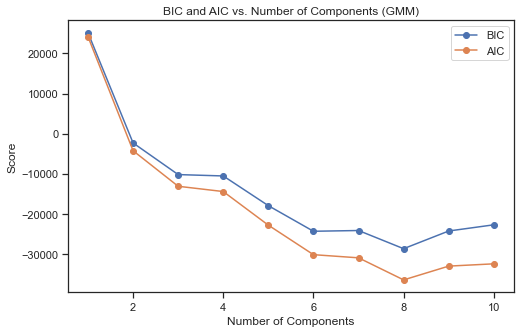

In [166]:
# Initialize lists to store BIC and AIC values
bic_scores = []
aic_scores = []

# Define the range of component numbers to iterate through
component_range = range(1, 11)  # Adjust the range as needed

for n_components in component_range:
    # Create and fit the Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(df_pca_gmm)  # Replace with your data
    
    # Calculate BIC and AIC scores
    bic_scores.append(gmm.bic(df_pca_gmm))
    aic_scores.append(gmm.aic(df_pca_gmm))
    
# Plot BIC and AIC scores
plt.figure(figsize=(8, 5))
plt.plot(component_range, bic_scores, label='BIC', marker='o')
plt.plot(component_range, aic_scores, label='AIC', marker='o')
plt.title('BIC and AIC vs. Number of Components (GMM)')
plt.xlabel('Number of Components')
plt.ylabel('Score')
plt.legend()
plt.show()

**Observations:**
- We can see there are two elbows in this plot. There is an elbow at 3 clusters as well as 6 clusters. This seems to match what we get with other clustering algorithms where 3-6 clusters seem to be the best scores.

Silhouette Score for 3 components: 0.1654162669591206
Silhouette Score for 4 components: 0.14746332237049672
Silhouette Score for 5 components: 0.09272270902443946
Silhouette Score for 6 components: 0.06588196037442683
Silhouette Score for 7 components: 0.0600171217846749


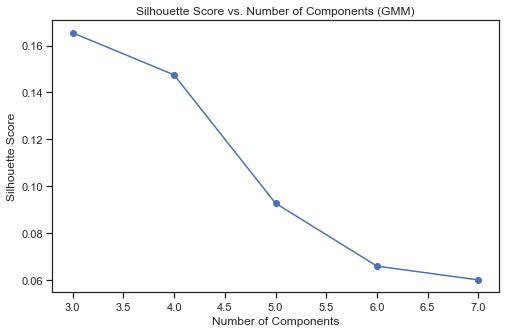

In [167]:
# Initialize a list to store silhouette scores
silhouette_scores = []

# Define the range of component numbers to iterate through
component_range = range(3, 8)  # Start from 3 components and go up to 7 components

for n_components in component_range:
    # Create and fit the Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    cluster_labels = gmm.fit_predict(df_pca_gmm)  
    
    # Calculate the Silhouette Score for this iteration
    silhouette_avg = silhouette_score(df_pca_gmm, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"Silhouette Score for {n_components} components: {silhouette_avg}")

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(component_range, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Components (GMM)')
plt.xlabel('Number of Components')
plt.ylabel('Silhouette Score')
plt.show()

**Observations:**
- Silhouette score seems to take a large dropoff at 5 clusters. However, for 3-4 clusters the silhouette score isnt very high to begin with. 


In [168]:
df_pca_gmm = df_pca.copy()

In [169]:
gmm = GaussianMixture(n_components = 3, random_state = 1)  # Initializing the Gaussian Mixture algorithm

gmm.fit(df_pca_gmm)   

GaussianMixture(n_components=3, random_state=1)

**Observations and Insights:**

Observations: Given the silhouette score and BIC score plots a good place to start clustering seems to be with 3 clusters and the farthest from the plots seems to be 5-6 clusters.

Insights: Given the plots above starting with 3 clusters and going to 5 clusters seems to be a good place to start. This is also what we get with other clustering algorithms, so its a good place to start.

### **Visualize the clusters using PCA**

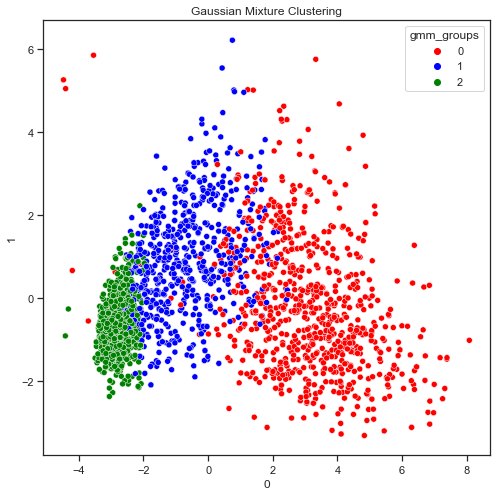

In [170]:
# Add cluster labels to your DataFrame
df_pca_gmm['gmm_groups'] = gmm.predict(df_pca_gmm)
df['gmm_groups'] = gmm.predict(df_pca)
model_data['gmm_groups'] = gmm.predict(df_pca)
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green'}

# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_gmm[0], y=df_pca_gmm[1], data=df_pca_gmm, hue=df_pca_gmm['gmm_groups'], palette=color_mapping)
plt.title("Gaussian Mixture Clustering")
plt.show()

### **Cluster Profiling**

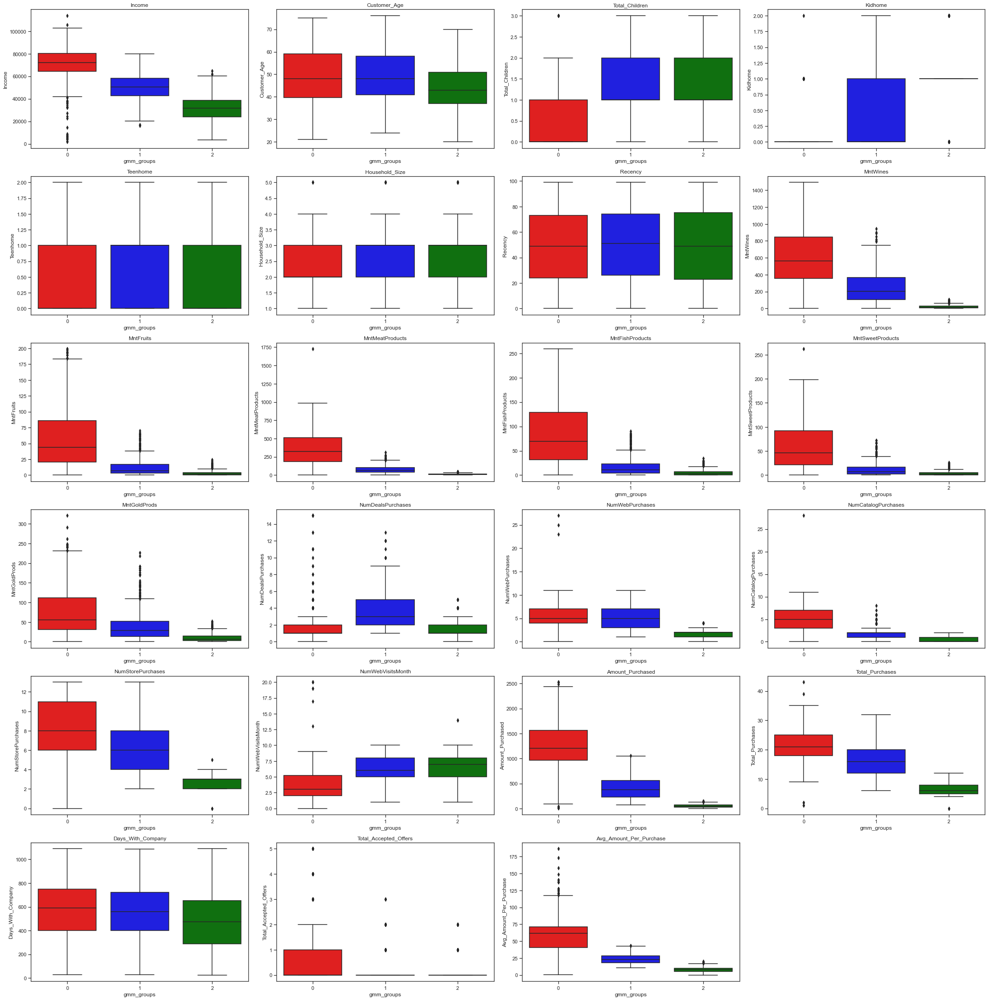

In [171]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
plt.figure(figsize=(30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['gmm_groups'], palette=color_mapping)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [172]:
df['gmm_groups'].value_counts()

0    820
2    756
1    629
Name: gmm_groups, dtype: int64

In [173]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('gmm_groups')[all_col].describe()

Income                                                          \
            count          mean           std      min       25%      50%   
gmm_groups                                                                  
0           820.0  71036.598780  14246.200697   1730.0  64491.25  72138.0   
1           629.0  50025.510334  11432.735627  16005.0  42523.00  50437.0   
2           756.0  31892.410053  11057.911882   3502.0  23813.25  31774.5   

                              Customer_Age                                     \
                75%       max        count       mean        std   min    25%   
gmm_groups                                                                      
0           80124.0  113734.0        820.0  48.519512  12.526050  21.0  39.75   
1           58086.0   79761.0        629.0  49.011129  10.962655  24.0  41.00   
2           38761.5   64587.0        756.0  43.957672  10.710807  20.0  37.00   

                             Total_Children                                \
             50%   75%   max          count      mean       std  min  25%   
gmm_groups                                                                  
0           48.0  59.0  75.0          820.0  0.468293  0.607418  0.0  0.0   
1           48.0  58.0  76.0          629.0  1.162162  0.642769  0.0  1.0   
2           43.0  51.0  70.0          756.0  1.292328  0.698528  0.0  1.0   

                          Kidhome                                          \
            50%  75%  max   count      mean       std  min  25%  50%  75%   
gmm_groups                                                                  
0           0.0  1.0  3.0   820.0  0.082927  0.280330  0.0  0.0  0.0  0.0   
1           1.0  2.0  3.0   629.0  0.419714  0.528180  0.0  0.0  0.0  1.0   
2           1.0  2.0  3.0   756.0  0.850529  0.466223  0.0  1.0  1.0  1.0   

                Teenhome                                               \
            max    count      mean       std  min  25%  50%  75%  max   
gmm_groups                                                              
0           2.0    820.0  0.385366  0.523238  0.0  0.0  0.0  1.0  2.0   
1           2.0    629.0  0.742448  0.517645  0.0  0.0  1.0  1.0  2.0   
2           2.0    756.0  0.441799  0.527946  0.0  0.0  0.0  1.0  2.0   

           Household_Size                                               \
                    count      mean       std  min  25%  50%  75%  max   
gmm_groups                                                               
0                   820.0  2.095122  0.809423  1.0  2.0  2.0  3.0  5.0   
1                   629.0  2.829889  0.808787  1.0  2.0  3.0  3.0  5.0   
2                   756.0  2.937831  0.841064  1.0  2.0  3.0  3.0  5.0   

           Recency                                                      \
             count       mean        std  min   25%   50%    75%   max   
gmm_groups                                                               
0            820.0  48.620732  28.958499  0.0  24.0  49.0  73.00  99.0   
1            629.0  50.254372  28.806716  0.0  26.0  51.0  74.00  99.0   
2            756.0  48.394180  29.014053  0.0  23.0  49.0  75.25  99.0   

           MntWines                                                     \
              count        mean         std  min    25%    50%     75%   
gmm_groups                                                               
0             820.0  609.770732  330.708085  1.0  357.5  565.0  846.25   
1             629.0  253.790143  187.756213  1.0  108.0  202.0  368.00   
2             756.0   20.432540   19.840475  0.0    6.0   14.0   28.25   

                   MntFruits                                               \
               max     count       mean        std  min   25%   50%   75%   
gmm_groups                                                                  
0           1493.0     820.0  58.551220  49.074472  0.0  21.0  44.0  86.0   
1            944.0     629.0  12.515103  14.119435  0

**Observations and Insights:**

- Group 0: There are 820 observations in Group 0. This group has a mean Income of $71,036.60 with a range from $1,730.00-$113,734.00. This group has a mean Total Children of 0.47 with a range from 0.00-3.00. This group has a mean Kidhome of 0.08 with a range from 0.00-2.00. This group has a mean Teenhome of 0.39 with a range from 0.00-2.00. This group has a mean Customer Age of 48.52 with a range from 21.00-75.00. This group has a mean Household Size of 2.10 with a range from 1.00-5.00. This group has a mean Recency of 48.62 with a range from 0.00-99.00. This group has a mean MntWines of $609.77 with a range from $1.00-$1,493.00. This group has a mean MntFruits of $58.55 with a range from $0.00-$199.00. This group has a mean MntMeatProducts of $372.25 with a range from $1.00-$1,725.00. This group has a mean MntFishProducts of $84.17 with a range from $0.00-$259.00. This group has a mean MntSweetProducts of $60.90 with a range from $0.00-$262.00. This group has a mean MntGoldProds of $77.14 with a range from $0.00-$321.00. This group has a mean NumDealsPurchases of 1.99 with a range from 0.00-15.00. This group has a mean NumWebPurchases of 5.58 with a range from 0.00-27.00. This group has a mean NumCatalogPurchases of 5.35 with a range from 0.00-28.00. This group has a mean NumStorePurchases of 8.34 with a range from 0.00-13.00. This group has a mean NumWebVisitsMonth of 3.85 with a range from 0.00-20.00. This group has a mean Amount Purchased of 1,262.78 with a range from 8.00-2,525.00. This group has a mean Total Purchases of 21.26 with a range from 1.00-43.00. This group has a mean Days With Company of 572.37 with a range from 27.00-1,089.00. This group has a mean Total Accepted Offers of 0.85 with a range from 0.00-5.00. This group has a mean Avg Amount Per Purchase of $62.05 with a range from $0.53-$186.50.

- Group 0 Insights: **Affluent, Smaller Families, Minimal Child Obligations, High Spending, Highly Engaged**
    - Demographics: Predominantly middle-aged customers, with fewer children (both kids and teens) and smaller family sizes.
    - Income and Spending: Boasts the highest income and demonstrates substantial spending across various product categories, particularly on wines.
    - Purchase Behavior: Exhibits a strong preference for store purchases, with the highest number of store purchases and website visits among the groups.
    - Engagement: Moderately engaged with campaigns and has a substantial duration of relationship with the company.
    - Conclusions: Group 0 appears to comprise affluent, middle-aged customers with smaller families, reflecting in their high income and substantial spending, particularly on wines. Their purchase behavior is strongly tilted towards store purchases and website visits, indicating a preference for an omnichannel shopping experience. Their engagement with campaigns is moderate, and they have a relatively long-standing relationship with the company. **Strategies for this group might focus on premium products and offers, especially in the wine category, and utilizing an omnichannel approach to cater to their in-store and online shopping preferences. Considering their substantial income and spending, exploring opportunities for premium memberships or exclusive offers might also be viable.**

- Group 1: There are 629 observations in Group 1. This group has a mean Income of $50,025.51 with a range from $16,005.00-$79,761.00. This group has a mean Total Children of 1.16 with a range from 0.00-3.00. This group has a mean Kidhome of 0.69 with a range from 0.00-2.00. This group has a mean Teenhome of 0.47 with a range from 0.00-2.00. This group has a mean Customer Age of 45.15 with a range from 20.00-75.00. This group has a mean Household Size of 2.82 with a range from 1.00-5.00. This group has a mean Recency of 50.20 with a range from 0.00-99.00. This group has a mean MntWines of $63.61 with a range from $0.00-$366.00. This group has a mean MntFruits of $9.69 with a range from $0.00-$77.00. This group has a mean MntMeatProducts of $43.93 with a range from $0.00-$246.00. This group has a mean MntFishProducts of $13.10 with a range from $0.00-$88.00. This group has a mean MntSweetProducts of $10.14 with a range from $0.00-$92.00. This group has a mean MntGoldProds of $20.67 with a range from $0.00-$127.00. This group has a mean NumDealsPurchases of 1.75 with a range from 0.00-7.00. This group has a mean NumWebPurchases of 2.34 with a range from 0.00-8.00. This group has a mean NumCatalogPurchases of 0.60 with a range from 0.00-4.00. This group has a mean NumStorePurchases of 3.67 with a range from 0.00-8.00. This group has a mean NumWebVisitsMonth of 5.84 with a range from 1.00-20.00. This group has a mean Amount Purchased of $160.74 with a range from $8.00-$442.00. This group has a mean Total Purchases of 8.36 with a range from 2.00-17.00. This group has a mean Days With Company of 560.11 with a range from 27.00-1,087.00. This group has a mean Total Accepted Offers of 0.28 with a range from 0.00-3.00. This group has a mean Avg Amount Per Purchase of $23.74 with a range from $10.71-$43.04.

- Group 1 Insights: **Moderate Income, Mid-Size Families, Conservative Spending, Deal Seeker**
    - Demographics: Primarily middle-aged customers with children, both kids and teens, and mid-size families.
    - Income and Spending: Moderate income but relatively conservative spending across various product categories, except wines.
    - Purchase Behavior: Prefers store purchases, with the highest number of store purchases and website visits but spends the least overall.
    - Engagement: Moderately engaged with campaigns and has an average relationship duration with the company.
    - Purchase Behavior: Exhibits a balanced behavior between web and store purchases and has the second-highest number of website visits among the groups.
    - Conclusions: This group seems to be comprised mainly of middle-aged families with children, showcasing a balanced purchase behavior between different platforms but spending conservatively. Their engagement with campaigns is moderate, indicating there might be potential to enhance their engagement and spending through targeted campaigns. **Strategy might involve exploring upselling and cross-selling opportunities, emphasizing family-oriented products and offers, and utilizing an omnichannel approach to cater to their balanced purchase behavior.**

- Group 2: There are 756 observations in Group 2. This group has a mean Income of $31,892.41 with a range from $3,502.00-$64,587.00. This group has a mean Total Children of 1.29 with a range from 0.00-3.00. This group has a mean Kidhome of 0.85 with a range from 0.00-2.00. This group has a mean Teenhome of 0.44 with a range from 0.00-2.00. This group has a mean Customer Age of 43.96 with a range from 20.00-70.00. This group has a mean Household Size of 2.94 with a range from 1.00-5.00. This group has a mean Recency of 48.39 with a range from 0.00-99.00. This group has a mean MntWines of $20.43 with a range from $0.00-$105.00. This group has a mean MntFruits of $3.09 with a range from $0.00-$24.00. This group has a mean MntMeatProducts of $12.94 with a range from $0.00-$49.00. This group has a mean MntFishProducts of $4.79 with a range from $0.00-$34.00. This group has a mean MntSweetProducts of $3.30 with a range from $0.00-$26.00. This group has a mean MntGoldProds of $10.28 with a range from $0.00-$52.00. This group has a mean NumDealsPurchases of 1.77 with a range from 0.00-5.00. This group has a mean NumWebPurchases of 1.63 with a range from 0.00-4.00. This group has a mean NumCatalogPurchases of 0.32 with a range from 0.00-2.00. This group has a mean NumStorePurchases of 2.89 with a range from 0.00-5.00. This group has a mean NumWebVisitsMonth of 6.41 with a range from 1.00-14.00. This group has a mean Amount Purchased of 54.83 with a range from 5.00-148.00. This group has a mean Total Purchases of 6.61 with a range from 0.00-12.00. This group has a mean Days With Company of 482.50 with a range from 26.00-1,089.00. This group has a mean Total Accepted Offers of 0.15 with a range from 0.00-2.00. This group has a mean Avg Amount Per Purchase of $8.00 with a range from $0.00-$20.43.

- Group 2 Insights: **Lowest Income, Young Families, Minimal Spending**
    - Demographics: Primarily younger customers with children (mostly kids) and the largest family size among all groups.
    - Income and Spending: Has the lowest income and the most minimal spending across various product categories.
    - Purchase Behavior: Predominantly prefers store purchases, with the least number of web and catalog purchases among the groups.
    - Engagement: Least engaged with campaigns and has the shortest relationship duration with the company.
    - Conclusions: Group 2 represents young families, possibly at the initial stages of their careers or with limited financial flexibility, reflected in their low income and minimal spending. Their primary shopping platform is in-store, and they have the least engagement with campaigns. **Strategies for this group might focus on providing high-value, low-cost options and engaging them through in-store promotions and deals to enhance their purchase frequency and volume. Additionally, exploring ways to extend their relationship with the company, possibly through loyalty programs or exclusive in-store member benefits, might be viable.**


4 Cluster Analysis

In [174]:
df_pca_gmm = df_pca.copy()

In [175]:
gmm = GaussianMixture(n_components = 4, random_state = 1)  # Initializing the Gaussian Mixture algorithm

gmm.fit(df_pca_gmm) 

GaussianMixture(n_components=4, random_state=1)

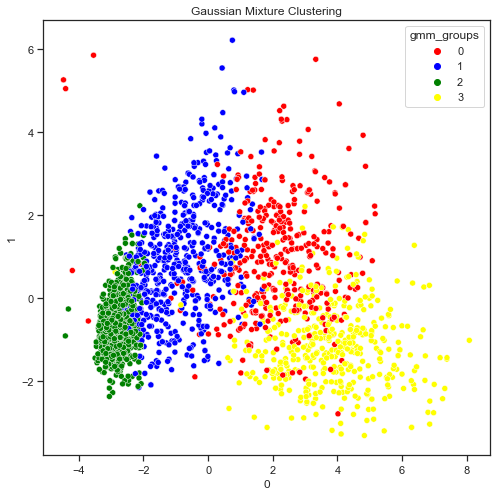

In [176]:
# Add cluster labels to your DataFrame
df_pca_gmm['gmm_groups'] = gmm.predict(df_pca_gmm)
df['gmm_groups'] = gmm.predict(df_pca)
model_data['gmm_groups'] = gmm.predict(df_pca)
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green', 3: 'yellow'}

# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_gmm[0], y=df_pca_gmm[1], data=df_pca_gmm, hue=df_pca_gmm['gmm_groups'], palette=color_mapping)
plt.title("Gaussian Mixture Clustering")
plt.show()

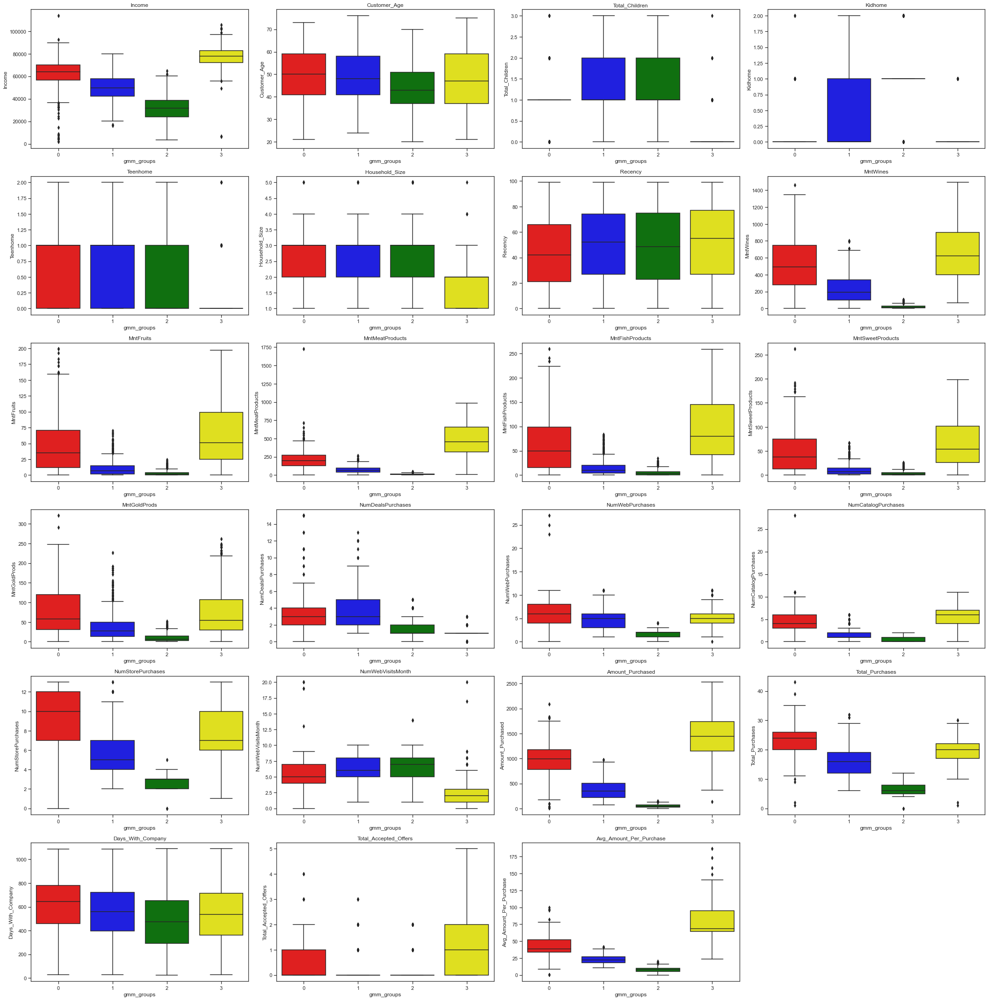

In [177]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
plt.figure(figsize=(30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['gmm_groups'], palette=color_mapping)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [178]:
df['gmm_groups'].value_counts()

2    752
1    586
3    465
0    402
Name: gmm_groups, dtype: int64

In [179]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('gmm_groups')[all_col].describe()

Income                                                          \
            count          mean           std      min       25%      50%   
gmm_groups                                                                  
0           402.0  61910.691542  14425.609100   1730.0  56664.75  63969.5   
1           586.0  49398.303754  11402.986922  16005.0  42160.50  49724.0   
2           752.0  31862.456117  11062.183493   3502.0  23813.25  31723.5   
3           465.0  77485.264516   9745.024136   6560.0  71952.00  78028.0   

                               Customer_Age                                    \
                 75%       max        count       mean        std   min   25%   
gmm_groups                                                                      
0           70179.00  113734.0        402.0  49.766169  11.339470  21.0  41.0   
1           57689.25   79761.0        586.0  48.774744  10.883711  24.0  41.0   
2           38707.75   64587.0        752.0  44.002660  10.713308  20.0  37.0   
3           82623.00  105471.0        465.0  47.673118  13.381207  21.0  37.0   

                             Total_Children                                \
             50%   75%   max          count      mean       std  min  25%   
gmm_groups                                                                  
0           50.0  59.0  73.0          402.0  0.868159  0.586661  0.0  1.0   
1           48.0  58.0  76.0          586.0  1.186007  0.644139  0.0  1.0   
2           43.0  51.0  70.0          752.0  1.292553  0.699665  0.0  1.0   
3           47.0  59.0  75.0          465.0  0.163441  0.408895  0.0  0.0   

                          Kidhome                                          \
            50%  75%  max   count      mean       std  min  25%  50%  75%   
gmm_groups                                                                  
0           1.0  1.0  3.0   402.0  0.159204  0.379693  0.0  0.0  0.0  0.0   
1           1.0  2.0  3.0   586.0  0.441980  0.530324  0.0  0.0  0.0  1.0   
2           1.0  2.0  3.0   752.0  0.849734  0.467335  0.0  1.0  1.0  1.0   
3           0.0  0.0  3.0   465.0  0.027957  0.165027  0.0  0.0  0.0  0.0   

                Teenhome                                               \
            max    count      mean       std  min  25%  50%  75%  max   
gmm_groups                                                              
0           2.0    402.0  0.708955  0.516433  0.0  0.0  1.0  1.0  2.0   
1           2.0    586.0  0.744027  0.519046  0.0  0.0  1.0  1.0  2.0   
2           2.0    752.0  0.442819  0.528220  0.0  0.0  0.0  1.0  2.0   
3           1.0    465.0  0.135484  0.366908  0.0  0.0  0.0  0.0  2.0   

           Household_Size                                               \
                    count      mean       std  min  25%  50%  75%  max   
gmm_groups                                                               
0                   402.0  2.512438  0.796560  1.0  2.0  3.0  3.0  5.0   
1                   586.0  2.853242  0.811645  1.0  2.0  3.0  3.0  5.0   
2                   752.0  2.938830  0.842596  1.0  2.0  3.0  3.0  5.0   
3                   465.0  1.778495  0.650240  1.0  1.0  2.0  2.0  5.0   

           Recency                                                     \
             count       mean        std  min   25%   50%   75%   max   
gmm_groups                                                              
0            402.0  44.417910  28.003375  0.0  21.0  42.0  66.0  99.0   
1            586.0  51.090444  29.083734  0.0  27.0  52.0  74.0  99.0   
2            752.0  48.190160  28.948777  0.0  23.0  48.5  75.0  99.0   
3            465.0  51.679570  29.044083  0.0  27.0  55.0  77.0  99.0   

           MntWines                                                       \
              count        mean         std   min     25%    50%     75%   
gmm_groups                                                                 
0             402.0  529.238806  315.686352   1.0  2

**Observations and Insights**

- Group 0: There are 402 observations in Group 0. This group has a mean Income of $61,910.69 with a range from $1,730.00-$113,734.00. This group has a mean Total Children of 0.87 with a range from 0.00-3.00. This group has a mean Kidhome of 0.16 with a range from 0.00-2.00. This group has a mean Teenhome of 0.71 with a range from 0.00-2.00. This group has a mean Customer Age of 49.77 with a range from 21.00-73.00. This group has a mean Household Size of 2.51 with a range from 1.00-5.00. This group has a mean Recency of 44.42 with a range from 0.00-99.00. This group has a mean MntWines of $529.24 with a range from $1.00-$1,459.00. This group has a mean MntFruits of $47.00 with a range from $0.00-$199.00. This group has a mean MntMeatProducts of $216.27 with a range from $1.00-$1,725.00. This group has a mean MntFishProducts of $64.03 with a range from $0.00-$259.00. This group has a mean MntSweetProducts of $48.62 with a range from $0.00-$262.00. This group has a mean MntGoldProds of $78.17 with a range from $0.00-$321.00. This group has a mean NumDealsPurchases of 3.20 with a range from 0.00-15.00. This group has a mean NumWebPurchases of 6.36 with a range from 0.00-27.00. This group has a mean NumCatalogPurchases of 4.59 with a range from 0.00-28.00. This group has a mean NumStorePurchases of 9.13 with a range from 0.00-13.00. This group has a mean NumWebVisitsMonth of 5.30 with a range from 0.00-20.00. This group has a mean Amount Purchased of $983.34 with a range from $8.00-$2,092.00. This group has a mean Total Purchases of 23.28 with a range from 1.00-43.00. This group has a mean Days With Company of 617.94 with a range from 27.00-1,087.00. This group has a mean Total Accepted Offers of 0.39 with a range from 0.00-4.00. This group has a mean Avg Amount Per Purchase of $42.32 with a range from $0.53-$99.62.

- Group 0 Insights: **Affluent, Older Diverse Families, Significant Spending, Deal Seeker, Highly Engaged**
    - Demographics: A mix of families with both children and teens, showcasing a variety in family structures.
    - Income and Spending: High income and demonstrates significant spending, particularly on wines.
    - Purchase Behavior: Predominantly prefers store purchases and also engages well online, with the highest number of web purchases.
    - Engagement: Displays moderate engagement with campaigns and has a relatively long-standing relationship with the company.
    - Conclusions: This group, while affluent and exhibiting significant spending, primarily engages through store and web purchases. They exhibit a balanced family structure, with both teens and children present. **Strategies for this group might focus on premium offerings across categories, particularly wines, and could leverage both in-store and online channels for marketing and engagement. Loyalty programs or exclusive offers could also be attractive for this group, given their substantial spending.**

- Group 1: There are 586 observations in Group 1. This group has a mean Income of $49,398.30 with a range from $16,005.00-$79,761.00. This group has a mean Total Children of 1.19 with a range from 0.00-3.00. This group has a mean Kidhome of 0.78 with a range from 0.00-2.00. This group has a mean Teenhome of 0.41 with a range from 0.00-2.00. This group has a mean Customer Age of 45.92 with a range from 20.00-70.00. This group has a mean Household Size of 2.95 with a range from 1.00-5.00. This group has a mean Recency of 50.09 with a range from 0.00-99.00. This group has a mean MntWines of $38.05 with a range from $0.00-$262.00. This group has a mean MntFruits of $5.31 with a range from $0.00-$66.00. This group has a mean MntMeatProducts of $26.60 with a range from $0.00-$172.00. This group has a mean MntFishProducts of $7.75 with a range from $0.00-$111.00. This group has a mean MntSweetProducts of $5.30 with a range from $0.00-$48.00. This group has a mean MntGoldProds of $16.35 with a range from $0.00-$132.00. This group has a mean NumDealsPurchases of 2.12 with a range from 0.00-9.00. This group has a mean NumWebPurchases of 2.68 with a range from 0.00-9.00. This group has a mean NumCatalogPurchases of 0.77 with a range from 0.00-6.00. This group has a mean NumStorePurchases of 4.26 with a range from 0.00-8.00. This group has a mean NumWebVisitsMonth of 6.81 with a range from 1.00-20.00. This group has a mean Amount Purchased of 100.75 with a range from 5.00-$442.00. This group has a mean Total Purchases of 10.83 with a range from 0.00-22.00. This group has a mean Days With Company of 525.33 with a range from 26.00-1,089.00. This group has a mean Total Accepted Offers of 0.16 with a range from 0.00-2.00. This group has a mean Avg Amount Per Purchase of $9.28 with a range from $0.00-$22.60.

- Group 1 Insights: **Moderate Income, Larger Families, Conservative Spending, Deal Seeker, Moderatly Engaged**
    - Demographics: Includes larger families, typically with children
    - Income and Spending: Exhibits moderate income levels and tends to spend conservatively across various categories.
    -Purchase Behavior: Leans towards in-store shopping but also engages in web purchases.
    - Engagement: Engages modestly with campaigns and has a middle-of-the-road relationship duration with the company.
    - Conclusions: Group 1 seems to consist of larger, possibly budget-conscious families given their conservative spending patterns. **Marketing strategies might focus on value-for-money deals and family-oriented products. The in-store shopping experience could be leveraged with special offers and promotions to enhance their spending, while online channels could be used for engagement and communication.**

- Group 2: There are 752 observations in Group 2. This group has a mean Income of $31,862.46 with a range from $3,502.00-$64,587.00. This group has a mean Total Children of 1.29 with a range from 0.00-3.00. This group has a mean Kidhome of 0.85 with a range from 0.00-2.00. This group has a mean Teenhome of 0.44 with a range from 0.00-2.00. This group has a mean Customer Age of 43.96 with a range from 20.00-70.00. This group has a mean Household Size of 2.94 with a range from 1.00-5.00. This group has a mean Recency of 48.39 with a range from 0.00-99.00. This group has a mean MntWines of $20.43 with a range from $0.00-$105.00. This group has a mean MntFruits of $3.09 with a range from $0.00-$24.00. This group has a mean MntMeatProducts of $16.13 with a range from $0.00-$104.00. This group has a mean MntFishProducts of $6.11 with a range from $0.00-$60.00. This group has a mean MntSweetProducts of $4.26 with a range from $0.00-$31.00. This group has a mean MntGoldProds of $15.49 with a range from $0.00-$78.00. This group has a mean NumDealsPurchases of 1.77 with a range from 0.00-7.00. This group has a mean NumWebPurchases of 1.98 with a range from 0.00-6.00. This group has a mean NumCatalogPurchases of 0.29 with a range from 0.00-5.00. This group has a mean NumStorePurchases of 3.06 with a range from 0.00-6.00. This group has a mean NumWebVisitsMonth of 6.43 with a range from 0.00-20.00. This group has a mean Amount Purchased of 66.50 with a range from 4.00-$315.00. This group has a mean Total Purchases of 7.10 with a range from 1.00-14.00. This group has a mean Days With Company of 501.40 with a range from 26.00-1,089.00. This group has a mean Total Accepted Offers of 0.16 with a range from 0.00-2.00. This group has a mean Avg Amount Per Purchase of $7.96 with a range from $0.00-$20.43.

- Group 2 Insights: **Lowest Income, Young Large Families, Lowest Spending, Least Engaged**
    - Income and Spending: Has the lowest income and the least spending across various product categories.
    - Purchase Behavior: Predominantly prefers store purchases, with minimal engagement through web and catalog purchases.
    - Engagement: Least engaged with campaigns and has the shortest relationship duration with the company.
    - Engagement: Displays moderate engagement with campaigns and has a relatively long-standing relationship with the company.
    - Conclusions: Group 2 represents young families, potentially at the initial stages of their career/life, reflecting in their low income and minimal spending. **Strategies for this group might focus on providing high-value, low-cost options, and engaging them through in-store promotions and deals to enhance their purchase frequency and volume. Also, exploring ways to build and sustain their relationship with the company through loyalty programs or exclusive in-store benefits might be viable.**

- Group 3: There are 465 observations in Group 3. This group has a mean Income of $77,485.26 with a range from $6,560.00-$105,471.00. This group has a mean Total Children of 0.16 with a range from 0.00-3.00. This group has a mean Kidhome of 0.03 with a range from 0.00-1.00. This group has a mean Teenhome of 0.14 with a range from 0.00-2.00. This group has a mean Customer Age of 47.67 with a range from 21.00-75.00. This group has a mean Household Size of 1.78 with a range from 1.00-5.00. This group has a mean Recency of 51.68 with a range from 0.00-99.00. This group has a mean MntWines of $664.14 with a range from $67.00-$1,493.00. This group has a mean MntFruits of $65.54 with a range from $0.00-$197.00. This group has a mean MntMeatProducts of $484.10 with a range from $12.00-$984.00. This group has a mean MntFishProducts of $96.77 with a range from $0.00-$258.00. This group has a mean MntSweetProducts of $67.66 with a range from $0.00-$198.00. This group has a mean MntGoldProds of $75.40 with a range from $0.00-$262.00. This group has a mean NumDealsPurchases of 1.05 with a range from 0.00-3.00. This group has a mean NumWebPurchases of 5.00 with a range from 0.00-11.00. This group has a mean NumCatalogPurchases of 5.84 with a range from 0.00-11.00. This group has a mean NumStorePurchases of 7.73 with a range from 1.00-13.00. This group has a mean NumWebVisitsMonth of 2.71 with a range from 0.00-20.00. This group has a mean Amount Purchased of $1,453.61 with a range from $137.00-$2,525.00. This group has a mean Total Purchases of 19.62 with a range from 1.00-30.00. This group has a mean Days With Company of 535.11 with a range from 27.00-1,089.00. This group has a mean Total Accepted Offers of 1.20 with a range from 0.00-5.00. This group has a mean Avg Amount Per Purchase of $76.25 with a range from $23.77-$186.50.

- Group 3 Insights: **Wealthiest, Small Families/Individuals, Premium Spending, Most Engaged**
    - Demographics: Smaller families or individuals, often without children.
    - Income and Spending: Exhibits the highest income and spending across all categories.
    - Purchase Behavior: Engages significantly through web and catalog purchases, showcasing a preference for online shopping.
    - Engagement: Engages well with campaigns and has a moderate relationship duration with the company.
    - Conclusions: Group 3 appears to be the wealthiest, often comprising smaller families or individuals, and demonstrates premium spending patterns across categories. **Strategies for this group might focus on exclusive and premium products and offers, utilizing online and catalog channels for marketing. Given their engagement with campaigns, personalized and exclusive offers might be particularly effective. A loyalty or rewards program, providing additional value or exclusivity, could further enhance their spending and engagement.**

5 Cluster Analysis

In [180]:
df_pca_gmm = df_pca.copy()

In [181]:
gmm = GaussianMixture(n_components = 5, random_state = 1)  # Initializing the Gaussian Mixture algorithm

gmm.fit(df_pca_gmm)  

GaussianMixture(n_components=5, random_state=1)

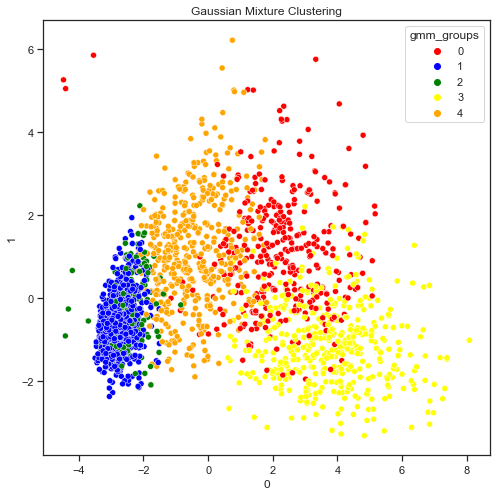

In [182]:
# Add cluster labels to your DataFrame
df_pca_gmm['gmm_groups'] = gmm.predict(df_pca_gmm)
df['gmm_groups'] = gmm.predict(df_pca)
model_data['gmm_groups'] = gmm.predict(df_pca)
# Define a custom color mapping for the groups
color_mapping = {0: 'red', 1: 'blue', 2: 'green', 3: 'yellow', 4: 'orange'}

# Create a scatter plot
plt.figure(figsize=(8, 8))
sns.scatterplot(x=df_pca_gmm[0], y=df_pca_gmm[1], data=df_pca_gmm, hue=df_pca_gmm['gmm_groups'], palette=color_mapping)
plt.title("Gaussian Mixture Clustering")
plt.show()

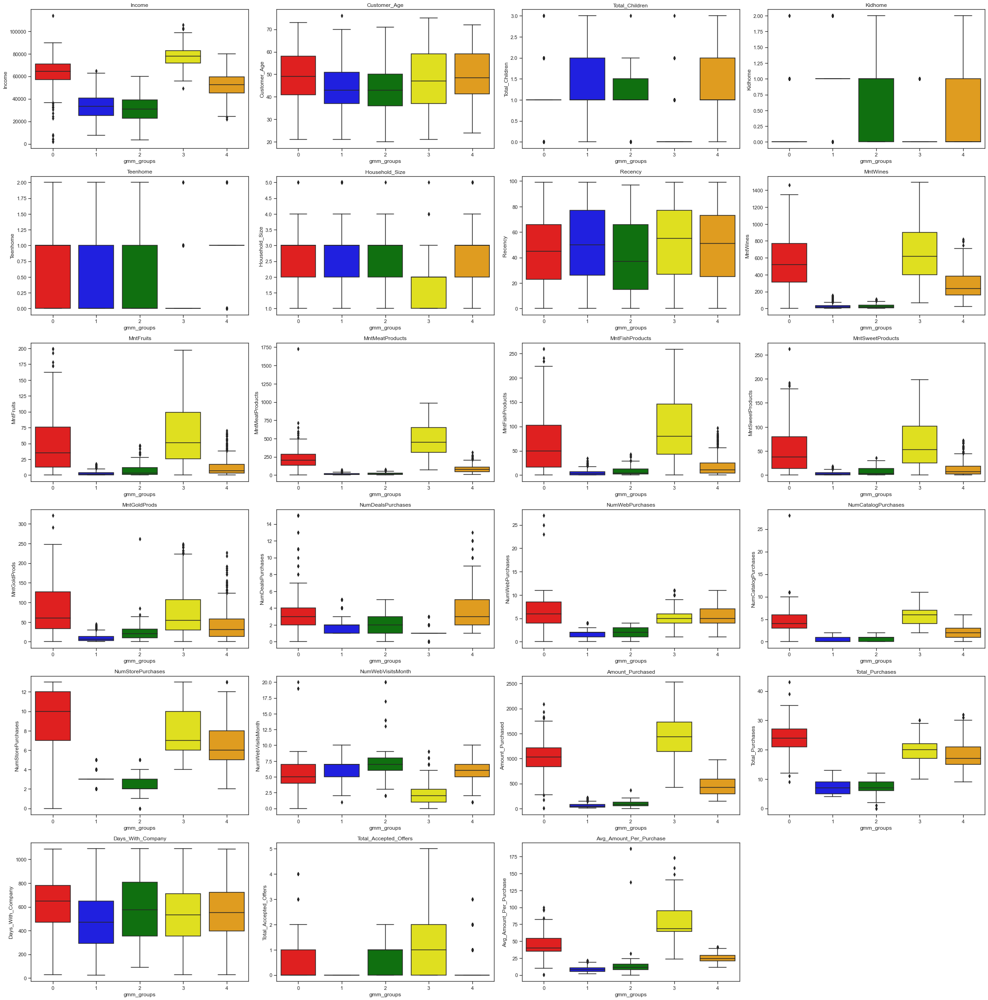

In [183]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
plt.figure(figsize=(30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(10, 4, i + 1)

    sns.boxplot(y=df[variable], x=df['gmm_groups'], palette=color_mapping)

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [184]:
df['gmm_groups'].value_counts()

1    714
4    498
3    471
0    359
2    163
Name: gmm_groups, dtype: int64

In [185]:
all_col = [
    'Income',
    'Customer_Age',
    'Total_Children',
    'Kidhome',
    'Teenhome',
    'Household_Size',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
    'Amount_Purchased',
    'Total_Purchases',
    'Days_With_Company',
    'Total_Accepted_Offers',
    'Avg_Amount_Per_Purchase',
]
df.groupby('gmm_groups')[all_col].describe()

Income                                                         \
            count          mean           std      min      25%      50%   
gmm_groups                                                                 
0           359.0  62675.175487  13752.644990   1730.0  57089.5  64325.0   
1           714.0  33311.535014  11319.402034   7500.0  25188.0  33347.0   
2           163.0  30644.435583  12203.180140   3502.0  22609.5  30983.0   
3           471.0  77641.426752   8649.876318  49118.0  71807.5  77863.0   
4           498.0  52164.136546  10349.524674  21888.0  44989.0  52372.5   

                              Customer_Age                                     \
                75%       max        count       mean        std   min    25%   
gmm_groups                                                                      
0           70822.5  113734.0        359.0  49.643454  11.337184  21.0  41.00   
1           40695.0   64587.0        714.0  44.392157  10.917657  21.0  37.00   
2           39209.0   60033.0        163.0  43.834356  11.032088  20.0  36.00   
3           82603.5  105471.0        471.0  47.853503  13.354328  21.0  37.00   
4           59397.5   79761.0        498.0  49.485944  10.526426  24.0  41.25   

                             Total_Children                                \
             50%   75%   max          count      mean       std  min  25%   
gmm_groups                                                                  
0           49.0  58.0  73.0          359.0  0.874652  0.587009  0.0  1.0   
1           43.0  51.0  76.0          714.0  1.302521  0.701287  0.0  1.0   
2           43.0  50.0  71.0          163.0  1.073620  0.671816  0.0  1.0   
3           47.0  59.0  75.0          471.0  0.161359  0.406691  0.0  0.0   
4           48.5  59.0  72.0          498.0  1.198795  0.626894  0.0  1.0   

                          Kidhome                                          \
            50%  75%  max   count      mean       std  min  25%  50%  75%   
gmm_groups                                                                  
0           1.0  1.0  3.0   359.0  0.153203  0.375856  0.0  0.0  0.0  0.0   
1           1.0  2.0  3.0   714.0  0.829132  0.487076  0.0  1.0  1.0  1.0   
2           1.0  1.5  3.0   163.0  0.730061  0.458949  0.0  0.0  1.0  1.0   
3           0.0  0.0  3.0   471.0  0.027601  0.164000  0.0  0.0  0.0  0.0   
4           1.0  2.0  3.0   498.0  0.393574  0.524758  0.0  0.0  0.0  1.0   

                Teenhome                                               \
            max    count      mean       std  min  25%  50%  75%  max   
gmm_groups                                                              
0           2.0    359.0  0.721448  0.518229  0.0  0.0  1.0  1.0  2.0   
1           2.0    714.0  0.473389  0.529620  0.0  0.0  0.0  1.0  2.0   
2           2.0    163.0  0.343558  0.501607  0.0  0.0  0.0  1.0  2.0   
3           1.0    471.0  0.133758  0.364876  0.0  0.0  0.0  0.0  2.0   
4           2.0    498.0  0.805221  0.495668  0.0  1.0  1.0  1.0  2.0   

           Household_Size                                               \
                    count      mean       std  min  25%  50%  75%  max   
gmm_groups                                                               
0                   359.0  2.518106  0.800894  1.0  2.0  3.0  3.0  5.0   
1                   714.0  2.960784  0.843174  1.0  2.0  3.0  3.0  5.0   
2                   163.0  2.693252  0.818997  1.0  2.0  3.0  3.0  5.0   
3                   471.0  1.777070  0.648390  1.0  1.0  2.0  2.0  5.0   
4                   498.0  2.861446  0.799194  1.0  2.0  3.0  3.0  5.0   

           Recency                                                     \
             count       mean        std  min   25%   50%   75%   max   
gmm_groups                                                              
0            359.0  45.064067  28.280297  0.0  23.0  45.0  66.0  99.0   
1            714.0  50.508403  28.770662  0.0  26

**Observations and Insights**

- Group 0: There are 359 observations in Group 0. This group has a mean Income of $62,675.18 with a range from $1,730.00-$113,734.00. This group has a mean Total Children of 0.87 with a range from 0.00-3.00. This group has a mean Kidhome of 0.15 with a range from 0.00-2.00. This group has a mean Teenhome of 0.72 with a range from 0.00-2.00. This group has a mean Customer Age of 49.64 with a range from 21.00-73.00. This group has a mean Household Size of 2.52 with a range from 1.00-5.00. This group has a mean Recency of 45.06 with a range from 0.00-99.00. This group has a mean MntWines of $555.72 with a range from $1.00-$1,459.00. This group has a mean MntFruits of $48.70 with a range from $0.00-$199.00. This group has a mean MntMeatProducts of $224.03 with a range from $1.00-$1,725.00. This group has a mean MntFishProducts of $65.74 with a range from $0.00-$259.00. This group has a mean MntSweetProducts of $51.06 with a range from $0.00-$262.00. This group has a mean MntGoldProds of $80.69 with a range from $0.00-$321.00. This group has a mean NumDealsPurchases of 3.27 with a range from 0.00-15.00. This group has a mean NumWebPurchases of 6.51 with a range from 0.00-27.00. This group has a mean NumCatalogPurchases of 4.71 with a range from 0.00-28.00. This group has a mean NumStorePurchases of 9.31 with a range from 0.00-13.00. This group has a mean NumWebVisitsMonth of 5.35 with a range from 0.00-20.00. This group has a mean Amount Purchased of $1,025.94 with a range from $8.00-$2,092.00. This group has a mean Total Purchases of 23.79 with a range from 9.00-43.00. This group has a mean Days With Company of 628.89 with a range from 27.00-1,087.00. This group has a mean Total Accepted Offers of 0.41 with a range from 0.00-4.00. This group has a mean Avg Amount Per Purchase of $43.47 with a range from $0.53-$99.62.

- Group 0 Insights: **Affluent, Mature Families, Diverse Shopping, Deal Seekers, Moderatly Engaged**
    - Demographics: Predominantly mature families with teens.
    - Income and Spending: High income and significant spending across various categories, notably wines.
    - Purchase Behavior: Engages substantially through multiple channels, including web, catalog, and store purchases.
    - Engagement: Maintains a significant relationship duration with the company but moderate engagement with campaigns.
    - Conclusions: Group 0 represents affluent, mature families, engaging in spending across various categories. **Marketing strategies might focus on premium offerings and could leverage multiple channels given their diverse shopping behaviors. Considering their substantial spending, loyalty programs or exclusive offers could be attractive for this group. Additionally, strategies to enhance their engagement with campaigns might be explored, ensuring the offers align with their spending patterns.**

- Group 1: There are 714 observations in Group 1. This group has a mean Income of $33,311.54 with a range from $7,500.00-$64,587.00. This group has a mean Total Children of 1.30 with a range from 0.00-3.00. This group has a mean Kidhome of 0.66 with a range from 0.00-2.00. This group has a mean Teenhome of 0.64 with a range from 0.00-2.00. This group has a mean Customer Age of 45.48 with a range from 21.00-76.00. This group has a mean Household Size of 2.89 with a range from 1.00-5.00. This group has a mean Recency of 52.18 with a range from 0.00-99.00. This group has a mean MntWines of $47.68 with a range from $1.00-$347.00. This group has a mean MntFruits of $4.74 with a range from $0.00-$65.00. This group has a mean MntMeatProducts of $16.21 with a range from $0.00-$104.00. This group has a mean MntFishProducts of $6.09 with a range from $0.00-$60.00. This group has a mean MntSweetProducts of $4.26 with a range from $0.00-$31.00. This group has a mean MntGoldProds of $15.47 with a range from $0.00-$78.00. This group has a mean NumDealsPurchases of 1.77 with a range from 0.00-7.00. This group has a mean NumWebPurchases of 1.98 with a range from 0.00-6.00. This group has a mean NumCatalogPurchases of 0.29 with a range from 0.00-5.00. This group has a mean NumStorePurchases of 3.06 with a range from 0.00-6.00. This group has a mean NumWebVisitsMonth of 6.42 with a range from 0.00-20.00. This group has a mean Amount Purchased of $66.41 with a range from $4.00-$315.00. This group has a mean Total Purchases of 7.10 with a range from 1.00-14.00. This group has a mean Days With Company of 501.56 with a range from 26.00-1,089.00. This group has a mean Total Accepted Offers of 0.16 with a range from 0.00-2.00. This group has a mean Avg Amount Per Purchase of $8.49 with a range from $2.00-$21.70.

- Group 1 Insights: **Lower-Income, Young Families, In-Store Preference, Least Engaged**
    - Demographics: Primarily young families with children.
    - Income and Spending: Lower income and conservative spending across all categories.
    - Purchase Behavior: Predominantly prefers store purchases, with limited engagement online and through catalogs.
    - Engagement: Has a shorter duration of relationship with the company and does not engage with campaigns.
    - Conclusions: Group 1 seems to consist of young families, likely budget-conscious given their lower income and conservative spending patterns. **Strategies for this group might focus on providing value-for-money deals and family-oriented products, ensuring affordability is highlighted. The in-store shopping experience could be leveraged with special offers and promotions to enhance their spending. Given their lack of engagement with campaigns, exploring alternative communication and promotion channels might be beneficial.**

- Group 2: There are 163 observations in Group 2. This group has a mean Income of $30,644.44 with a range from $3,502.00-$60,033.00. This group has a mean Total Children of 1.07 with a range from 0.00-3.00. This group has a mean Kidhome of 0.73 with a range from 0.00-2.00. This group has a mean Teenhome of 0.34 with a range from 0.00-2.00. This group has a mean Customer Age of 43.83 with a range from 20.00-71.00. This group has a mean Household Size of 2.69 with a range from 1.00-5.00. This group has a mean Recency of 41.42 with a range from 0.00-97.00. This group has a mean MntWines of $25.18 with a range from $0.00-$110.00. This group has a mean MntFruits of $8.14 with a range from $0.00-$47.00. This group has a mean MntMeatProducts of $20.65 with a range from $1.00-$76.00. This group has a mean MntFishProducts of $8.26 with a range from $0.00-$43.00. This group has a mean MntSweetProducts of $7.58 with a range from $0.00-$36.00. This group has a mean MntGoldProds of $24.72 with a range from $1.00-$262.00. This group has a mean NumDealsPurchases of 1.92 with a range from 0.00-5.00. This group has a mean NumWebPurchases of 2.00 with a range from 0.00-4.00. This group has a mean NumCatalogPurchases of 0.78 with a range from 0.00-2.00. This group has a mean NumStorePurchases of 2.66 with a range from 0.00-5.00. This group has a mean NumWebVisitsMonth of 7.23 with a range from 2.00-20.00. This group has a mean Amount Purchased of 94.54 with a range from 5.00-373.00. This group has a mean Total Purchases of 7.36 with a range from 0.00-12.00. This group has a mean Days With Company of 570.21 with a range from 89.00-1,089.00. This group has a mean Total Accepted Offers of 0.90 with a range from 0.00-2.00. This group has a mean Avg Amount Per Purchase of 13.81 with a range from 0.00-186.50.

- Group 2 Insights: **Low-Income, Young Families, Least Spending, Highly Engaged**
    - Demographics: Predominantly younger families with children.
    - Income and Spending: Lowest income and overall spending among the groups across various product categories.
    - Purchase Behavior: Prefers store purchases, with a moderate number of store purchases and web visits but spends the least overall.
    - Engagement: Modestly engaged with campaigns and has a substantial duration of relationship with the company.
    - Conclusions: This group seems to represent younger families possibly in earlier stages of their careers, given their lower incomes and larger household sizes. Their spending is conservative, likely due to budget constraints. Marketing strategies for this group might focus on deals and budget-friendly options, and channels should likely involve both in-store and online platforms, given their propensity for store purchases and web visits. **Focus on budget-friendly deals and options, possibly targeting young family-oriented products and utilizing both in-store and online platforms for engagement.**

- Group 3: There are 471 observations in Group 3. This group has a mean Income of $77,641.43 with a range from $49,118.00-$105,471.00. This group has a mean Total Children of 0.16 with a range from 0.00-3.00. This group has a mean Kidhome of 0.04 with a range from 0.00-1.00. This group has a mean Teenhome of 0.12 with a range from 0.00-2.00. This group has a mean Customer Age of 47.98 with a range from 25.00-72.00. This group has a mean Household Size of 1.80 with a range from 1.00-5.00. This group has a mean Recency of 51.48 with a range from 0.00-99.00. This group has a mean MntWines of $663.90 with a range from $66.00-$1,493.00. This group has a mean MntFruits of $66.46 with a range from $0.00-$197.00. This group has a mean MntMeatProducts of $486.73 with a range from $12.00-$984.00. This group has a mean MntFishProducts of $98.02 with a range from $0.00-$258.00. This group has a mean MntSweetProducts of $68.18 with a range from $0.00-$198.00. This group has a mean MntGoldProds of $75.44 with a range from $0.00-$262.00. This group has a mean NumDealsPurchases of 1.05 with a range from 0.00-3.00. This group has a mean NumWebPurchases of 5.01 with a range from 0.00-11.00. This group has a mean NumCatalogPurchases of 5.85 with a range from 0.00-11.00. This group has a mean NumStorePurchases of 7.73 with a range from 1.00-13.00. This group has a mean NumWebVisitsMonth of 2.72 with a range from 0.00-20.00. This group has a mean Amount Purchased of $1,453.29 with a range from $137.00-$2,525.00. This group has a mean Total Purchases of 19.63 with a range from 1.00-30.00. This group has a mean Days With Company of 531.61 with a range from 27.00-1,089.00. This group has a mean Total Accepted Offers of 1.18 with a range from 0.00-5.00. This group has a mean Avg Amount Per Purchase of 75.37 with a range from 23.39-173.23.

- Group 3 Insights: **High-Income, Older Small Families/Individuals, Premium Spending, Most Engaged**
    - Demographics: Smaller families or individuals, often with no children or teens.
    - Income and Spending: Exhibits the highest income and spending across all categories.
    - Purchase Behavior: Engages significantly through web and catalog purchases, showcasing a preference for online shopping.
    - Engagement: Engages well with campaigns and has a moderate relationship duration with the company.
    - Conclusions: Group 3 appears to be the wealthiest, often comprising smaller families or individuals, and demonstrates premium spending patterns across categories. **Strategies for this group might focus on exclusive and premium products and offers, utilizing online and catalog channels for marketing. Given their engagement with campaigns, personalized and exclusive offers might be particularly effective. A loyalty or rewards program, providing additional value or exclusivity, could further enhance their spending and engagement.**

- Group 4: There are 498 observations in Group 4. This group has a mean Income of $52,164.14 with a range from $21,888.00-$79,761.00. This group has a mean Total Children of 1.20 with a range from 0.00-3.00. This group has a mean Kidhome of 0.39 with a range from 0.00-2.00. This group has a mean Teenhome of 0.81 with a range from 0.00-2.00. This group has a mean Customer Age of 49.49 with a range from 24.00-72.00. This group has a mean Household Size of 2.86 with a range from 1.00-5.00. This group has a mean Recency of 49.76 with a range from 0.00-99.00. This group has a mean MntWines of $283.71 with a range from $24.00-$819.00. This group has a mean MntFruits of $12.70 with a range from $0.00-$70.00. This group has a mean MntMeatProducts of $86.14 with a range from $6.00-$309.00. This group has a mean MntFishProducts of $18.04 with a range from $0.00-$97.00. This group has a mean MntSweetProducts of $12.93 with a range from $0.00-$72.00. This group has a mean MntGoldProds of $43.59 with a range from $0.00-$227.00. This group has a mean NumDealsPurchases of 3.67 with a range from 1.00-13.00. This group has a mean NumWebPurchases of 5.59 with a range from 1.00-11.00. This group has a mean NumCatalogPurchases of 2.07 with a range from 0.00-6.00. This group has a mean NumStorePurchases of 6.49 with a range from 2.00-13.00. This group has a mean NumWebVisitsMonth of 5.91 with a range from 1.00-10.00. This group has a mean Amount Purchased of $457.10 with a range from $149.00-$973.00. This group has a mean Total Purchases of 17.82 with a range from 9.00-32.00. This group has a mean Days With Company of 551.75 with a range from 27.00-1,087.00. This group has a mean Total Accepted Offers of 0.29 with a range from 0.00-3.00. This group has a mean Avg Amount Per Purchase of $24.99 with a range from $11.46-$41.38.

- Group 4 Insights: **Moderate Income, Mature Families, Mid-Tier Spending, Deal Seekers**
    - Demographics: Primarily mature families with teens.
    - Income and Spending: Moderate income and mid-tier spending across various categories.
    - Purchase Behavior: Engages through multiple channels, including web and store purchases.
    - Engagement: Limited engagement with campaigns and maintains a considerable relationship duration with the company.
    - Conclusions: Group 4 seems to consist of mature families, possibly with parents and teenage children, reflecting in their moderate spending patterns. **Marketing strategies might focus on providing value offerings and family-oriented products. Engaging them through in-store promotions and online channels could enhance their purchase frequency and volume. Additionally, considering their limited engagement with campaigns, strategies to enhance their campaign interactions might be explored, such as targeted offers or information that appeals to families with teens.**

### **Characteristics of each cluster**

**Summary of each cluster:**
- 3 Clusters: 
    - Group 0: Affluent, Smaller Families, Minimal Child Obligations, High Spending, Highly Engaged
    - Group 1: Moderate Income, Mid-Size Families, Conservative Spending, Deal Seeker
    - Group 2: Lowest Income, Young Families, Minimal Spending
- 4 Clusters:
    - Group 0: Affluent, Older Diverse Families, Significant Spending, Deal Seeker, Highly Engaged
    - Group 1: Moderate Income, Larger Families, Conservative Spending, Deal Seeker, Moderatly Engaged
    - Group 2: Lowest Income, Young Large Families, Lowest Spending, Least Engaged
    - Group 3: Wealthiest, Small Families/Individuals, Premium Spending, Most Engaged
- 5 Clusters:
    - Group 0: Affluent, Mature Families, Diverse Shopping, Deal Seekers, Moderatly Engaged
    - Group 1: Lower-Income, Young Families, In-Store Preference, Least Engaged
    - Group 2: Low-Income, Young Families, Least Spending, Highly Engaged
    - Group 3: High-Income, Older Small Families/Individuals, Premium Spending, Most Engaged
    - Group 4: Moderate Income, Mature Families, Mid-Tier Spending, Deal Seekers

## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:
- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

- Some clustering techniques perform much better than others. For instance DBSCAN performed horribly, hardly able to cluster the data into evenly distributed clusters. KMeans, KMedoids, Hierarchical, and Gaussian Mixture Models performed much better and will be the model that are compared to one another. 

- Three to five clusters for all the alogirthms were giving decent silhouette scores so that is how the number of clusters were chosen. The performance of the clusters is determined by a combination of factors such as how unique are the clusters from one another, are more clusters leading to greater understanding of the data, and is their a good distribution of observations in each cluster. These are the most important factors or measures of success for the clustering algorithms. These are important metrics because they help determine how we can better market our products to these customers and what type of products should be marketed to them.  

- Three clusters seems to be too general with only high, mid, and low income groups and those groups have high, mid, and low spending reprectivly, which doesnt offer much insights. While 3 clusters have the highest silhouette scores amoung all the clusters, it doesnt bring much insights into the customer other than what was just described.

- Four clusters is better because we start to see our groups be seperated not only on income and spending, but also if the families are predominatly kids or teens, and if the high income customers are engaged in campaings or not. This gives more detail on the behavors of the customers and the demographics of them as well.

- Five clusters seems to be a good balance of having as few clusters as possible, while also giving detailed segmentations of the customers. This can be seen with low income customers being segmented by campaign engagment or by how many deals they purchase. So, these 5 clusters can start to find unique clusters of customers so that the marketing team can target these customers specifically. 

- Since 5 clusters is the number of clusters that I think are a good solution, lets compare silhouette scores of k = 5 to see which ones might have better cohesion within the clusters and good seperation between clusters. GMM has a silhouette score of ~0.09, KMedoids has a silhouette score of ~0.12, KMeans has a silhouette score of ~0.24. The highest silhouette score is from kmeans which might indicate that KMeans is creating cohesive clusters that seperate from the other clusters better than the other algorithms. This isnt the only metric but also the distibution of observations in each cluster is important.  

- K-Means:
    - 3 Clusters: 
        - Group 0 (1041 Observations): Low-Income, Youngest, Larger Families, Least Spending
        - Group 1 (613 Observations): High-Income, Moderate Age, Smaller Families, Highest Spending
        - Group 2 (551 Observations): Mid-Income, Oldest, Teen-Oriented Families, Moderate Spending
    - 4 Clusters:
        - Group 0 (526 Observations): Middle-Income, Oldest families, Teen-Oriented Families, Moderate Spending
        - Group 1 (986 Observations): Lower Income, Younger Families, Conservative Spending
        - Group 2 (442 Observations): Affluent, Older Families, Generous Spending
        - Group 3 (251 Observations): High-Income, Smaller Families/Individuals, Highest Spending
    - 5 Clusters:
        - Group 0 (409 Observations): Well-Off, Oldest, and Engaged Shoppers, Likes Deals, Low-Moderate Engagment
        - Group 1 (968 Observations): Lower Income, Youngest, Larger Families, and Modest Spenders, Lowest Engagment
        - Group 2 (340 Observations): Affluent, Older, Minimal Family Obligations, High Spending, Low-Moderate Engagment
        - Group 3 (314 Observations): Low-Mid-Income, Family-Oriented, Deal Seekers, Highly Engaged
        - Group 4 (174 Observations): High-Income, Premium Spenders, Diverse Shopping Habits, Most Engaged
- K-Medoids:
    - 3 Clusters: 
        - Group 0 (949 Observations) : High-Income, Low-Family-Size, Heavy Spenders, Highly Engaged in Campaigns
        - Group 1 (702 Observations) : Low-Income, Larger-Family-Size, Conservative Spenders
        - Group 2 (554 Observations): Mid-Income, Teen-Oriented Families, Moderate Spending, Deal Seekers
    - 5 Clusters:
        - Group 0 (308 Observations): Moderate-Income, Fewer Children, Older, Varied Spending, Most Engaged in Campaigns
        - Group 1 (625 Observations): High-Income, Smaller Families, High Spending, Highly Engaged in Campaigns
        - Group 2 (682 Observations): Low-Income, Larger Young Families, Lowest Spending, Low Engagment
        - Group 3 (299 Observations): Lower-Middle Income, Larger Families, Moderate Spending, Deal Seeker, Moderatly Engaged in Campaigns
        - Group 4 (291 Observations): Middle-Income, Mixed Family Size, Oldest, Conservative Spending, Least Engaged
- Hierarchical:
    - 5 Clusters:
        - Group 0 (566 Observations): Moderate Income, Oldest, Small Family Size, Varied Spending, Moderatly Engaged
        - Group 1 (935 Observations): Low-Income, Youngest, Larger Family Size, Minimal Spending
        - Group 2 (242 Observations): High-Income, Minimual Child Obligations, Liberal Spending, Highly Engaged
        - Group 3 (274 Observations): Moderate Income, Large Family Size, Conservative Spending, Deal Seeker
        - Group 4 (188 Observations): High Income, Small Family Size, Diversified Spending, Moderatly Engaged
- DBSCAN:
- GMM:
    - 3 Clusters: 
        - Group 0 (820 Observations): Affluent, Smaller Families, Minimal Child Obligations, High Spending, Highly Engaged
        - Group 1 (629 Observations): Moderate Income, Mid-Size Families, Conservative Spending, Deal Seeker
        - Group 2 (756 Observations): Lowest Income, Young Families, Minimal Spending
    - 4 Clusters:
        - Group 0 (402 Observations): Affluent, Older Diverse Families, Significant Spending, Deal Seeker, Highly Engaged
        - Group 1 (586 Observations): Moderate Income, Larger Families, Conservative Spending, Deal Seeker, Moderatly Engaged
        - Group 2 (752 Observations): Lowest Income, Young Large Families, Lowest Spending, Least Engaged
        - Group 3 (465 Observations): Wealthiest, Small Families/Individuals, Premium Spending, Most Engaged
    - 5 Clusters:
        - Group 0 (359 Observations): Affluent, Mature Families, Diverse Shopping, Deal Seekers, Moderatly Engaged
        - Group 1 (714 Observations): Lower-Income, Young Families, In-Store Preference, Least Engaged
        - Group 2 (163 Observations): Low-Income, Young Families, Least Spending, Highly Engaged
        - Group 3 (471 Observations): High-Income, Older Small Families/Individuals, Premium Spending, Most Engaged
        - Group 4 (498 Observations): Moderate Income, Mature Families, Mid-Tier Spending, Deal Seekers

- **Conclusions:** K-Medoids seems to be a good model to propose.

- The key measures of success are the silhouette scores which indicate how similar points in a cluster are to one another and how seperate these points are from other clusters. However, this is not the only metric of success. If this was just about silhouette scores then k = 3, would be the solution I propose, however, its important to see what insights the clusters can tell us, and k = 3 was not giving good insights. K = 5 does bring good insights, such as having different levels of engagement in campaigns with two low or high income groups. Another example might be two high income groups having different levels of engagement in campaigns as well as different family obligations. These are all important metrics to consider. We can see that KMeans, KMedoids, GMM, and Hierarchical clusterings do a much better job than DBSCAN. When comparing the best performing models we can see that they are very similar to one another, with some slight differences. One of these differences are their silouhette scores, with kMeans having the highest at k = 5. We can also look at the distribution of observations in the clusters, which GMM and KMedoids have the best distibution of observations in each cluster. The clustering algorithms perform better at different things, such as KMeans having the best cohesive and seperation between clusters, while KMedoids has the best distibution of observations in each cluster. There is scope to improve the performance, such as adding more data, or having the business team look at how many groups they want to try and market for, since the marketing team doesnt have unlimited resources, they might decide that 3 groups is all they can market for. Of course they might decide that they want even more unique groups and we might want to add clusters of more extreme groups. There is always ways for making the the performance better for the company. 

**2. Refined insights**:
- What are the most meaningful insights from the data relevant to the problem?

- General Insights:
    - Having kids correlates to less spending on all products. Customers with teens has a less negative correlation with all products.
    - Having higher income correlates to that customer buying more products, having a negative correlation with purchasing deals, and having a negative correlation with visiting the website
    - Customers that visit the website has a negative correlation with purchasing our products, but these customers have a positive correlation with purchasing deals
    - Customers who purchase our products have a postive correlation with purchasing other products
    - People with higher income, purchase wines and meats, and purchase from the catalog have a higher correlation with accepting capaign offers
    - Having a kid/teen in the home correlates with purchasing more deals
    - There is a slight correlation with customer who accept one campaign with others

- Cluster Insights: We can see across all clustering algorithms that there is generally 2 low income groups that are seperated on campaign engagment, deals purchased, family age. We can also see there are generally 2 high income groups that are seperated on campaign engagment, family obligations, and age. There are single/two groups that have middle income and they can be separated on campaign engagment, Deals purchased. Customers who have high income tend to be the most engaged in campaigns, these groups tend to buy more wines and meats, and primarily purchase through the store and catalogue. Customers who are low income tend to visit the website the most and purchase deals. These customers are usually not engaged in campaigns, however, there are a group of lower income customers who are more engaged. Middle income customers tend to be older than low income, these customers tend to really like deals and are sometimes engaged in campaigns.
    - Group 0 Insights: **Moderate-Income, Fewer Children, Older, Varied Spending, Highly Engaged in Campaigns**
        - Demographics: Tends to have fewer children and teens at home with a relatively older customer age.
        - Income and Spending: Moderate income levels with varied spending across different product categories, also having a decent amount of total purchases.
        - Engagement: Engages in purchasing through various channels, including web, catalog, and store, with a fairly average web visit per month.
        - Conclusions: This group seems to be diverse in their spending and interaction with various purchasing channels. A generalized marketing strategy might work well with this group, ensuring that communications span across web, catalog, and in-store promotions. **Diverse marketing strategies and offers across all channels with a potential focus on products that fall within their spending range.**
    - Group 1 Insights: **High-Income, Smaller Families, High Spending, Highly Engaged in Campaigns**
        - Demographics: Smaller families, likely with more disposable income due to fewer children and teens at home.
        - Income and Spending: High income and the highest spending across various categories.
        - Engagement: Engages through all channels but has a notable presence in web and catalog purchases.
        - Conclusions: This group has the financial capacity and willingness to spend on varied products. Strategies could focus on premium and exclusive products, with marketing primarily through online and catalog channels. Loyalty programs or exclusive offers for high-value customers might be especially effective. **Focus on online and catalog channels, offering exclusive and premium products, possibly through a loyalty program.**
    - Group 2 Insights: **Low-Income, Larger Young Families, Lowest Spending, Low Engagment**
        - Demographics: Larger families with both children and teens, and relatively younger customers.
        - Income and Spending: Significantly lower income and the lowest spending across all categories.
        - Engagement: Predominantly engages through web purchases with relatively high web visits per month.
        - Conclusions: This group is likely budget-conscious and possibly looking for deals and value purchases. Strategies should focus on offering value deals, discounts, and possibly bundle offers to maximize their spending. Communications and promotions through web channels might be the most effective. **Focus on web channels, offering value deals, discounts, and bundle offers.**
    - Group 3 Insights: **Lower-Middle Income, Larger Families, Moderate Spending, Deal Seeker**
        - Demographics: Larger families with the presence of children and teens, with a moderate customer age.
        - Income and Spending: Lower-middle income with moderate spending, especially on wines.
        - Engagement: Engages significantly through web purchases and has high web visits per month.
        - Conclusions: With a tight budget but willingness to spend on certain categories like wines, strategies for this group could involve offering value-for-money deals, possibly through bundle offers or quantity discounts. Given their engagement through web channels, online marketing and offers might be most effective. **Focus on online channels, offering value-for-money deals and discounts, particularly in the wine category.**
    - Group 4 Insights: **Middle-Income, Mixed Family Size, Oldest, Conservative Spending, Least Engaged**
        - Demographics: Mixed family sizes and relatively older customer age.
        - Income and Spending: Middle income but conservative in spending, with a moderate amount in various categories.
        - Engagement: Engages through web, catalog, and store purchases, with an average number of web visits.
        - Conclusions: With a conservative spending pattern but a decent income, this group might be enticed to spend more through targeted offers and promotions. A balanced marketing strategy across web, catalog, and store channels with special offers, possibly during festive or sale seasons, might be effective. **Balanced marketing across all channels, with special offers or seasonal promotions to entice increased spending.**

**3. Proposal for the final solution design:** 
- What model do you propose to be adopted? Why is this the best solution to adopt?

- The model that is being proposed for adoption is K-Medoids. This solution is being proposed as the best solution for multiple factors. First, the silhouette score is in the middle of the three best solutions. This means that the score of how well this cluster does when it comes to creating cohesive and seperate clusters is fairly good, as it sits in the middle. Another reason for the proposed adoption is that the distribution of observations in each clusters is the best as each clusters has a good amount of observations and one cluster doesnt have about half the observations, which is what we see in K-Means with a cluster with 900 observations, which is slightly lower than half the observations. 

- This model solves the problem of helping campaign marketing analyze the different groups in our custoemr base. This model will allow us to understand the differences in customers who both have low or high income but one might already be more engaged in campaigns or one might prefer one channel of purchasing over another. This model can give us insights into these groups and help marketing create more tailored campaigns in the future. 

- The model does seem to clearly make actionable insights into the different groups in the data. This indicates that it can be used in a deployed sense. 

- The model is also iterpretable, since we used Principle component analysis, we know the features that are primarily responsible for each component. This can be interpreted to understand how PCA seperates the data because its just an orthogonal linear tranformation. K-Medoids is also a algorithms that can be explained as to how each cluster was made. Both using PCA and K-Medoids means that we can fully explain how the models were created and how to interpret the results from start to finish.    

**Executive Summary**

- Most important findings from the analysis done in Milestone?
    - General Findings:
        - Having kids correlates to less spending on all products. Customers with teens has a less negative correlation with all products.
        - Having higher income correlates to that customer buying more products, having a negative correlation with purchasing deals, and having a negative correlation with visiting the website
        - Customers that visit the website has a negative correlation with purchasing our products, but these customers have a positive correlation with purchasing deals
        - Customers who purchase our products have a postive correlation with purchasing other products
        - People with higher income, purchase wines and meats, and purchase from the catalog have a higher correlation with accepting capaign offers
        - Having a kid/teen in the home correlates with purchasing more deals
        - There is a slight correlation with customer who accept one campaign with others

    - Cluster Findings: Our Clustering algorithms has successfully clustered our customers into 5 distinct clusters, each having unique characteristics when it comes to purchasing behaviors and demographics. Here are the most relevent information about each cluster. 
        - Group 0 Insights: **Moderate-Income, Fewer Children, Older, Varied Spending, Highly Engaged in Campaigns**
            - Demographics: Tends to have fewer children and teens at home with a relatively older customer age.
            - Income and Spending: Moderate income levels with varied spending across different product categories, also having a decent amount of total purchases.
            - Engagement: Engages in purchasing through various channels, including web, catalog, and store, with a fairly average web visit per month.
            - Conclusions: This group seems to be diverse in their spending and interaction with various purchasing channels. A generalized marketing strategy might work well with this group, ensuring that communications span across web, catalog, and in-store promotions. **Diverse marketing strategies and offers across all channels with a potential focus on products that fall within their spending range.**
        - Group 1 Insights: **High-Income, Smaller Families, High Spending, Highly Engaged in Campaigns**
            - Demographics: Smaller families, likely with more disposable income due to fewer children and teens at home.
            - Income and Spending: High income and the highest spending across various categories.
            - Engagement: Engages through all channels but has a notable presence in web and catalog purchases.
            - Conclusions: This group has the financial capacity and willingness to spend on varied products. Strategies could focus on premium and exclusive products, with marketing primarily through online and catalog channels. Loyalty programs or exclusive offers for high-value customers might be especially effective. **Focus on online and catalog channels, offering exclusive and premium products, possibly through a loyalty program.**
        - Group 2 Insights: **Low-Income, Larger Young Families, Lowest Spending, Low Engagment**
            - Demographics: Larger families with both children and teens, and relatively younger customers.
            - Income and Spending: Significantly lower income and the lowest spending across all categories.
            - Engagement: Predominantly engages through web purchases with relatively high web visits per month.
            - Conclusions: This group is likely budget-conscious and possibly looking for deals and value purchases. Strategies should focus on offering value deals, discounts, and possibly bundle offers to maximize their spending. Communications and promotions through web channels might be the most effective. **Focus on web channels, offering value deals, discounts, and bundle offers.**
        - Group 3 Insights: **Lower-Middle Income, Larger Families, Moderate Spending, Deal Seeker**
            - Demographics: Larger families with the presence of children and teens, with a moderate customer age.
            - Income and Spending: Lower-middle income with moderate spending, especially on wines.
            - Engagement: Engages significantly through web purchases and has high web visits per month.
            - Conclusions: With a tight budget but willingness to spend on certain categories like wines, strategies for this group could involve offering value-for-money deals, possibly through bundle offers or quantity discounts. Given their engagement through web channels, online marketing and offers might be most effective. **Focus on online channels, offering value-for-money deals and discounts, particularly in the wine category.**
        - Group 4 Insights: **Middle-Income, Mixed Family Size, Oldest, Conservative Spending, Least Engaged**
            - Demographics: Mixed family sizes and relatively older customer age.
            - Income and Spending: Middle income but conservative in spending, with a moderate amount in various categories.
            - Engagement: Engages through web, catalog, and store purchases, with an average number of web visits.
            - Conclusions: With a conservative spending pattern but a decent income, this group might be enticed to spend more through targeted offers and promotions. A balanced marketing strategy across web, catalog, and store channels with special offers, possibly during festive or sale seasons, might be effective. **Balanced marketing across all channels, with special offers or seasonal promotions to entice increased spending.**
- Provide the final proposed model specifications.
    - The model that is being proposed for adoption is K-Medoids. This solution is being proposed as the best solution for multiple factors. First, the silhouette score is in the middle of the three best solutions. This means that the score of how well this cluster does when it comes to creating cohesive and seperate clusters is fairly good, as it sits in the middle. Another reason for the proposed adoption is that the distribution of observations in each clusters is the best as each clusters has a good amount of observations and one cluster doesnt have about half the observations, which is what we see in K-Means with a cluster with 900 observations, which is slightly lower than half the observations. The number of clusters was chosen as not for the silhouette score because k = 3 would have the highest but rather the granularity that 5 clusters would bring to understanding different groups of customers. 
- What are the key next steps?
    - The first next step is to consult with the marketing team to determine if these are good groups of customers to market for. Next, will be to use the model, which could mean setting up real time data to the model so that we can classify customers quickly and immediately start tailoring marketing for them. This can be done on a subset of the customers to test how well the marketing might be before a full rollout of the model. Of course, with all models, the model will need to be maintained and analyzed to make sure that it is still working as the marketing team wants. These are some fundamental next steps for the given model. 

**Problem and Solution Summary**
- Summary of the problem. What problem was being solved?
    - The problem that was being solved in this project, is determining different groups of customers based on how that customers interacts with the business. 
    - Summary: The marketing team wants to determine how to better market for different customers. As a data scientist we will take the customer data, preprocess the data into a usable format and feature engineering. This will allow us to use various clustering techniques to group the customers into destinct groups using only segmentation attributes. Once the data is clustered we can look at the segmentation attributes as well as profile attributes. This allows us to see how different customers interact with the business and therefore allow the marketing team to better market for these different customers. 
- Explain the reason for the proposed solution design. What are the key points that describe the final proposed solution design?
    - The reason for the proposed solution design is a combination of factors, such as the silouette score as well as the distribution of observations in each cluster, and the level of detail that we can get from each cluster. For instance, regarding silouette scores 3 clusters have the highest silouette score for all clustering algorithms, however, only 3 clusters does not tell us very much. With only 3 clusters the level of detail is high income customers spend the most and low income customers spend the least. This doesnt provide a lot of granularity in the data. However, when we look at 5 clusters we get seperation amoung low income customers in terms of engagment and spending, we can also see this seperation in the other groups as well. Since, 5 clusters does a good job at adding granularity to the data, which algorithm does a better job. We can look at silouette scores at 5 clusters and compare them. Using only silouette scores we can see that k-means does the best followed by k-medoids. This might indicate that k-means is the best algorithm. However, another important factor is the distibution of observations amoung the clusters. For instance, in k-means there is a cluster with almost 1000 observations, which makes up about half the data. This means that all the other clusters are for k-means are a fraction of the customers, which could be important, however, in this instance I think a better spread might be better than just silouette scores. This is why I think k-medoids is the best since it places second in silouette score and its the only clustering algorithm with a different distibution of observations. So, it does a decent job at the measures of success that being silouette score and obervation distibution, so it will be the proposed solution. 
- How it would affect the problem/business? Why is this a 'valid' solution that is likely to solve the problem?
    - Having a better undestanding of the customers in a business especially for marketing, can lead to better profits for the company. This is because using this analysis of different groups of customers in this store, we can better market towards these types of people. With better marketing we should see better returns from these customers. This might be because customers feel that the business is tailored to them and their satifaction with the company goes up. This might lead to the customer spending more with the business. So, with better marketing customers might be happier and the business might see more profits because of that as well as better marketing.
    - This is a valid solution to trying to understand marketing campaigns. This is because the clustering algorithms have clearly identified groups of customers in the data. These groups have been analyzed to identify what characteristics make up a group. This data can then be used in marketing campaigns to target these types of customers with specialized campaigns. This will help the marketing team tailor campaign for these groups which will hopefully lead to better campaign engagment, therefore helping the business. 

**Recommendations for Implementation**
- What are some key recommendations to implement the solution?
    - We first need to make sure that we can continue to get relevent information about the customers like what we had in our data.
    - We need to make sure that the marketing team is up to date with the current marketing analysis.
    - Before a full rollout of the solution, a pilot test should be run on a subset of the customers to make sure that the marketing analysis will provide benefits without major downfalls.
- What are the key actionables for stakeholders?
    - We need to make sure that we can continue to access data relevent to the customers
    - A group of people should be dedicated to overseeing the implementation of the solution and make sure that the pilot goes well before full release.
    - We should monitor how well the customers are responding to the new campaigns
    - upon full release, the solution should be continued to be monitored and future models can be tested.
- What are the benefits and or/ costs? - List the benefits of the solution
    - Having better targeted marketing campaigns for different customers should be a huge benefit
    - We can set up this model to automatically cluster customers so their is less human overhead.
    - With data science insights the marketing team and the business can make more data driven decisions.
    - With a more tailored marketing campaign, customers will have a better experience, resulting in better customer satisfaction and business profits.
    - Some costs might be that the model will need to be monitored as customers and the business stategy might change over time and the model will need to reflect that change.
- Take some rational assumptions to put forward some numbers on costs/benefits for stakeholders
    - With a tailored marketing campaign, we can estimate that the number of customers that accept campaign will go up by 30%
    - With the new campaigns, we estimate that profits will go up by 20%-40%, which will be well worth the cost over the year.
    - Rather than running an expensive marketing campaign on the whole customer base which might cost $100,000, these smaller tailored marketing campaigns might cost $10,000 per customer group, once the model is put into place. This is because using the model to help in campaigns reduces the marketing teams overhead, so that they can tailor campaigns fast and better.
    - With these tailored marketing campaigns we can estimate that the number of customers that are low to moderately engaged in campaigns will go up
    - The cost of these campaigns will involve both a marketing team as well as a data team, for the length of the campaign. Given a campaign might last 3 months, with the marketing team and data team having about 10 members each, the estimated cost of these campaigns just for employee salary might be in the ballpark of $400,000.
    - Since Cluster 1 and Cluster 2 are our high income, high spending, high campaign engaged customers, we can expect a large increase from these groups as they already respond well to campaign.
    - We can expect with the lower income groups to increase engagement as tailored marketing should increase their engagement.
- What are the key risks and challenges? What are the potential risks or challenges of the proposed solution design
    - There might be technical challenges when rolling out the solution. For example, if the subset of data that was used to create the model doesn't accuratly describe the customer base then the model wont be very useful.
    - There is always the risk of over targetting customers with too specific of campaigns where they dont grow as a customer and just stay in one group
    - With adding new technologies miss interpretation can happen in an team which could cause an issue with the rollout. 
    - Customers might not like the new marketing campaigns or customers might have to get used to the new campaigns that might be different than ones previously 
    - A challenge might be how can we interpret the results of the new campaign to see how large of an impact while trying to remove outside influences on those campaigns such as seasonality
- What further analysis needs to be done or what other associated problems need to be solved.
    - After a subset of the customers got the new campaigns, the marketing team and data teams need to analyze if a full rollout will be a good idea.
    - We need to understand how customers respond to the new campaigns, if they like it or hate it or are nuetral about the new campaigns
    - Depending on those results the model might need to be changed to address those issues
    - If the small rollout goes well, a full rollout will need to be implemented and monitored
    - As customers change the model might need to be adapted 
    - As new technologies evolve, new tool might want to be used for marketing campaigns as they might perform better

In [1]:
!jupyter nbconvert --to html Capstone_Project_Reference_Notebook_Full_Code_Marketing_Campaign_Analysis.ipynb

[NbConvertApp] Converting notebook Capstone_Project_Reference_Notebook_Full_Code_Marketing_Campaign_Analysis.ipynb to html
[NbConvertApp] Writing 14683716 bytes to Capstone_Project_Reference_Notebook_Full_Code_Marketing_Campaign_Analysis.html
